# Biomedical Signal Processing — Teoria, matematica e Python (v3, supercompleta)

**Autore didattico:** dispensa progressiva per studenti che partono quasi da zero e
vogliono arrivare a un livello avanzato/PhD su teoria dei segnali, DSP e applicazioni
biomediche in Python.

**Obiettivo.** Offrire in un solo notebook tutto ciò che serve per:

1. costruire da zero le basi di analisi, algebra lineare, numeri complessi e probabilità;
2. capire la teoria dei segnali (Fourier, Laplace, Z, campionamento, sistemi LTI);
3. progettare e applicare filtri numerici;
4. analizzare processi stocastici stazionari e non stazionari;
5. realizzare una pipeline ECG completa in Python.

**Filosofia didattica.** Ogni concetto importante è introdotto nello stesso ordine:

1. intuizione,
2. definizione formale,
3. significato matematico,
4. significato fisico/ingegneristico,
5. esempio numerico elementare,
6. dimostrazione o derivazione,
7. implementazione Python esplicita (cicli `for`, riga per riga),
8. implementazione Python ottimizzata (`numpy`/`scipy`),
9. grafico esplicativo,
10. errori comuni,
11. recap *Must remember*.

**Notazione coerente usata in tutto il notebook**

| Simbolo | Significato |
|---|---|
| $x(t)$ | segnale a tempo continuo |
| $x[n]$ | sequenza a tempo discreto |
| $\Omega$ | frequenza continua in rad/s |
| $\omega$ | frequenza discreta in rad/sample |
| $f$ | frequenza in Hz |
| $T_s$ | periodo di campionamento (s) |
| $F_s = 1/T_s$ | frequenza di campionamento (Hz) |
| $X(j\Omega)$ | trasformata di Fourier continua |
| $X(e^{j\omega})$ | DTFT |
| $X[k]$ | DFT (segnale finito) |
| $X(z)$ | trasformata Z |
| $r_x[\ell]$ | autocorrelazione (lag $\ell$) |
| $S_x(e^{j\omega})$, $P_{xx}(f)$ | densità spettrale di potenza |
| $n$ | indice temporale discreto |
| $k$ | indice di somma / bin DFT |
| $\ell$ | lag (autocorrelazione, correlazione incrociata) |

**Indice dei capitoli**

* Capitolo 0 — Matematica necessaria da zero a livello avanzato
* Capitolo 1 — Panoramica sui segnali biomedici
* Capitolo 2 — Segnali e sistemi a tempo discreto
* Capitolo 3 — Conversione analogico-digitale (campionamento e quantizzazione)
* Capitolo 4 — Fourier, DTFT, DFT, FFT e trasformata Z
* Capitolo 5 — Filtri numerici FIR e IIR
* Capitolo 6 — Variabili aleatorie e probabilità
* Capitolo 7 — Processi stocastici e spettri di potenza
* Capitolo 8 — Processi non stazionari, STFT e wavelet
* Capitolo 9 — Pipeline biomedica completa su ECG sintetico
* Esercizi finali e Report di revisione


# Come usare questo notebook

* Esegui le celle dall'alto verso il basso. Tutto è autosufficiente.
* La cella seguente importa una sola volta tutte le librerie necessarie e definisce
  alcune funzioni di plotting riutilizzabili (`plot_signal_time`, `plot_magnitude_phase`,
  `plot_pole_zero`, `plot_filter_response`, `plot_psd_comparison`, `plot_spectrogram`).
* `PyWavelets` è **opzionale**: se non è installato, il notebook continua a girare
  e le sezioni wavelet usano un fallback didattico.


In [1]:
# =====================================================================
# Setup globale del notebook
# =====================================================================
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal, fft, linalg, stats

# PyWavelets opzionale
try:
    import pywt
    HAS_PYWT = True
except Exception:
    pywt = None
    HAS_PYWT = False

np.random.seed(0)

plt.rcParams.update({
    "figure.figsize": (9, 4.5),
    "figure.dpi": 110,
    "axes.grid": True,
    "grid.alpha": 0.3,
    "axes.titlesize": 12,
    "axes.labelsize": 11,
    "legend.fontsize": 10,
    "lines.linewidth": 1.6,
})

print("Setup OK. PyWavelets disponibile:", HAS_PYWT)


Setup OK. PyWavelets disponibile: True


In [2]:
# =====================================================================
# Funzioni di plotting riutilizzabili
# =====================================================================
def plot_signal_time(t, x, title="Segnale nel tempo",
                     xlabel="Tempo [s]", ylabel="Ampiezza",
                     label=None, ax=None):
    if ax is None:
        fig, ax = plt.subplots()
    ax.plot(t, x, label=label)
    ax.set_xlabel(xlabel); ax.set_ylabel(ylabel)
    ax.set_title(title)
    if label is not None: ax.legend()
    return ax

def plot_magnitude_phase(f, X, title_mag="Modulo dello spettro",
                         title_pha="Fase dello spettro",
                         xlabel="Frequenza [Hz]"):
    fig, axes = plt.subplots(1, 2, figsize=(11, 4))
    axes[0].plot(f, np.abs(X))
    axes[0].set_title(title_mag); axes[0].set_xlabel(xlabel); axes[0].set_ylabel("|X(f)|")
    axes[1].plot(f, np.unwrap(np.angle(X)))
    axes[1].set_title(title_pha); axes[1].set_xlabel(xlabel); axes[1].set_ylabel("arg X(f) [rad]")
    fig.tight_layout()
    return axes

def plot_pole_zero(zeros, poles, title="Diagramma poli-zeri", ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(5,5))
    theta = np.linspace(0, 2*np.pi, 400)
    ax.plot(np.cos(theta), np.sin(theta), "k--", alpha=0.5, label="cerchio unitario")
    ax.axhline(0, color="gray", lw=0.5); ax.axvline(0, color="gray", lw=0.5)
    zeros = np.atleast_1d(zeros)
    poles = np.atleast_1d(poles)
    if len(zeros):
        ax.scatter(np.real(zeros), np.imag(zeros), marker="o",
                   facecolors="none", edgecolors="C0", s=80, label="zeri")
    if len(poles):
        ax.scatter(np.real(poles), np.imag(poles), marker="x",
                   color="C3", s=80, label="poli")
    ax.set_aspect("equal", adjustable="box")
    ax.set_xlabel("Re(z)"); ax.set_ylabel("Im(z)")
    ax.set_title(title); ax.legend(loc="upper right", fontsize=9)
    return ax

def plot_filter_response(b, a, fs=1.0, title="Risposta del filtro"):
    w, h = signal.freqz(b, a, worN=2048, fs=fs)
    fig, axes = plt.subplots(1, 3, figsize=(13, 3.6))
    axes[0].plot(w, 20*np.log10(np.maximum(np.abs(h), 1e-12)))
    axes[0].set_title(f"{title} — Modulo [dB]")
    axes[0].set_xlabel("Frequenza [Hz]"); axes[0].set_ylabel("|H| [dB]")
    axes[1].plot(w, np.unwrap(np.angle(h)))
    axes[1].set_title("Fase"); axes[1].set_xlabel("Frequenza [Hz]"); axes[1].set_ylabel("arg H [rad]")
    try:
        w_gd, gd = signal.group_delay((b, a), fs=fs)
        axes[2].plot(w_gd, gd)
        axes[2].set_title("Group delay")
        axes[2].set_xlabel("Frequenza [Hz]"); axes[2].set_ylabel("group delay [campioni]")
    except Exception:
        axes[2].set_visible(False)
    fig.tight_layout()
    return axes

def plot_psd_comparison(psds, fs, title="Confronto PSD"):
    fig, ax = plt.subplots()
    for label, (f, Pxx) in psds.items():
        ax.semilogy(f, Pxx, label=label)
    ax.set_xlabel("Frequenza [Hz]"); ax.set_ylabel("PSD [unità²/Hz]")
    ax.set_title(title); ax.legend()
    return ax

def plot_spectrogram(x, fs, nperseg=256, noverlap=None,
                     window="hann", title="Spettrogramma"):
    if noverlap is None: noverlap = nperseg // 2
    f, t_s, Sxx = signal.spectrogram(x, fs=fs, window=window,
                                      nperseg=nperseg, noverlap=noverlap,
                                      scaling="density", mode="psd")
    fig, ax = plt.subplots(figsize=(9, 4))
    Sxx_dB = 10*np.log10(np.maximum(Sxx, 1e-15))
    pcm = ax.pcolormesh(t_s, f, Sxx_dB, shading="gouraud", cmap="viridis")
    ax.set_xlabel("Tempo [s]"); ax.set_ylabel("Frequenza [Hz]")
    ax.set_title(title)
    cbar = plt.gcf().colorbar(pcm, ax=ax); cbar.set_label("PSD [dB/Hz]")
    return ax, (f, t_s, Sxx)

print("Funzioni di plotting pronte.")


Funzioni di plotting pronte.


# Capitolo 0 — Matematica necessaria da zero a livello avanzato

Questo capitolo è una **dispensa autonoma di matematica** per chi vuole capire i
segnali. Parte dal concetto di funzione e arriva all'antitrasformata Z via residui,
passando per algebra lineare, numeri complessi, analisi complessa e Fourier.

Ogni sezione segue lo schema didattico:
intuizione → definizione → significato → esempio → derivazione → codice → grafico → errori comuni → recap.


## 0.1 Funzioni, variabili e grafici

**Intuizione.** Una *funzione* è una regola che associa a ogni elemento di un
insieme di partenza (il *dominio*) **uno e un solo** elemento di un insieme di
arrivo (il *codominio*). Per i segnali, il dominio è tipicamente il tempo $t$ e
il codominio è un valore di tensione, corrente, pressione, ecc.

**Definizione formale.** Una funzione $f: A \to B$ è una relazione
$f \subseteq A \times B$ tale che per ogni $a \in A$ esiste un **unico**
$b \in B$ con $(a, b) \in f$. Scriviamo $b = f(a)$.

**Variabile indipendente e variabile dipendente.** Nel modello $y = f(x)$
chiamiamo $x$ *indipendente* (la imponiamo noi) e $y$ *dipendente* (la calcoliamo).
Per un segnale biomedico tipico $v = v(t)$, la variabile indipendente è il tempo.

**Funzione a tempo continuo vs sequenza a tempo discreto.**

* $x: \mathbb{R} \to \mathbb{R}$, $x(t)$: definita per ogni istante reale $t$.
* $x: \mathbb{Z} \to \mathbb{R}$, $x[n]$: definita solo sugli interi $n$.

Una funzione continua osservata da un convertitore A/D diventa una sequenza:
$x[n] = x(n T_s)$, dove $T_s$ è il periodo di campionamento.

**Significato fisico.** $x(t)$ rappresenta come una grandezza evolve nel tempo reale;
$x[n]$ rappresenta ciò che il computer effettivamente memorizza dopo il
campionamento.

**Esempio numerico.** Funzione $x(t) = \sin(2\pi \cdot 5 \, t)$, $t \in [0, 1)\,\mathrm{s}$.
Se campioniamo a $F_s = 50$ Hz, otteniamo $T_s = 0.02$ s e
$x[n] = \sin(2\pi \cdot 5 \cdot 0.02 \, n) = \sin(0.2\pi n)$, $n = 0, 1, \dots, 49$.

**Codice e grafico (segnale continuo "fittamente" approssimato vs sequenza).**


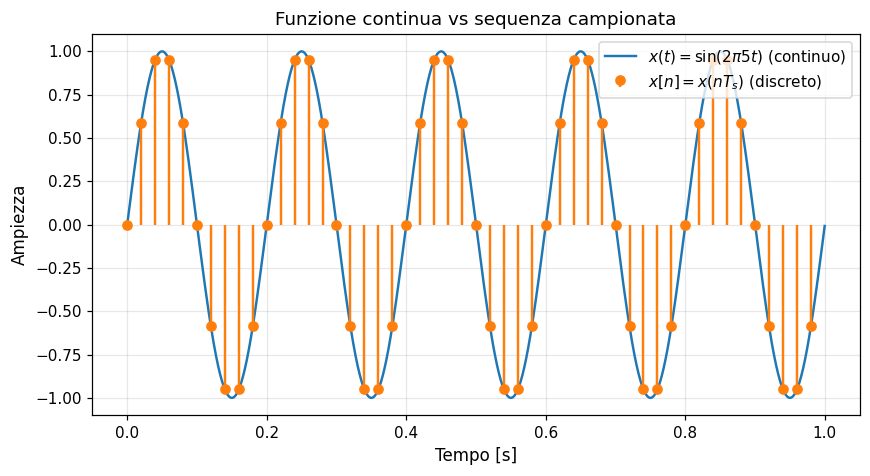

In [3]:
# Confronto visivo tra funzione continua e sequenza campionata
f0 = 5.0           # frequenza del segnale [Hz]
T  = 1.0           # durata [s]
Fs = 50.0          # frequenza di campionamento [Hz]
Ts = 1.0/Fs

# Tempo "continuo" (in realtà molto fitto: 4000 punti)
t_cont = np.linspace(0, T, 4000, endpoint=False)
x_cont = np.sin(2*np.pi*f0*t_cont)

# Tempo discreto
n      = np.arange(0, int(T*Fs))
t_disc = n*Ts
x_disc = np.sin(2*np.pi*f0*t_disc)

fig, ax = plt.subplots()
ax.plot(t_cont, x_cont, label=r"$x(t)=\sin(2\pi 5 t)$ (continuo)")
ax.stem(t_disc, x_disc, linefmt="C1-", markerfmt="C1o", basefmt=" ", label=r"$x[n]=x(nT_s)$ (discreto)")
ax.set_xlabel("Tempo [s]"); ax.set_ylabel("Ampiezza")
ax.set_title("Funzione continua vs sequenza campionata")
ax.legend(loc="upper right"); plt.show()


**Errori comuni.**

* Confondere $x(t)$ con $x[n]$: il primo ha unità di tempo (s), il secondo è un
  semplice indice intero.
* Pensare che "campionare bene" voglia dire usare tanti punti: come vedremo, la
  cosa decisiva è la **frequenza** di campionamento, non il numero di punti.

**Must remember.** Una sequenza è una funzione $\mathbb{Z}\to\mathbb{R}$;
il campionamento mappa $x(t)$ in $x[n]=x(nT_s)$.


## 0.2 Limiti, continuità e derivate

**Intuizione di limite.** Scrivere $\lim_{t\to t_0} x(t) = L$ significa
"più $t$ si avvicina a $t_0$, più $x(t)$ si avvicina a $L$, in modo che possiamo
rendere la distanza fra $x(t)$ e $L$ piccola quanto vogliamo, purché ci avviciniamo
abbastanza".

**Definizione $(\varepsilon,\delta)$.** Diciamo $\lim_{t\to t_0} x(t) = L$ se
$\forall\,\varepsilon>0\ \exists\,\delta>0$ tale che
$0<|t-t_0|<\delta \Rightarrow |x(t)-L|<\varepsilon$.

**Continuità.** $x$ è continua in $t_0$ se $\lim_{t\to t_0} x(t) = x(t_0)$.
Un segnale fisico "ragionevole" è continuo a tratti.

**Derivata.** La derivata di $x$ in $t_0$ è il numero (se esiste)
$$
x'(t_0) \;=\; \lim_{h\to 0}\frac{x(t_0+h)-x(t_0)}{h}.
$$
Geometricamente è la pendenza della tangente al grafico in $t_0$; fisicamente è la
*velocità di variazione*. Per un ECG $x(t)$ in mV, $x'(t)$ ha unità di mV/s.

**Significato nei segnali.** La derivata accentua i fronti rapidi e attenua le
componenti lente. Nel dominio della frequenza, derivare equivale a moltiplicare
per $j\Omega$ (segnale continuo) o per qualcosa di "simile" nel discreto.

**Derivata numerica.** Sostituiamo $h$ con il passo $T_s$ del campionamento:

* differenza in avanti: $x'(nT_s) \approx \dfrac{x[n+1]-x[n]}{T_s}$,
* differenza centrale (più accurata): $x'(nT_s) \approx \dfrac{x[n+1]-x[n-1]}{2T_s}$.

**Derivazione dell'errore.** Con Taylor (vedi §0.4):
$x(t+h) = x(t) + h\,x'(t) + \tfrac{h^2}{2}x''(t) + O(h^3)$ e
$x(t-h) = x(t) - h\,x'(t) + \tfrac{h^2}{2}x''(t) + O(h^3)$. Sottraendo:
$x(t+h)-x(t-h) = 2h\,x'(t) + O(h^3)$, quindi la differenza centrale ha errore
$O(h^2)$, mentre la differenza in avanti ha errore $O(h)$.

**Esempio numerico.** Per $x(t)=\sin(t)$ in $t=1$: $x'(1)=\cos(1)\approx 0.5403$.


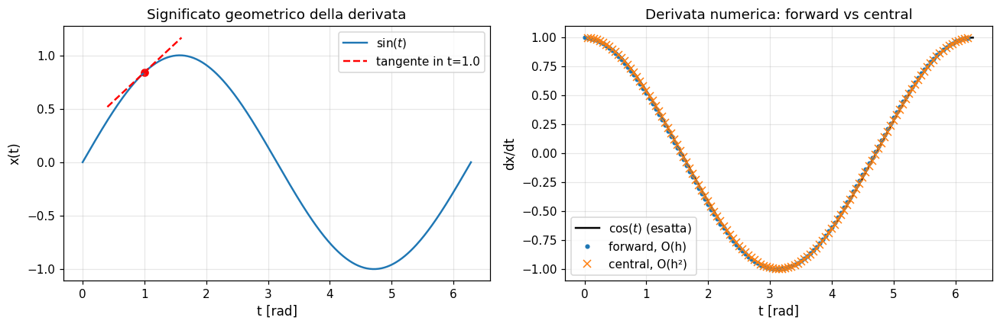

In [4]:
# Derivata numerica di sin(t) e visualizzazione della tangente in un punto
t  = np.linspace(0, 2*np.pi, 400)
x  = np.sin(t)

# Derivata "esatta": cos(t)
xprime_exact = np.cos(t)

# Approssimazioni
h = 0.05
# differenza in avanti su griglia regolare
t_fwd = np.arange(t.min(), t.max()-h, h)
x_fwd = np.sin(t_fwd)
fwd   = (np.sin(t_fwd + h) - x_fwd) / h
# differenza centrale
t_ctr = np.arange(t.min()+h, t.max()-h, h)
ctr   = (np.sin(t_ctr + h) - np.sin(t_ctr - h)) / (2*h)

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].plot(t, x, label=r"$\sin(t)$")
# tangente in t0=1
t0 = 1.0
y0, m = np.sin(t0), np.cos(t0)
tt = np.linspace(t0-0.6, t0+0.6, 50)
axes[0].plot(tt, y0 + m*(tt - t0), "r--", label=f"tangente in t={t0}")
axes[0].scatter([t0], [y0], color="r")
axes[0].set_title("Significato geometrico della derivata")
axes[0].set_xlabel("t [rad]"); axes[0].set_ylabel("x(t)")
axes[0].legend()

axes[1].plot(t, xprime_exact, "k", label=r"$\cos(t)$ (esatta)")
axes[1].plot(t_fwd, fwd, ".", label="forward, O(h)")
axes[1].plot(t_ctr, ctr, "x", label="central, O(h²)")
axes[1].set_title("Derivata numerica: forward vs central")
axes[1].set_xlabel("t [rad]"); axes[1].set_ylabel("dx/dt")
axes[1].legend()
plt.tight_layout(); plt.show()


**Errori comuni.**

* Usare $h$ troppo piccolo in floating point: si guadagna in errore di
  troncamento, ma si paga in errore di arrotondamento. Esiste un $h$ ottimo.
* Confondere la derivata di $x[n]$ (segnale discreto) con quella di $x(t)$: nel
  discreto si usa la *differenza prima*, che è un filtro FIR.

**Must remember.** La derivata misura quanto velocemente cambia il segnale; nel
discreto la sostituiamo con una differenza, che è un'operazione di filtraggio.


## 0.3 Integrali

**Intuizione.** L'integrale definito $\int_a^b x(t)\,dt$ è l'area (con segno) del
grafico di $x$ fra $a$ e $b$. Per i segnali rappresenta accumulo: carica, energia,
massa, eccetera.

**Definizione (Riemann).** Suddividiamo $[a,b]$ in $N$ intervalli di larghezza
$\Delta t_k$; scelto un punto $\xi_k$ in ciascuno, formiamo la somma
$S_N = \sum_{k=1}^N x(\xi_k)\,\Delta t_k$. Se $S_N$ converge a un numero $I$ al
raffinare la partizione, indipendentemente dalle scelte, allora $I = \int_a^b x\,dt$.

**Proprietà chiave.**

$$
\int_a^b \big(\alpha x + \beta y\big)\,dt = \alpha\int_a^b x\,dt + \beta\int_a^b y\,dt,\qquad
\int_a^b x\,dt = -\int_b^a x\,dt.
$$

**Integrale improprio.** Se $b=\infty$: $\int_a^\infty x\,dt = \lim_{T\to\infty}\int_a^T x\,dt$,
purché il limite esista finito.

**Energia di un segnale.** Per un segnale reale di durata finita:
$E = \int_{-\infty}^{\infty} x(t)^2\,dt$. Per un segnale discreto: $E = \sum_n x[n]^2$.

**Potenza media (segnale a potenza)**:
$P = \lim_{T\to\infty}\frac{1}{2T}\int_{-T}^{T} x(t)^2\,dt$.

**Esempio numerico.** Calcoliamo $\int_0^\pi \sin(t)\,dt$. Per Newton-Leibniz:
$[-\cos t]_0^\pi = -\cos\pi + \cos 0 = 2$. Numericamente verifichiamolo con la
*regola dei trapezi* (vedi sotto).

**Regola dei trapezi.** Su griglia uniforme $t_k = a+k h$, $k=0,\dots,N$:
$$
\int_a^b x(t)\,dt \approx h\Bigl(\tfrac{x_0+x_N}{2} + \sum_{k=1}^{N-1} x_k\Bigr).
$$
Errore $O(h^2)$ per $x$ sufficientemente liscia.


Integrale trapezi : 1.999543
Integrale esatto  : 2.000000
Errore relativo   : 2.28e-04


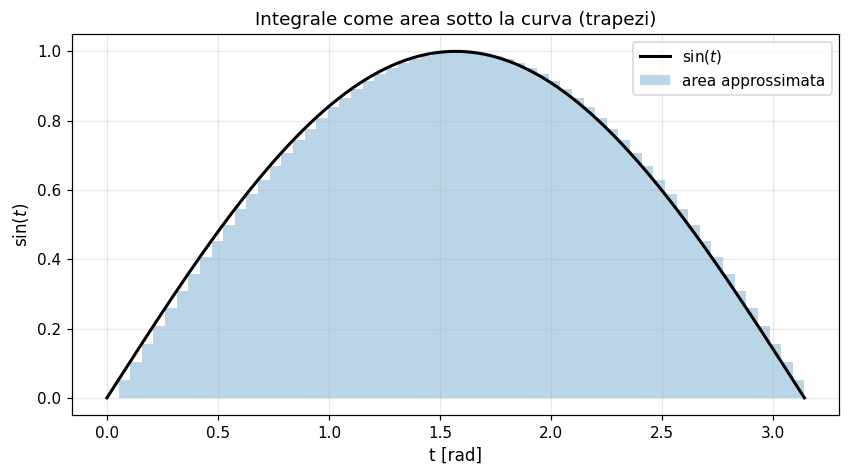

In [5]:
# Calcolo numerico di un integrale e visualizzazione "area sotto la curva"
a, b, N = 0.0, np.pi, 60
t = np.linspace(a, b, N+1)
x = np.sin(t)

# Regola dei trapezi a mano
h = (b - a)/N
I_trap = h*(0.5*x[0] + x[1:-1].sum() + 0.5*x[-1])
I_exact = 2.0
print(f"Integrale trapezi : {I_trap:.6f}")
print(f"Integrale esatto  : {I_exact:.6f}")
print(f"Errore relativo   : {abs(I_trap-I_exact)/I_exact:.2e}")

# Grafico: area come istogramma di trapezi
tt = np.linspace(a, b, 400)
fig, ax = plt.subplots()
ax.plot(tt, np.sin(tt), "k", lw=2, label=r"$\sin(t)$")
ax.fill_between(t, 0, x, alpha=0.3, step="post", label="area approssimata")
ax.set_title("Integrale come area sotto la curva (trapezi)")
ax.set_xlabel("t [rad]"); ax.set_ylabel(r"$\sin(t)$"); ax.legend()
plt.show()


**Significato per i segnali.** $\int_{t_0}^{t_0+T} x(t)\,dt$ è la *media* di
$x$ su una finestra di durata $T$ moltiplicata per $T$: un integratore è un filtro
passabasso.

**Errori comuni.**

* Calcolare l'integrale di un segnale con offset DC senza accorgersene: l'area
  esplode con $T$.
* Confondere energia (integrale di $x^2$) con potenza (media di $x^2$).

**Must remember.** L'integrale è accumulo (carica, energia, area); numericamente
basta una somma pesata dei campioni.


## 0.4 Serie e approssimazioni

**Serie numeriche.** Una serie è la "somma infinita" $\sum_{k=0}^\infty a_k$,
definita come limite delle somme parziali $S_N = \sum_{k=0}^N a_k$.

**Serie di potenze.** $\sum_{k=0}^\infty c_k (t-t_0)^k$ converge in un *raggio*
$R \in [0,+\infty]$ attorno a $t_0$: per $|t-t_0|<R$ la somma esiste finita.

**Serie di Taylor.** Se $x$ è derivabile infinite volte in $t_0$, la sua serie di
Taylor è
$$
x(t) \;=\; \sum_{k=0}^\infty \frac{x^{(k)}(t_0)}{k!}\,(t-t_0)^k.
$$
La serie troncata $T_N$ è il *polinomio di Taylor* di grado $N$ ed è la migliore
approssimazione polinomiale locale di $x$ vicino a $t_0$.

**Perché serve nei segnali.** Permette di linearizzare modelli non lineari (es.
intorno al punto di lavoro di un amplificatore); è la base della derivazione delle
formule di derivazione numerica; ed è il punto di partenza per giustificare la
trasformazione bilineare nei filtri (§5).

**Esempio importante.** Sviluppando $\sin$ attorno a $t=0$:
$$
\sin t \;=\; t - \frac{t^3}{3!} + \frac{t^5}{5!} - \frac{t^7}{7!} + \cdots
$$
Per $|t|$ piccolo, $\sin t \approx t$ con errore $|t|^3/6$.

**Derivazione (caso $\sin$).** $\sin^{(k)}(0)$ vale $0,1,0,-1,0,1,\dots$, ciclo di
periodo 4. Quindi sopravvivono solo i termini di indice dispari con segno
alternato, e si ottiene la formula precedente.

**Grafico: confronto fra $\sin t$ e i suoi polinomi di Taylor di grado crescente.**


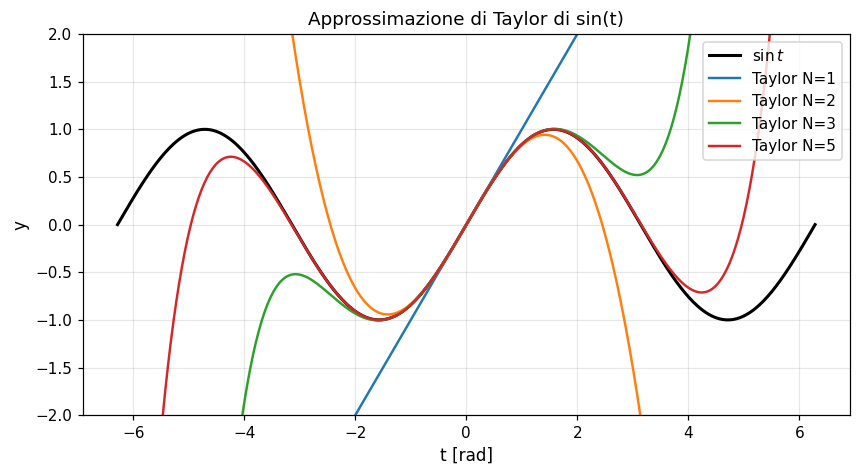

In [6]:
# Approssimazione di sin(t) con polinomi di Taylor di grado crescente
from math import factorial

def taylor_sin(t, N):
    # Polinomio di Taylor di sin(t) con N termini non nulli (gradi 1, 3, 5, ...).
    s = np.zeros_like(t)
    for k in range(N):
        s = s + ((-1)**k) / factorial(2*k+1) * t**(2*k+1)
    return s

t = np.linspace(-2*np.pi, 2*np.pi, 500)
fig, ax = plt.subplots()
ax.plot(t, np.sin(t), "k", lw=2, label=r"$\sin t$")
for N in [1, 2, 3, 5]:
    ax.plot(t, taylor_sin(t, N), label=f"Taylor N={N}")
ax.set_ylim(-2, 2)
ax.set_title("Approssimazione di Taylor di sin(t)")
ax.set_xlabel("t [rad]"); ax.set_ylabel("y")
ax.legend(); plt.show()


**Errori comuni.**

* Pensare che Taylor converga sempre ovunque: nei casi reali è solo locale, e la
  qualità dipende dal raggio di convergenza.
* Usare un'approssimazione di grado basso lontano dal punto di sviluppo: l'errore
  esplode.

**Must remember.** Taylor approssima localmente un segnale con un polinomio; più
gradi, più precisione vicino al punto, ma niente garantisce la qualità lontano.


## 0.5 Vettori, matrici e spazi vettoriali

**Vettori come liste ordinate.** $\mathbf{x} = (x_1, x_2, \dots, x_N)^\top \in \mathbb{R}^N$.

**Vettori come segnali campionati.** Una sequenza $x[0], x[1], \dots, x[N-1]$ è
**esattamente** un vettore di $\mathbb{R}^N$. Tutto l'algebra lineare diventa
quindi DSP.

**Operazioni di base.**

$$
\mathbf{x}+\mathbf{y} = (x_1+y_1,\dots,x_N+y_N)^\top,\qquad
\alpha\mathbf{x} = (\alpha x_1,\dots,\alpha x_N)^\top.
$$

**Prodotto interno (scalare)**:
$$
\langle \mathbf{x}, \mathbf{y}\rangle \;=\; \sum_{n=1}^N x_n\,y_n
\quad\Big(\text{caso complesso: } \sum x_n\overline{y_n}\Big).
$$

**Norma euclidea e distanza.**
$\|\mathbf{x}\| = \sqrt{\langle\mathbf{x},\mathbf{x}\rangle}$,
$d(\mathbf{x},\mathbf{y}) = \|\mathbf{x}-\mathbf{y}\|$.

**Matrici come trasformazioni lineari.** Una matrice $A\in\mathbb{R}^{M\times N}$
manda $\mathbf{x}\in\mathbb{R}^N$ in $A\mathbf{x}\in\mathbb{R}^M$. Tutte le
operazioni di DSP lineare (convoluzione, DFT, filtri lineari, derivata discreta) si
possono scrivere come moltiplicazioni matrice-vettore.

**Prodotto matrice-vettore espanso (3×3 esplicito).**

$$
A\,\mathbf{x} \;=\;
\begin{pmatrix}
a_{11} & a_{12} & a_{13}\\
a_{21} & a_{22} & a_{23}\\
a_{31} & a_{32} & a_{33}
\end{pmatrix}
\begin{pmatrix} x_1 \\ x_2 \\ x_3 \end{pmatrix}
\;=\;
\begin{pmatrix}
a_{11}x_1 + a_{12}x_2 + a_{13}x_3 \\
a_{21}x_1 + a_{22}x_2 + a_{23}x_3 \\
a_{31}x_1 + a_{32}x_2 + a_{33}x_3
\end{pmatrix}.
$$

Ogni componente di $A\mathbf{x}$ è il prodotto interno della corrispondente riga
di $A$ con $\mathbf{x}$.

**Significato fisico.** Un filtro LTI lineare con risposta finita $h$ trasforma il
segnale di ingresso $x$ tramite una matrice di convoluzione $H$ (vedi §0.11). Il
filtraggio è quindi una moltiplicazione matrice-vettore.


In [7]:
# Prodotto matrice-vettore esplicito con doppi cicli + versione numpy
A = np.array([[1, 2, 3],
              [0, -1, 2],
              [1, 0, 1]], dtype=float)
x = np.array([1.0, 2.0, 3.0])

# Versione esplicita (didattica)
M, N = A.shape
y_explicit = np.zeros(M)
for i in range(M):                # ciclo sulle righe
    s = 0.0
    for j in range(N):            # ciclo sulle colonne
        s += A[i, j] * x[j]       # somma dei prodotti
    y_explicit[i] = s

# Versione ottimizzata
y_numpy = A @ x

print("y esplicito :", y_explicit)
print("y NumPy     :", y_numpy)
print("norma di x  :", np.linalg.norm(x))
print("⟨x,x⟩       :", x @ x)


y esplicito : [14.  4.  4.]
y NumPy     : [14.  4.  4.]
norma di x  : 3.7416573867739413
⟨x,x⟩       : 14.0


**Errori comuni.**

* Dimenticare che `A @ x` richiede dimensioni compatibili: `A.shape[1] == len(x)`.
* Confondere $\mathbf{x}^\top\mathbf{y}$ (scalare) con $\mathbf{x}\,\mathbf{y}^\top$
  (matrice rango 1).
* Per vettori complessi, dimenticare il coniugato nel prodotto interno.

**Must remember.** Segnali = vettori; filtri LTI lineari = matrici; un'operazione
lineare sui campioni è sempre $\mathbf{y}=A\mathbf{x}$ per qualche $A$.


## 0.6 Ortogonalità, basi e proiezioni

**Definizione di ortogonalità.** Due vettori $\mathbf{u}, \mathbf{v}$ sono
ortogonali se $\langle \mathbf{u}, \mathbf{v}\rangle = 0$.

**Base canonica di $\mathbb{R}^3$.** $\mathbf{e}_1=(1,0,0)^\top,\
\mathbf{e}_2=(0,1,0)^\top,\ \mathbf{e}_3=(0,0,1)^\top$. È ortonormale:
$\langle \mathbf{e}_i, \mathbf{e}_j \rangle = \delta_{ij}$.

**Proiezione di un vettore su un altro.** La proiezione di $\mathbf{x}$ sulla
direzione di $\mathbf{u}$ è
$$
\operatorname{proj}_{\mathbf{u}}\mathbf{x}
\;=\;
\frac{\langle \mathbf{x},\mathbf{u}\rangle}{\langle \mathbf{u},\mathbf{u}\rangle}\,\mathbf{u}.
$$

**Proiezione su una base ortonormale $\{\mathbf{u}_k\}$.**
$$
\mathbf{x} \;=\; \sum_k \langle \mathbf{x}, \mathbf{u}_k\rangle \,\mathbf{u}_k.
$$
Ogni coefficiente è un prodotto interno: una **misura di quanto** la base è
presente nel segnale.

**Collegamento con Fourier.** Le sinusoidi (o gli esponenziali complessi) formano
una base ortogonale per i segnali periodici. I coefficienti di Fourier sono
proiezioni del segnale su tali basi.

**Esempio di proiezione in $\mathbb{R}^2$.** Decomporre $\mathbf{x}=(2,1)^\top$ su
$\mathbf{u}_1=(1,1)^\top/\sqrt 2$ e $\mathbf{u}_2=(1,-1)^\top/\sqrt 2$. Si trova
$\mathbf{x} = \tfrac{3}{\sqrt 2}\mathbf{u}_1 + \tfrac{1}{\sqrt 2}\mathbf{u}_2$.


c1 = ⟨x,u1⟩ = 2.1213
c2 = ⟨x,u2⟩ = 0.7071
ricostruzione c1 u1 + c2 u2 = [2. 1.]
errore di ricostruzione    = 4.58e-16


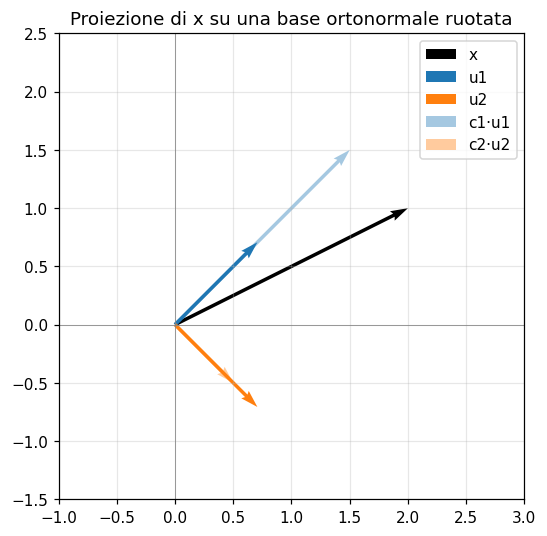

In [8]:
# Proiezione di un vettore di R^2 su una base ortonormale ruotata di 45°
u1 = np.array([1, 1])/np.sqrt(2)
u2 = np.array([1, -1])/np.sqrt(2)
x  = np.array([2.0, 1.0])

c1 = x @ u1                  # proiezione di x su u1
c2 = x @ u2                  # proiezione di x su u2
x_rec = c1*u1 + c2*u2        # ricostruzione

print(f"c1 = ⟨x,u1⟩ = {c1:.4f}")
print(f"c2 = ⟨x,u2⟩ = {c2:.4f}")
print(f"ricostruzione c1 u1 + c2 u2 = {x_rec}")
print(f"errore di ricostruzione    = {np.linalg.norm(x - x_rec):.2e}")

fig, ax = plt.subplots(figsize=(5.5, 5.5))
ax.axhline(0, color="gray", lw=0.5); ax.axvline(0, color="gray", lw=0.5)
ax.quiver(0,0, x[0], x[1], angles="xy", scale_units="xy", scale=1, color="k", label="x")
ax.quiver(0,0, u1[0], u1[1], angles="xy", scale_units="xy", scale=1, color="C0", label="u1")
ax.quiver(0,0, u2[0], u2[1], angles="xy", scale_units="xy", scale=1, color="C1", label="u2")
ax.quiver(0,0, c1*u1[0], c1*u1[1], angles="xy", scale_units="xy", scale=1, color="C0", alpha=0.4, label="c1·u1")
ax.quiver(0,0, c2*u2[0], c2*u2[1], angles="xy", scale_units="xy", scale=1, color="C1", alpha=0.4, label="c2·u2")
ax.set_xlim(-1, 3); ax.set_ylim(-1.5, 2.5)
ax.set_aspect("equal", adjustable="box")
ax.set_title("Proiezione di x su una base ortonormale ruotata")
ax.legend(); plt.show()


**Errori comuni.**

* Usare una base non ortogonale e pretendere coefficienti come prodotti interni:
  servono prima le *equazioni normali* (§capitolo matrici).
* Dimenticare la normalizzazione: se $\|\mathbf{u}_k\|\ne 1$, dividere per
  $\|\mathbf{u}_k\|^2$.

**Must remember.** Su una base ortonormale, scomporre un segnale = calcolare
prodotti interni. Fourier farà esattamente questo con sinusoidi/esponenziali
complessi.


## 0.7 Numeri complessi

**Forma algebrica.** $z = a + jb$, con $a,b\in\mathbb{R}$ e $j^2=-1$ (in
matematica si usa spesso $i$; in ingegneria $j$ per non confonderlo con la
corrente).

**Forma polare.** $z = r\,e^{j\theta}$ con $r=|z|=\sqrt{a^2+b^2}$ e
$\theta = \arg(z) = \operatorname{atan2}(b, a)$.

**Coniugato.** $\bar z = a - jb$. Soddisfa $z\bar z = a^2+b^2 = |z|^2$.

**Formula di Eulero.** $e^{j\theta} = \cos\theta + j\sin\theta$.
Conseguenza fondamentale:
$$
\cos\theta = \frac{e^{j\theta}+e^{-j\theta}}{2},\qquad
\sin\theta = \frac{e^{j\theta}-e^{-j\theta}}{2j}.
$$

**Significato fisico.** $e^{j\Omega t}$ è una **rotazione** sul piano complesso
con velocità angolare $\Omega$ rad/s. Una sinusoide reale è la somma di **due**
rotazioni in versi opposti.

**Esponenziale complesso come rotazione.** Tracciando $e^{j\theta}$ al variare di
$\theta$ otteniamo il cerchio unitario; la velocità di rotazione è la frequenza.

**Derivazione di $\cos$ come somma di esponenziali.** Da $e^{j\theta}=\cos\theta+j\sin\theta$
e $e^{-j\theta}=\cos\theta-j\sin\theta$, sommando otteniamo $2\cos\theta$, da cui
la formula precedente.


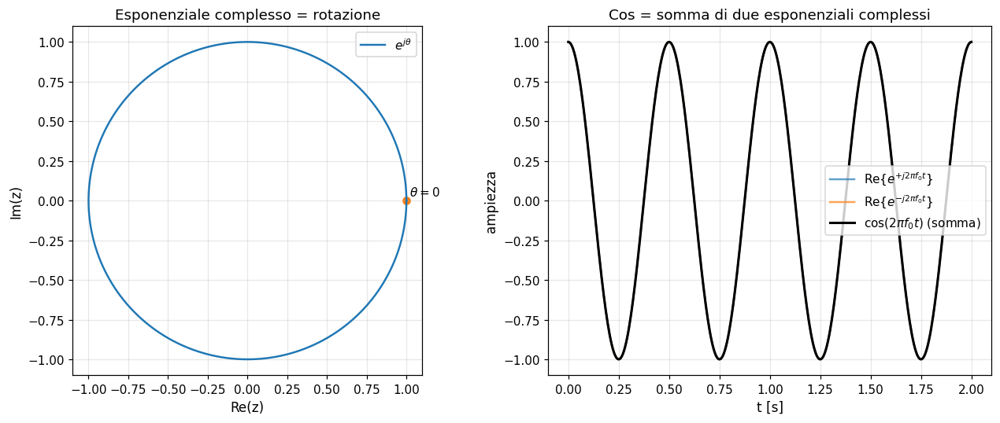

In [9]:
# Visualizziamo:
#   (a) l'esponenziale complesso che ruota sul piano complesso
#   (b) una sinusoide reale come somma di due esponenziali complessi controruotanti
theta = np.linspace(0, 2*np.pi, 200)
z = np.exp(1j*theta)

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

ax = axes[0]
ax.plot(z.real, z.imag, label=r"$e^{j\theta}$")
ax.scatter([1], [0], color="C1")
ax.annotate(r"$\theta=0$", (1.02, 0.03))
ax.set_xlabel("Re(z)"); ax.set_ylabel("Im(z)")
ax.set_aspect("equal", adjustable="box")
ax.set_title("Esponenziale complesso = rotazione")
ax.legend()

ax = axes[1]
t = np.linspace(0, 2, 400)
f0 = 2.0
e_plus  = np.exp(1j*2*np.pi*f0*t)
e_minus = np.exp(-1j*2*np.pi*f0*t)
cos_real = 0.5*(e_plus + e_minus)        # = cos(2πf0 t), reale
ax.plot(t, np.real(e_plus),  label=r"Re$\{e^{+j 2\pi f_0 t}\}$", alpha=0.7)
ax.plot(t, np.real(e_minus), label=r"Re$\{e^{-j 2\pi f_0 t}\}$", alpha=0.7)
ax.plot(t, np.real(cos_real), "k", lw=2, label=r"$\cos(2\pi f_0 t)$ (somma)")
ax.set_title("Cos = somma di due esponenziali complessi")
ax.set_xlabel("t [s]"); ax.set_ylabel("ampiezza")
ax.legend()
plt.tight_layout(); plt.show()


**Errori comuni.**

* Scrivere $\arg(z) = \arctan(b/a)$ ignorando il segno di $a$: serve `atan2(b, a)`
  per scegliere il quadrante corretto.
* Dimenticare che $|e^{j\theta}|=1$ per qualsiasi $\theta$ reale.
* Trattare le frequenze negative come fisicamente reali: per segnali reali sono
  un artefatto matematico della rappresentazione complessa (compaiono in coppia
  coniugata).

**Must remember.** L'esponenziale complesso è l'oggetto più importante del DSP:
ruota, e tutte le sinusoidi reali sono somme di rotazioni.


## 0.8 Analisi complessa essenziale

**Funzione complessa.** Una funzione $f: U\subseteq\mathbb{C}\to\mathbb{C}$, ad
esempio $f(z)=1/(1-a z^{-1})$ che incontreremo nella trasformata Z.

**Olomorfia (analiticità).** $f$ è olomorfa in $z_0$ se esiste e finito il limite
$$
f'(z_0) \;=\; \lim_{z\to z_0}\frac{f(z)-f(z_0)}{z-z_0},
$$
**indipendente** dalla direzione lungo cui $z\to z_0$. Equivalentemente: $f$ si
sviluppa in serie di potenze attorno a $z_0$, oppure soddisfa le equazioni di
**Cauchy–Riemann**: se $f=u+jv$ e $z=x+jy$, allora
$\partial_x u = \partial_y v$ e $\partial_y u = -\partial_x v$.

**Singolarità.** Punti dove $f$ non è olomorfa. Per le funzioni razionali
(quozienti di polinomi) le singolarità più importanti sono i **poli**.

**Zeri e poli.** Se $f(z)=N(z)/D(z)$:

* **zeri**: $z_0$ tali che $N(z_0)=0$ e $D(z_0)\ne 0$;
* **poli**: $z_0$ tali che $D(z_0)=0$ e $N(z_0)\ne 0$.

**Contorni.** Una curva orientata $\gamma$ nel piano complesso, tipicamente chiusa.

**Integrale di linea.** $\int_\gamma f(z)\,dz$, calcolato parametrizzando $\gamma$.

**Teorema di Cauchy.** Se $f$ è olomorfa in un dominio semplicemente connesso $D$
e $\gamma\subset D$ è un cammino chiuso, allora $\oint_\gamma f(z)\,dz = 0$.

**Formula integrale di Cauchy.** Se $f$ è olomorfa in $D$ e $\gamma$ è una curva
chiusa che racchiude $z_0$:
$$
f(z_0) \;=\; \frac{1}{2\pi j}\oint_\gamma \frac{f(z)}{z-z_0}\,dz.
$$

**Teorema dei residui.** Se $f$ è olomorfa in $D$ tranne in un numero finito di
poli $z_k$ interni a $\gamma$:
$$
\oint_\gamma f(z)\,dz \;=\; 2\pi j \sum_k \operatorname{Res}\bigl(f, z_k\bigr).
$$

Il residuo in un polo semplice $z_k$ è
$\operatorname{Res}(f, z_k) = \lim_{z\to z_k} (z-z_k)\,f(z)$.

**Perché ci serve.** L'antitrasformata Z si scrive come un integrale di contorno
nel piano complesso: il teorema dei residui ne dà il valore in forma chiusa
(§0.9).


In [10]:
# Verifica numerica: il residuo di 1/(z-a) in z=a deve essere 1
a = 0.6
# Integriamo lungo il cerchio |z| = R, con R > |a|, in senso antiorario.
R = 1.2
theta = np.linspace(0, 2*np.pi, 4000, endpoint=False)
z = R*np.exp(1j*theta)
dz = 1j*R*np.exp(1j*theta) * (theta[1]-theta[0])

f = 1.0 / (z - a)
I = np.sum(f * dz)
print("∮ 1/(z-a) dz / (2πj) =", I / (2j*np.pi))
print("teorema dei residui  : Res(1/(z-a), a) = 1")


∮ 1/(z-a) dz / (2πj) = (1+0j)
teorema dei residui  : Res(1/(z-a), a) = 1


**Errori comuni.**

* Dimenticare il fattore $2\pi j$.
* Includere/escludere il polo in modo sbagliato: il teorema dei residui conta
  **solo** i poli **interni** al contorno.
* Confondere ROC e contorno: la ROC dice dove la serie converge, il contorno è
  la curva su cui integriamo per estrarre i coefficienti.

**Must remember.** Tutta la teoria dell'antitrasformata Z poggia su tre fatti:
olomorfia, poli interni a un contorno, residuo come coefficiente dominante.


## 0.9 Residui e antitrasformata Z (esempio completo)

**Definizione di trasformata Z.** Data una sequenza $x[n]$, la sua trasformata Z
bilatera è
$$
X(z) \;=\; \sum_{n=-\infty}^{+\infty} x[n]\,z^{-n}.
$$
La **regione di convergenza** (ROC) è l'insieme di $z\in\mathbb{C}$ per cui la
serie converge assolutamente.

**Antitrasformata Z (formula generale).**
$$
x[n] \;=\; \frac{1}{2\pi j}\oint_C X(z)\,z^{n-1}\,dz,
$$
dove $C$ è un cammino chiuso, orientato in senso antiorario, interamente
contenuto nella ROC.

**Esempio fondamentale.**

$$
X(z) \;=\; \frac{1}{1 - a\,z^{-1}}, \qquad \text{con ROC } |z| > |a|.
$$

Vogliamo trovare $x[n]$.

**Strada 1 — sviluppo in serie geometrica.** Per $|z|>|a|$ vale $|a z^{-1}|<1$, quindi
$$
X(z) \;=\; \sum_{k=0}^\infty (a\,z^{-1})^k \;=\; \sum_{k=0}^\infty a^k\,z^{-k}.
$$
Confrontando con la definizione di $X(z)=\sum_n x[n] z^{-n}$ deduciamo
$x[n] = a^n$ per $n\ge 0$ e $x[n]=0$ per $n<0$. Quindi $x[n] = a^n u[n]$.

**Strada 2 — residui.** Riscriviamo $X(z) = z/(z-a)$, dunque l'integrando vale
$X(z)\,z^{n-1} = z^n/(z-a)$. Sul contorno $C: |z|=R$ con $R>|a|$, l'unico polo
interno è $z=a$ (semplice). Per il teorema dei residui:
$$
x[n] \;=\; \operatorname{Res}\!\left(\frac{z^n}{z-a},\,a\right) \;=\; a^n,\quad n\ge 0.
$$

Per $n<0$ l'integrando ha un polo in $z=0$ di ordine $|n|$ in più; con un cambio
di variabile $w=1/z$ si mostra che, **nella ROC $|z|>|a|$**, l'integrale dà $0$.
Quindi $x[n]=0$ per $n<0$, in accordo con la prima strada.

**Caso con ROC opposta.** Se invece la ROC è $|z|<|a|$, la serie geometrica si
sviluppa con potenze di $a^{-1} z$:
$$
X(z) \;=\; \frac{1}{1-a z^{-1}}
\;=\; \frac{-a^{-1} z}{1 - a^{-1} z}
\;=\; -\sum_{k=1}^\infty a^{-k}\,z^{k}
\;=\; -\sum_{n=-\infty}^{-1} a^{n}\,z^{-n}.
$$
Quindi $x[n] = -a^n$ per $n\le -1$ e $x[n]=0$ per $n\ge 0$, cioè
$x[n] = -a^n u[-n-1]$ (sequenza anticausale).

**Morale.** La **stessa $X(z)$** può corrispondere a sequenze diverse a seconda
della ROC. La ROC, non solo l'espressione algebrica, identifica univocamente
$x[n]$.


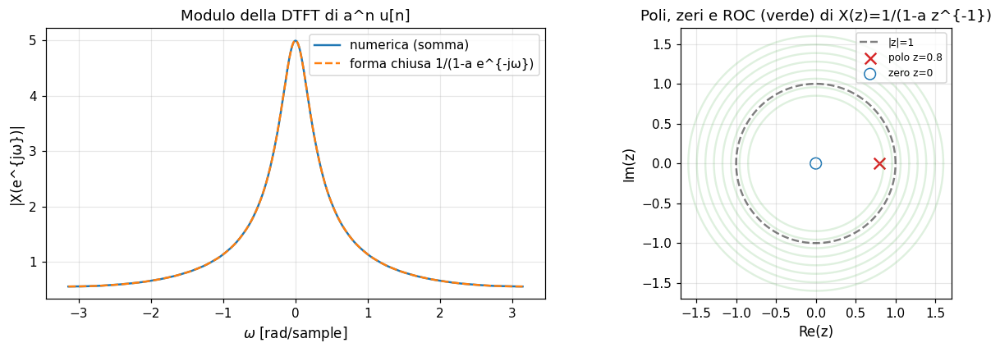

In [11]:
# Esempio numerico: verifica che (1/(1 - a z^{-1}), ROC |z|>|a|) ↔ a^n u[n]
a = 0.8
N = 30
n = np.arange(0, N)
x_causal = a**n  # x[n] = a^n u[n]

# Calcoliamo numericamente X(z) sulla circonferenza unitaria (DTFT) e confrontiamo
omega = np.linspace(-np.pi, np.pi, 4096)
z_unit = np.exp(1j*omega)
X_dtft_numeric = np.array([np.sum(x_causal * z_**(-n)) for z_ in z_unit])
X_dtft_closed  = 1.0/(1.0 - a*np.exp(-1j*omega))

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].plot(omega, np.abs(X_dtft_numeric), label="numerica (somma)")
axes[0].plot(omega, np.abs(X_dtft_closed),  "--", label="forma chiusa 1/(1-a e^{-jω})")
axes[0].set_xlabel(r"$\omega$ [rad/sample]"); axes[0].set_ylabel("|X(e^{jω})|")
axes[0].set_title("Modulo della DTFT di a^n u[n]"); axes[0].legend()

# Diagramma poli/ROC
ax = axes[1]
theta = np.linspace(0, 2*np.pi, 400)
ax.plot(np.cos(theta), np.sin(theta), "k--", alpha=0.5, label="|z|=1")
ax.fill_between(np.cos(theta), np.sin(theta), np.sin(theta)*0+1.6, alpha=0)  # solo per scala
# Poli e zeri
ax.scatter([a], [0], marker="x", color="C3", s=80, label=f"polo z={a}")
ax.scatter([0], [0], marker="o", facecolors="none", edgecolors="C0", s=80, label="zero z=0")
# ROC: |z| > |a|
phi = np.linspace(0, 2*np.pi, 200)
for r in np.linspace(abs(a)+0.05, 1.6, 8):
    ax.plot(r*np.cos(phi), r*np.sin(phi), color="C2", alpha=0.15)
ax.set_xlim(-1.7, 1.7); ax.set_ylim(-1.7, 1.7)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel("Re(z)"); ax.set_ylabel("Im(z)")
ax.set_title("Poli, zeri e ROC (verde) di X(z)=1/(1-a z^{-1})")
ax.legend(loc="upper right", fontsize=8)
plt.tight_layout(); plt.show()


**Errori comuni.**

* Trovare una $X(z)$ razionale e dimenticare di precisare la ROC.
* Confondere la circonferenza unitaria $|z|=1$ con la ROC: la circonferenza
  unitaria è il "luogo" dove vive la DTFT, la ROC è il dominio di convergenza.

**Must remember.** L'antitrasformata Z è un integrale di contorno; la ROC dice
quale contorno scegliere e quali poli sono interni.


## 0.10 Fourier come proiezione

**Prodotto interno fra funzioni periodiche di periodo $T$**:
$$
\langle x, y\rangle \;=\; \frac{1}{T}\int_0^T x(t)\overline{y(t)}\,dt.
$$

**Basi ortogonali di sinusoidi.** Le funzioni $\{e^{j\,2\pi k t/T}\}_{k\in\mathbb{Z}}$
sono ortonormali rispetto al prodotto interno sopra:
$\langle e^{j 2\pi k t/T}, e^{j 2\pi m t/T}\rangle = \delta_{km}$.

**Serie di Fourier (forma complessa).** Per $x$ periodica di periodo $T$:
$$
x(t) = \sum_{k=-\infty}^{+\infty} c_k\,e^{j 2\pi k t/T},\qquad
c_k = \frac{1}{T}\int_0^T x(t)\,e^{-j 2\pi k t/T}\,dt.
$$
Ogni $c_k$ è **esattamente la proiezione** di $x$ sull'armonica $k$-esima.

**Trasformata di Fourier continua.** Per $x$ non periodica (aperiodica, energia
finita):
$$
X(j\Omega) \;=\; \int_{-\infty}^{+\infty} x(t)\,e^{-j\Omega t}\,dt,\qquad
x(t) \;=\; \frac{1}{2\pi}\int_{-\infty}^{+\infty} X(j\Omega)\,e^{j\Omega t}\,d\Omega.
$$

**DTFT.** Per una sequenza $x[n]$ ($n\in\mathbb{Z}$):
$$
X(e^{j\omega}) \;=\; \sum_{n=-\infty}^{+\infty} x[n]\,e^{-j\omega n}.
$$
Funzione $2\pi$-periodica in $\omega$.

**DTFS.** Per sequenze periodiche $x[n+N]=x[n]$:
$$
X[k] \;=\; \sum_{n=0}^{N-1} x[n]\,e^{-j 2\pi k n/N},\qquad
x[n] \;=\; \frac{1}{N}\sum_{k=0}^{N-1} X[k]\,e^{j 2\pi k n/N}.
$$

**DFT.** Per sequenze **finite** $x[0],\dots,x[N-1]$ usiamo la stessa formula della
DTFS: è la versione algoritmica calcolata dalla FFT.

**Mappa concettuale finale.**

|  | Continuo | Discreto |
|---|---|---|
| Periodico | Serie di Fourier $c_k$ | DTFS $X[k]$ |
| Aperiodico | Trasformata $X(j\Omega)$ | DTFT $X(e^{j\omega})$ |

La DFT è la *versione algoritmica* della DTFS per segnali finiti. La FFT è solo
un algoritmo veloce per calcolare la DFT.

**Significato fondamentale.** *Trasformare un segnale* significa **proiettarlo
su una base di sinusoidi/esponenziali complessi** e leggere i coefficienti.


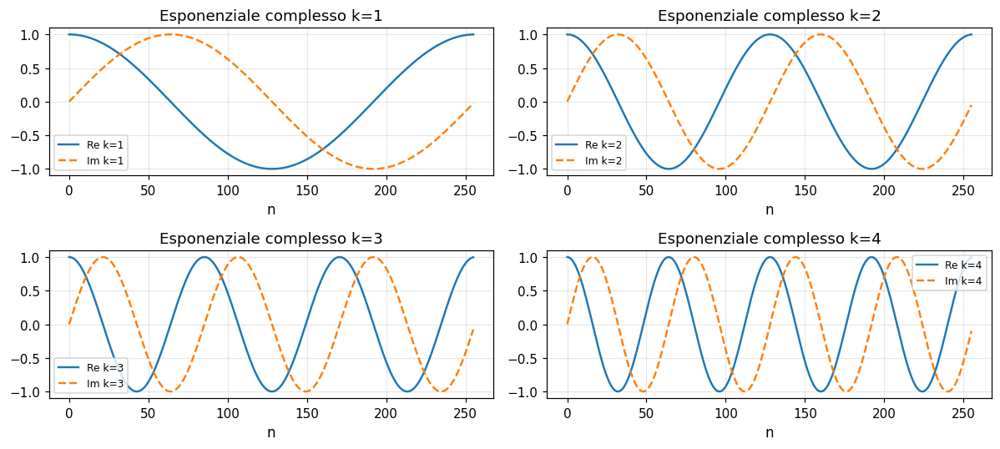

Matrice di Gram normalizzata (dovrebbe essere ~ identità):
[[1. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 1.]]


In [12]:
# Visualizziamo:
#  1) le prime basi sinusoidali e la loro ortogonalità "numerica"
#  2) la decomposizione di un'onda quadra periodica in serie di Fourier
N = 256
n = np.arange(N)
T = N  # periodo (in campioni)

# (1) basi e ortogonalità
fig, axes = plt.subplots(2, 2, figsize=(11, 5))
for ax, k in zip(axes.ravel(), [1, 2, 3, 4]):
    base_k = np.exp(1j*2*np.pi*k*n/T)
    ax.plot(n, base_k.real, label=f"Re k={k}")
    ax.plot(n, base_k.imag, "--", label=f"Im k={k}")
    ax.set_title(f"Esponenziale complesso k={k}")
    ax.set_xlabel("n"); ax.legend(fontsize=8)
plt.tight_layout(); plt.show()

# Ortogonalità numerica: matrice |⟨e_k, e_m⟩|
K = 6
B = np.exp(1j*2*np.pi*np.outer(np.arange(K), n)/T)
G = (B @ B.conj().T) / T
print("Matrice di Gram normalizzata (dovrebbe essere ~ identità):")
print(np.round(np.abs(G), 3))


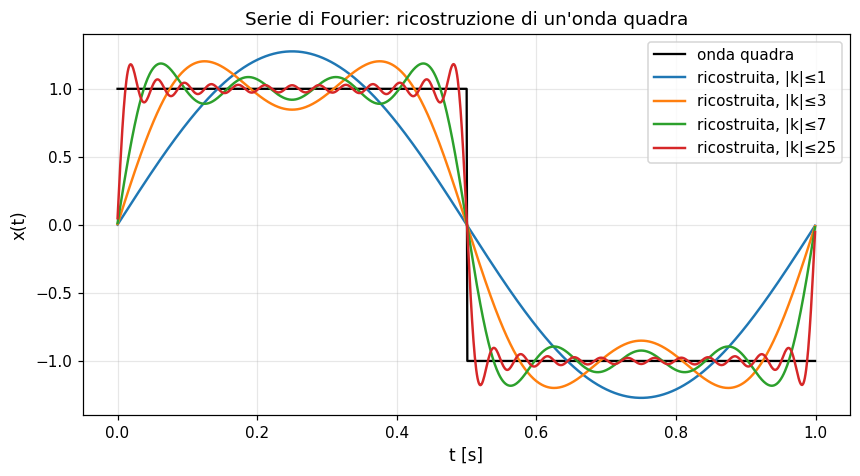

In [13]:
# Serie di Fourier numerica di un'onda quadra
T = 1.0
t = np.linspace(0, T, 1024, endpoint=False)
square = np.sign(np.sin(2*np.pi*t/T))
square[square == 0] = 1.0

# Calcoliamo i coefficienti c_k = (1/T) ∫ x(t) e^{-j2π k t/T} dt
def fourier_coeff(x, t, k, T):
    return (1/T) * np.trapezoid(x*np.exp(-1j*2*np.pi*k*t/T), t)

K = 25
coeffs = np.array([fourier_coeff(square, t, k, T) for k in range(-K, K+1)])

# Ricostruzione progressiva
fig, ax = plt.subplots()
ax.plot(t, square, "k", lw=1.5, label="onda quadra")
for Kused in [1, 3, 7, 25]:
    rec = np.zeros_like(t, dtype=complex)
    for k in range(-Kused, Kused+1):
        ck = coeffs[k+K]
        rec += ck*np.exp(1j*2*np.pi*k*t/T)
    ax.plot(t, rec.real, label=f"ricostruita, |k|≤{Kused}")
ax.set_title("Serie di Fourier: ricostruzione di un'onda quadra")
ax.set_xlabel("t [s]"); ax.set_ylabel("x(t)")
ax.legend(); plt.show()


**Effetto Gibbs.** Anche aumentando $K$, attorno alle discontinuità rimane un
overshoot di circa il 9%: è inevitabile per segnali con salti.

**Errori comuni.**

* Confondere coefficiente di Fourier (numero complesso) e valore ricostruito
  (segnale).
* Dimenticare il fattore $1/T$ nei coefficienti complessi, o il fattore $1/N$
  nella DTFS.
* Confondere "Fourier" generico con DFT: la DFT vive su griglia di frequenze
  discrete $k=0,\dots,N-1$.

**Must remember.** Tutta la teoria di Fourier è una variazione sul tema *prodotto
interno fra segnale e base di sinusoidi*. Da qui passeremo a STFT, wavelet,
spettrogrammi.


## Must remember — Capitolo 0

1. **Sequenza = vettore**, e ogni operazione lineare sui campioni è una
   moltiplicazione matrice-vettore.
2. **Derivata = pendenza**, integrale = area, serie di Taylor = approssimazione
   locale.
3. **Numeri complessi** = rotazioni; $e^{j\theta}$ è l'oggetto su cui ruota tutto
   il DSP.
4. **Analisi complessa**: poli, residui, contorni → antitrasformata Z.
5. **Fourier come proiezione** su basi di esponenziali complessi. Il resto è solo
   il dominio (continuo/discreto, periodico/non) e gli indici (k, n, ω, Ω).

## Esercizi capitolo 0

1. Mostrare a mano che $\cos\theta = \tfrac12(e^{j\theta}+e^{-j\theta})$ partendo
   da Eulero.
2. Calcolare la derivata centrale di $x(t)=\cos(2\pi 3 t)$ in $t=0.1$ s con
   $h=0.01$ e confrontare con $-2\pi 3\sin(2\pi 3\cdot 0.1)$.
3. Verificare numericamente che $\int_0^{2\pi}\sin t\,dt = 0$ con i trapezi
   ($N=10, 100, 1000$).
4. Decomporre $\mathbf{x}=(3,4)^\top$ sulla base ortonormale ruotata di
   $\theta=30°$ e ricostruire.
5. Antitrasformare $X(z) = 1/(1 - 0.5\,z^{-1})(1-0.9\,z^{-1})$ con ROC
   $|z|>0.9$ usando le frazioni parziali.

(Soluzioni sintetiche nelle celle di codice precedenti.)


# Capitolo 1 — Panoramica sui segnali biomedici

Questo capitolo introduce in dettaglio i principali segnali biomedici. Per
ciascuno daremo: origine fisiologica, grandezza misurata, unità, bande di
frequenza tipiche, rumori e artefatti più comuni, analisi tipiche, un esempio
sintetico in Python e un grafico. Concluderemo con una tassonomia formale dei
segnali (deterministici/stocastici, stazionari/non, mono/multicanale, ecc.).


## 1.1 Cos'è un segnale biomedico

Un **segnale biomedico** è una funzione del tempo (o di una variabile spaziale)
che descrive una grandezza fisiologica misurata su un organismo vivente. Esempi:
tensione cardiaca, attività elettrica cerebrale, pressione sanguigna, saturazione
di ossigeno, contrazioni muscolari, glicemia, immagini ecografiche o di risonanza.

**Caratteristiche tipiche.**

* Sono **rumorosi**: contengono fluttuazioni stocastiche di origine fisiologica
  (respirazione, micromovimenti, attività di altre sorgenti) e di origine
  strumentale (rumore termico, interferenza di rete).
* Sono **non stazionari**: le loro proprietà statistiche cambiano nel tempo
  (sonno vs veglia, sforzo vs riposo, prima/durante/dopo uno stimolo).
* Hanno **ampiezze piccole**: spesso $\mu V$ o $mV$.
* Hanno **bande limitate ma diverse**: dal continuo della glicemia (ore) agli
  spike neuronali (ms).
* Devono essere **acquisiti, condizionati, digitalizzati**: capire la pipeline
  ADC è fondamentale (vedi Capitolo 3).

**Schema generale della pipeline.**

```
fisiologia ─► trasduttore ─► amplificatore ─► filtro anti-aliasing
                                              │
                                              ▼
                                            ADC ─► segnale digitale x[n]
                                              │
                                              ▼
                                       analisi / decisione
```


## 1.2 Famiglie principali di segnali biomedici

### ECG — elettrocardiogramma

* **Origine**: depolarizzazione/ripolarizzazione delle cellule cardiache; misura
  della differenza di potenziale fra elettrodi sulla pelle.
* **Grandezza**: tensione superficiale (mV, tipicamente 0.1 – 5 mV).
* **Banda**: 0.05 – 150 Hz (diagnostico); 0.5 – 40 Hz è la banda "principale".
* **Rumori/artefatti**: interferenza di rete (50/60 Hz), baseline wander
  (respirazione, 0.1 – 0.5 Hz), artefatti muscolari (EMG, > 30 Hz), movimento
  elettrodi.
* **Analisi tipiche**: rilevamento dei picchi R, calcolo RR e frequenza
  cardiaca, HRV (heart rate variability), morfologia P-QRS-T.

### EEG — elettroencefalogramma

* **Origine**: campi elettrici corticali generati da popolazioni di neuroni.
* **Grandezza**: tensione superficiale ($\mu V$, tipicamente 10 – 100 µV).
* **Banda**: 0.5 – 100 Hz, suddivisa in delta (< 4 Hz), theta (4–8), alpha
  (8–13), beta (13–30), gamma (30–100).
* **Rumori/artefatti**: rete (50/60 Hz), EOG (movimenti oculari), EMG (muscoli
  del collo), artefatti da elettrodi, eventi cardiaci proiettati.
* **Analisi tipiche**: potenze in banda, sincronizzazione/desincronizzazione,
  ERP, source localization, sleep staging.

### EMG — elettromiogramma

* **Origine**: potenziali d'azione delle fibre muscolari.
* **Grandezza**: tensione (mV per EMG di superficie, fino a µV per EMG ago).
* **Banda**: 20 – 500 Hz (superficie), fino a 2 kHz (ago).
* **Rumori/artefatti**: rete, baseline wander, ECG (specie sul petto), crosstalk.
* **Analisi**: RMS in finestra, mediane in frequenza per fatica, attivazione
  motore, controllo protesi.

### EOG — elettrooculogramma

* **Origine**: differenza di potenziale corneo-retinico modulata dai movimenti
  dell'occhio.
* **Grandezza**: tensione (centinaia di µV).
* **Banda**: DC – 30 Hz (i movimenti rapidi sono sotto i 30 Hz).
* **Analisi**: sleep staging, eye-tracking, brain-computer interfaces.

### PPG — fotopletismografia

* **Origine**: variazione di assorbimento ottico del sangue arterioso.
* **Grandezza**: intensità luminosa (a.u. o convertita in mV).
* **Banda**: 0.5 – 5 Hz per la pulsazione cardiaca; 0.05 – 0.5 Hz per la
  componente respiratoria.
* **Analisi**: frequenza cardiaca, SpO₂, perfusion index, indice di vasomotion.

### Pressione arteriosa

* **Origine**: pressione idraulica nei vasi misurata (cruenta o non).
* **Grandezza**: mmHg (sistolica 100 – 140, diastolica 60 – 90).
* **Banda**: 0 – 20 Hz.

### Respiro

* **Origine**: variazioni di volume polmonare, dilatazione toraco-addominale,
  flusso d'aria.
* **Grandezza**: volume (mL), flusso (L/min), pressione (cmH₂O), impedenza
  toracica.
* **Banda**: 0.05 – 1 Hz (10 – 60 atti/min).

### Segnali neuronali (multi-electrode array)

* **Origine**: potenziali extracellulari da array di microelettrodi.
* **Grandezza**: µV.
* **Banda**: 0.1 – 9 kHz: LFP < 300 Hz, spike 300 Hz – 9 kHz.
* **Analisi**: spike detection, spike sorting, decoding.

### Immagini biomediche come segnali 2D (accenno)

Una immagine RX o un frame ecografico sono segnali $I(x,y)$ a tempo discreto
spaziale; tutto ciò che vedremo si estende a 2D usando $(x,y)$ invece di $n$ e
DFT-2D al posto della DFT.


## 1.3 Modelli sintetici per familiarizzare con ogni segnale

Costruiamo per ciascuna famiglia un segnale sintetico **didattico** (non
clinicamente accurato), utile per testare le pipeline che svilupperemo nei
capitoli successivi.

### 1.3.1 ECG sintetico (modello a impulsi gaussiani per onde P-Q-R-S-T)


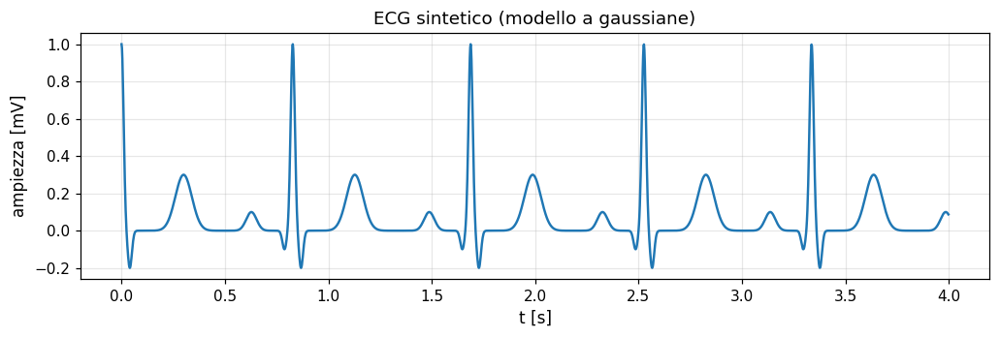

In [14]:
# ECG sintetico: somma di gaussiane di ampiezza e ritardo per P, Q, R, S, T
def synth_ecg(duration=10.0, fs=500.0, hr_bpm=72.0, seed=0):
    # ECG sintetico semplice e ripetibile.
    # duration : durata in secondi
    # fs       : frequenza di campionamento [Hz]
    # hr_bpm   : frequenza cardiaca media [battiti/min]
    rng = np.random.default_rng(seed)
    t = np.arange(0, duration, 1/fs)
    rr = 60.0 / hr_bpm                              # intervallo RR medio [s]
    n_beats = int(np.ceil(duration / rr)) + 2
    # piccole variazioni di RR per simulare HRV
    rr_seq = rr * (1 + 0.05*rng.standard_normal(n_beats))
    beat_times = np.cumsum(rr_seq) - rr_seq[0]

    # Modello onde: (offset rispetto al picco R, ampiezza, larghezza)
    waves = [(-0.20, 0.10, 0.025),   # P
             (-0.04,-0.10, 0.010),   # Q
             ( 0.00, 1.00, 0.010),   # R
             ( 0.04,-0.20, 0.010),   # S
             ( 0.30, 0.30, 0.040)]   # T

    ecg = np.zeros_like(t)
    for tb in beat_times:
        for off, A, w in waves:
            ecg += A*np.exp(-((t-(tb+off))**2)/(2*w**2))
    return t, ecg

t_ecg, ecg = synth_ecg(duration=4.0, fs=500.0, hr_bpm=72)
fig, ax = plt.subplots(figsize=(11, 3))
ax.plot(t_ecg, ecg)
ax.set_title("ECG sintetico (modello a gaussiane)")
ax.set_xlabel("t [s]"); ax.set_ylabel("ampiezza [mV]"); plt.show()


### 1.3.2 EEG sintetico (mix di ritmi + 1/f + artefatti)


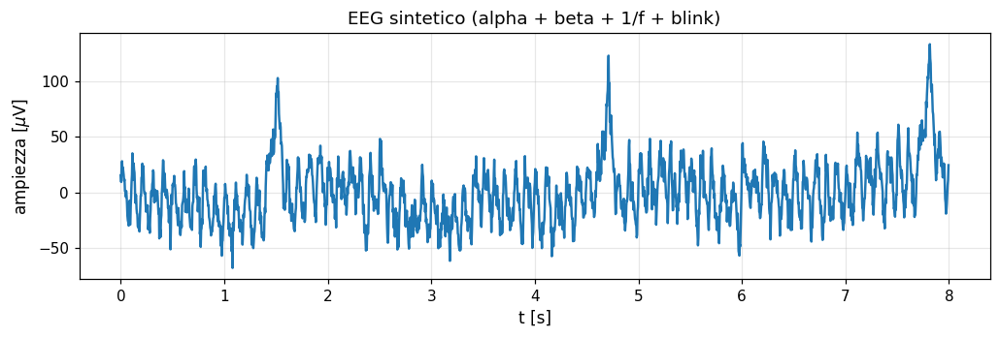

In [15]:
# EEG sintetico: somma di sinusoidi di banda alpha/beta + rumore 1/f + artefatto blink
def synth_eeg(duration=10.0, fs=250.0, seed=1):
    rng = np.random.default_rng(seed)
    t = np.arange(0, duration, 1/fs)
    # Ritmi di base (alpha 10 Hz, beta 20 Hz) con ampiezza variabile
    alpha = 20e-6 * np.sin(2*np.pi*10*t + rng.standard_normal())
    beta  =  8e-6 * np.sin(2*np.pi*20*t + rng.standard_normal())
    # Rumore 1/f: filtraggio di rumore bianco con filtro pink
    white = rng.standard_normal(len(t))
    # filtro che attenua ~3 dB/oct ("pinking" semplice)
    b = [0.049922035, -0.095993537, 0.050612699, -0.004408786]
    a = [1, -2.494956002, 2.017265875, -0.522189400]
    pink = signal.lfilter(b, a, white)
    pink = 15e-6 * pink / np.std(pink)
    # Artefatto da ammiccamento: gaussiana grande di tanto in tanto
    blinks = np.zeros_like(t)
    for tb in [1.5, 4.7, 7.8]:
        blinks += 80e-6 * np.exp(-((t-tb)**2)/(2*0.05**2))
    eeg = alpha + beta + pink + blinks
    return t, eeg

t_eeg, eeg = synth_eeg(duration=8.0, fs=250.0)
fig, ax = plt.subplots(figsize=(11, 3))
ax.plot(t_eeg, eeg*1e6)
ax.set_title("EEG sintetico (alpha + beta + 1/f + blink)")
ax.set_xlabel("t [s]"); ax.set_ylabel(r"ampiezza [$\mu$V]"); plt.show()


### 1.3.3 EMG sintetico (rumore filtrato in banda 20–200 Hz, modulato)


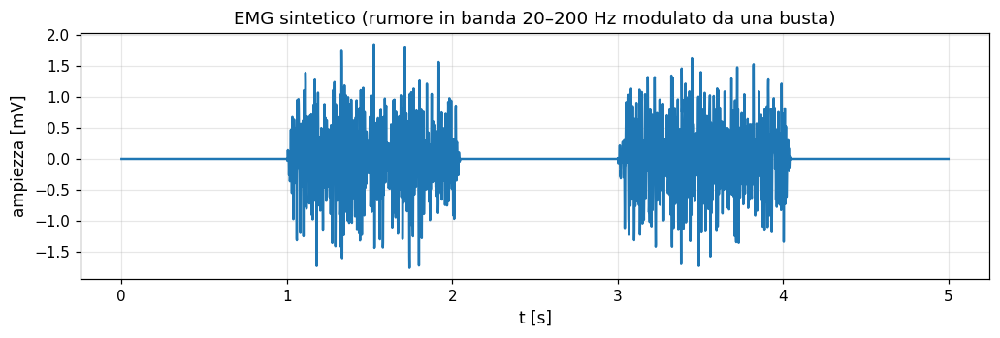

In [16]:
# EMG sintetico: rumore bianco filtrato passabanda 20-200 Hz, modulato da una busta
def synth_emg(duration=5.0, fs=1000.0, seed=2):
    rng = np.random.default_rng(seed)
    t = np.arange(0, duration, 1/fs)
    white = rng.standard_normal(len(t))
    b, a = signal.butter(4, [20, 200], btype="band", fs=fs)
    emg_base = signal.lfilter(b, a, white)
    # Busta di attivazione: due "burst" muscolari di 1 s
    envelope = np.zeros_like(t)
    for t0, dur in [(1.0, 1.0), (3.0, 1.0)]:
        envelope += (t > t0) & (t < t0+dur)
    envelope = signal.lfilter(np.ones(50)/50, 1, envelope)  # leggera lisciatura
    emg = emg_base * envelope
    return t, emg

t_emg, emg = synth_emg()
fig, ax = plt.subplots(figsize=(11, 3))
ax.plot(t_emg, emg)
ax.set_title("EMG sintetico (rumore in banda 20–200 Hz modulato da una busta)")
ax.set_xlabel("t [s]"); ax.set_ylabel("ampiezza [mV]"); plt.show()


### 1.3.4 PPG sintetico (componente cardiaca + respiratoria + rumore)


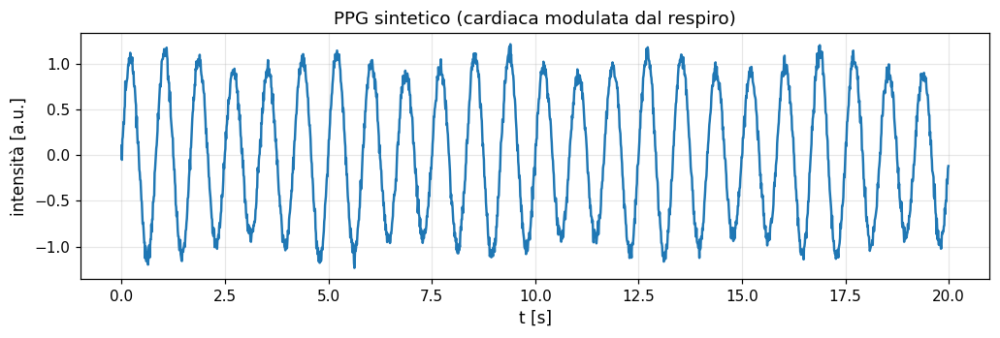

In [17]:
# PPG sintetico: sinusoide a ~1.2 Hz (cardiaca) modulata in ampiezza da respiro a 0.25 Hz
def synth_ppg(duration=20.0, fs=100.0, seed=3):
    rng = np.random.default_rng(seed)
    t = np.arange(0, duration, 1/fs)
    cardiac = 1.0*np.sin(2*np.pi*1.2*t)
    respiratory = 0.3*np.sin(2*np.pi*0.25*t)
    ppg = (1 + 0.4*respiratory)*cardiac + 0.05*rng.standard_normal(len(t))
    return t, ppg

t_ppg, ppg = synth_ppg()
fig, ax = plt.subplots(figsize=(11, 3))
ax.plot(t_ppg, ppg)
ax.set_title("PPG sintetico (cardiaca modulata dal respiro)")
ax.set_xlabel("t [s]"); ax.set_ylabel("intensità [a.u.]"); plt.show()


### 1.3.5 Pressione arteriosa sintetica (oscillazione pulsatile)


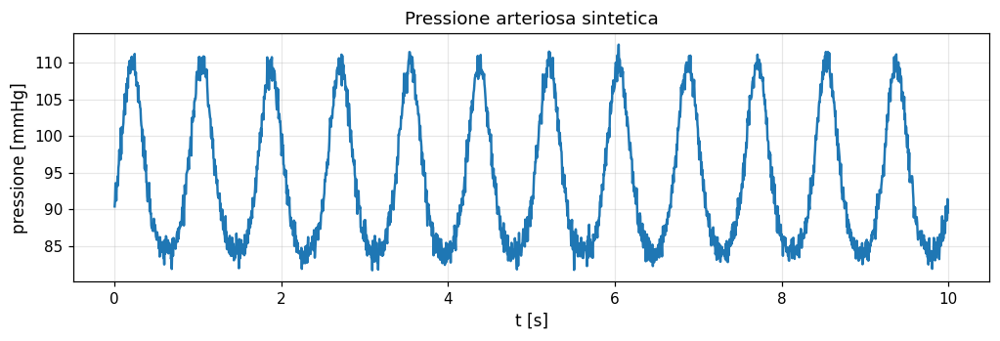

In [18]:
def synth_bp(duration=10.0, fs=200.0, seed=4):
    rng = np.random.default_rng(seed)
    t = np.arange(0, duration, 1/fs)
    f_h = 1.2
    bp = 80 + 30*np.exp(np.sin(2*np.pi*f_h*t)) / np.exp(1)
    bp += 1.0*rng.standard_normal(len(t))
    return t, bp

t_bp, bp = synth_bp()
fig, ax = plt.subplots(figsize=(11, 3))
ax.plot(t_bp, bp)
ax.set_title("Pressione arteriosa sintetica")
ax.set_xlabel("t [s]"); ax.set_ylabel("pressione [mmHg]"); plt.show()


### 1.3.6 Respiro sintetico (volume polmonare ~ 0.25 Hz)


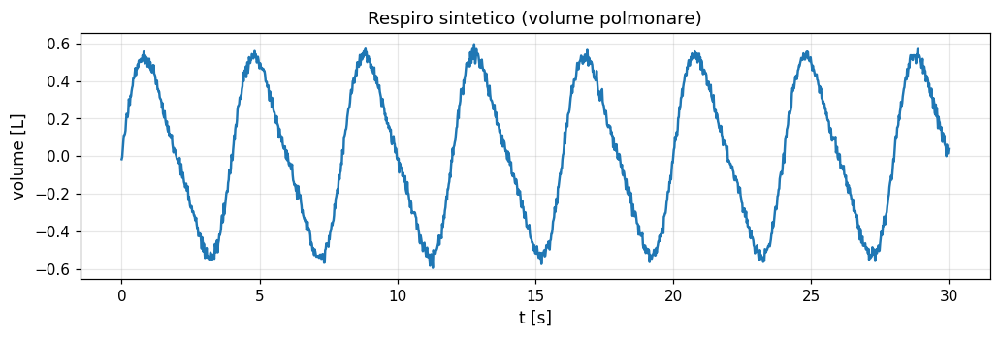

In [19]:
def synth_resp(duration=30.0, fs=50.0, seed=5):
    rng = np.random.default_rng(seed)
    t = np.arange(0, duration, 1/fs)
    resp = 0.5*np.sin(2*np.pi*0.25*t) + 0.1*np.sin(2*np.pi*0.5*t)
    resp += 0.02*rng.standard_normal(len(t))
    return t, resp

t_r, r = synth_resp()
fig, ax = plt.subplots(figsize=(11, 3))
ax.plot(t_r, r)
ax.set_title("Respiro sintetico (volume polmonare)")
ax.set_xlabel("t [s]"); ax.set_ylabel("volume [L]"); plt.show()


### 1.3.7 Spike neuronale sintetico (template + treno di spike)


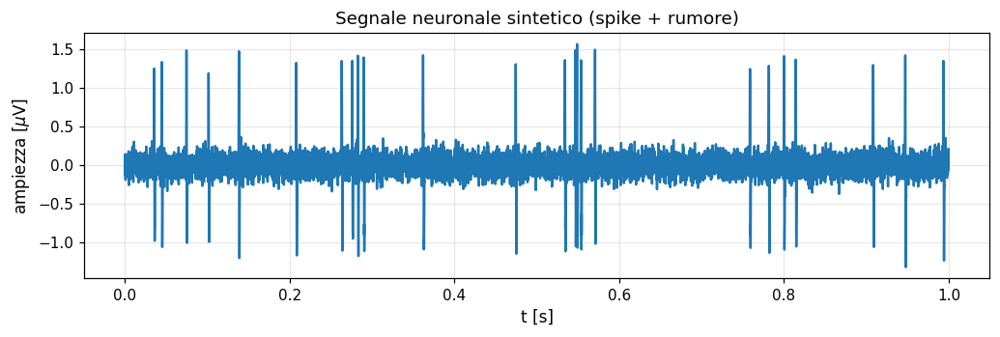

In [20]:
# Spike neuronale: bi-fasico, ~1 ms; treno di spike con jitter
def synth_neural(duration=1.0, fs=10000.0, rate=20.0, seed=6):
    rng = np.random.default_rng(seed)
    t = np.arange(0, duration, 1/fs)
    # template bi-fasico: gaussiana positiva seguita da gaussiana negativa
    def template(tau, fs):
        n = int(0.003 * fs)
        tt = np.arange(n)/fs - 0.001
        return  1.5*np.exp(-((tt-0.0)**2)/(2*(0.0002)**2)) \
              - 1.0*np.exp(-((tt-0.0006)**2)/(2*(0.0003)**2))
    tmpl = template(0, fs)
    spike_times = np.cumsum(rng.exponential(1/rate, size=int(rate*duration*3)))
    spike_times = spike_times[spike_times < duration]
    x = np.zeros_like(t)
    for ts in spike_times:
        idx = int(ts*fs)
        end = min(idx+len(tmpl), len(x))
        x[idx:end] += tmpl[:end-idx]
    x += 0.1*rng.standard_normal(len(t))
    return t, x

t_n, n_sig = synth_neural()
fig, ax = plt.subplots(figsize=(11, 3))
ax.plot(t_n, n_sig)
ax.set_title("Segnale neuronale sintetico (spike + rumore)")
ax.set_xlabel("t [s]"); ax.set_ylabel(r"ampiezza [$\mu$V]"); plt.show()


## 1.4 Tassonomia formale dei segnali

* **Deterministico vs stocastico.** Deterministico = perfettamente riproducibile
  da un modello matematico (es. una sinusoide pura). Stocastico = descritto solo
  in termini di proprietà statistiche (es. rumore EEG di fondo).
* **Stazionario vs non stazionario.** Stazionario in senso lato (WSS): media e
  autocorrelazione costanti nel tempo; non stazionario: cambiano (es. EEG che
  passa da veglia a sonno).
* **Ergodico.** Le statistiche temporali coincidono con quelle di ensemble. Per
  un singolo paziente in stato stabile è spesso un'approssimazione di lavoro.
* **Spontaneo vs indotto.** Spontaneo = osservato in assenza di stimolo (EEG di
  fondo). Indotto = risposta a uno stimolo (ERP).
* **Transitorio.** Eventi localizzati nel tempo (battito ectopico, spike, blink).
* **Quasi periodico.** Ripetizione approssimativa con piccola variabilità (RR
  dell'ECG, respiro).
* **Mono-canale vs multi-canale.** Un solo trasduttore vs molti (multi-lead ECG,
  32-channel EEG, MEA con centinaia di canali). I dati multi-canale si
  rappresentano come **matrici** $X \in \mathbb{R}^{C \times N}$ con $C$ canali
  e $N$ campioni.


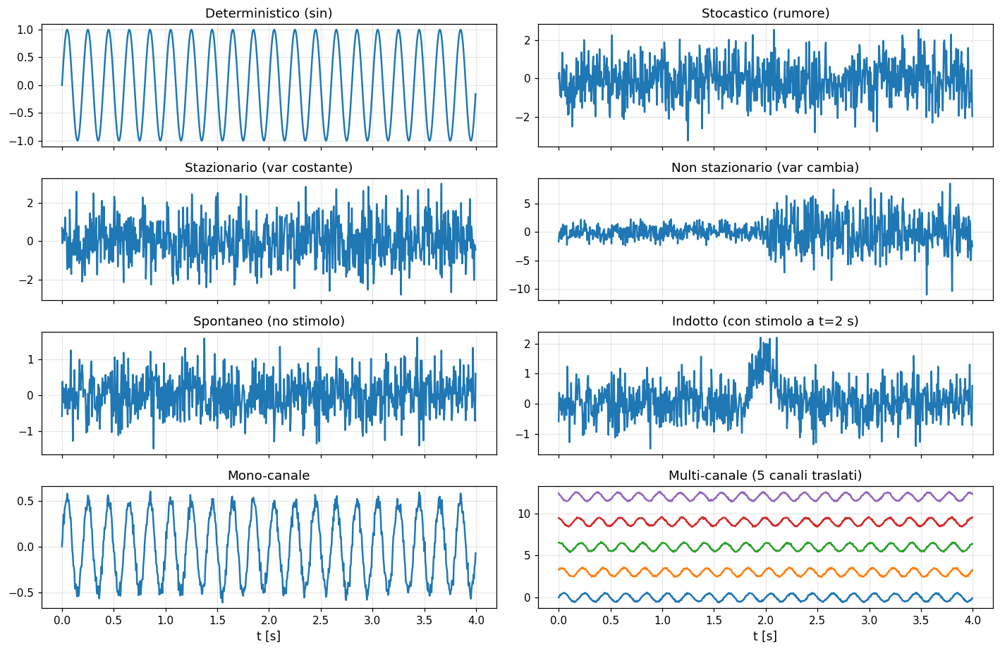

In [21]:
# Confronto visivo: deterministico vs stocastico, stazionario vs non, mono vs multi-canale
fs = 200; t = np.arange(0, 4, 1/fs); rng = np.random.default_rng(7)

# (a) deterministico vs stocastico
det   = np.sin(2*np.pi*5*t)
stoc  = rng.standard_normal(len(t))

# (b) stazionario vs non stazionario
stat  = rng.standard_normal(len(t))
nonstat = np.concatenate([rng.standard_normal(len(t)//2),
                          3*rng.standard_normal(len(t)//2)])
nonstat = nonstat[:len(t)]

# (c) spontaneo vs indotto
spont = 0.5*rng.standard_normal(len(t))
indot = spont.copy() + 1.5*np.exp(-((t-2.0)**2)/(2*0.1**2))

# (d) mono vs multi-canale
multi = np.vstack([0.5*np.sin(2*np.pi*5*t + k*0.6) + 0.05*rng.standard_normal(len(t))
                   for k in range(5)])

fig, axes = plt.subplots(4, 2, figsize=(13, 8.5), sharex=True)
axes[0,0].plot(t, det);    axes[0,0].set_title("Deterministico (sin)")
axes[0,1].plot(t, stoc);   axes[0,1].set_title("Stocastico (rumore)")
axes[1,0].plot(t, stat);   axes[1,0].set_title("Stazionario (var costante)")
axes[1,1].plot(t, nonstat);axes[1,1].set_title("Non stazionario (var cambia)")
axes[2,0].plot(t, spont);  axes[2,0].set_title("Spontaneo (no stimolo)")
axes[2,1].plot(t, indot);  axes[2,1].set_title("Indotto (con stimolo a t=2 s)")
axes[3,0].plot(t, multi[0]);axes[3,0].set_title("Mono-canale")
for i, ch in enumerate(multi):
    axes[3,1].plot(t, ch + 3*i)
axes[3,1].set_title("Multi-canale (5 canali traslati)")
for ax in axes[-1]: ax.set_xlabel("t [s]")
plt.tight_layout(); plt.show()


## 1.5 Matrici e tensori nei segnali biomedici

* Singolo canale: vettore $\mathbf{x}\in\mathbb{R}^N$.
* Multi-canale: matrice $X\in\mathbb{R}^{C\times N}$ (es. EEG 32×1024).
* Multi-trial: tensore $X\in\mathbb{R}^{R\times C\times N}$ ($R$ trial, $C$
  canali, $N$ campioni).
* Multi-soggetto: $X\in\mathbb{R}^{S\times R\times C\times N}$.

Tutte le pipeline DSP che vedremo lavorano direttamente su questi array.

## Must remember — Capitolo 1

1. Ogni segnale biomedico ha **banda tipica**, **rumori tipici** e **analisi tipiche**.
   Sapere queste tre cose per ogni segnale è metà del lavoro.
2. La tassonomia (deterministico/stocastico, stazionario/no, mono/multi) determina
   gli strumenti che applicheremo nei capitoli successivi.
3. Dati multi-canale = matrici; multi-trial e multi-soggetto = tensori.

## Esercizi capitolo 1

1. Modificare `synth_ecg` per aggiungere un battito ectopico ogni 10 RR.
2. Aggiungere a `synth_eeg` un artefatto di rete a 50 Hz e visualizzare il
   risultato.
3. Calcolare la frequenza cardiaca media di `synth_ppg` confrontando lo spettro
   con la frequenza usata nel modello.
4. Costruire un tensore $X\in\mathbb{R}^{5\times 3\times 1000}$ con tre canali
   simulati (ECG, EEG, PPG) e cinque trial. Calcolarne la forma con `.shape`.


# Capitolo 2 — Segnali e sistemi a tempo discreto

In questo capitolo costruiamo il vocabolario fondamentale del DSP: sequenze
elementari, sistemi LTI, convoluzione, equazioni alle differenze, FIR e IIR. Le
dimostrazioni cardine (decomposizione a impulsi, autofunzioni, BIBO, causalità)
sono date in forma completa.


## 2.1 Sequenze elementari

**Impulso discreto (delta di Kronecker)**:
$$
\delta[n] \;=\; \begin{cases} 1 & n=0\\ 0 & n\ne 0\end{cases}.
$$
Attenzione: $\delta[n]$ è un numero finito (1 o 0), non una distribuzione. Non
confonderlo con la delta di Dirac $\delta(t)$ (continuo).

**Gradino discreto (Heaviside)**:
$$
u[n] \;=\; \begin{cases} 1 & n\ge 0\\ 0 & n<0\end{cases}.
$$

**Esponenziale discreto**: $x[n] = A\,\alpha^n$, $\alpha\in\mathbb{C}$.
Per $|\alpha|<1$ tende a zero, per $|\alpha|>1$ diverge, per $|\alpha|=1$ resta
limitato.

**Sinusoide discreta**: $x[n] = A\cos(\omega_0 n + \phi)$. È periodica **solo**
se esiste un intero $N$ tale che $\omega_0 N = 2\pi k$ con $k\in\mathbb{Z}$, cioè
$\omega_0/(2\pi)$ deve essere razionale.

**Energia e potenza.**

* $E_x = \sum_n |x[n]|^2$,
* $P_x = \lim_{N\to\infty}\dfrac{1}{2N+1}\sum_{n=-N}^{N} |x[n]|^2$.

Un segnale di energia ha $E_x < \infty$ e $P_x = 0$; un segnale di potenza
(sinusoide, rumore stazionario) ha $E_x = \infty$ e $P_x$ finito.


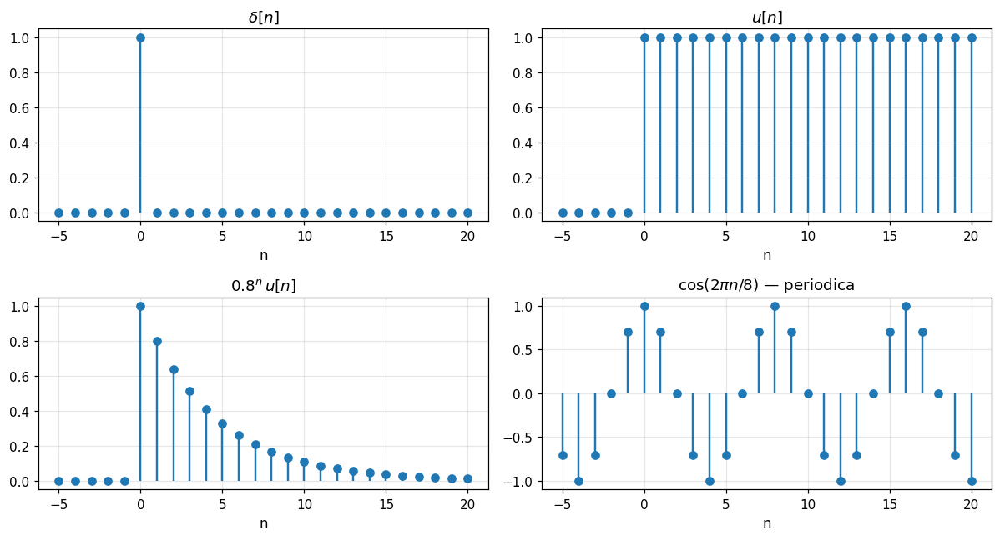

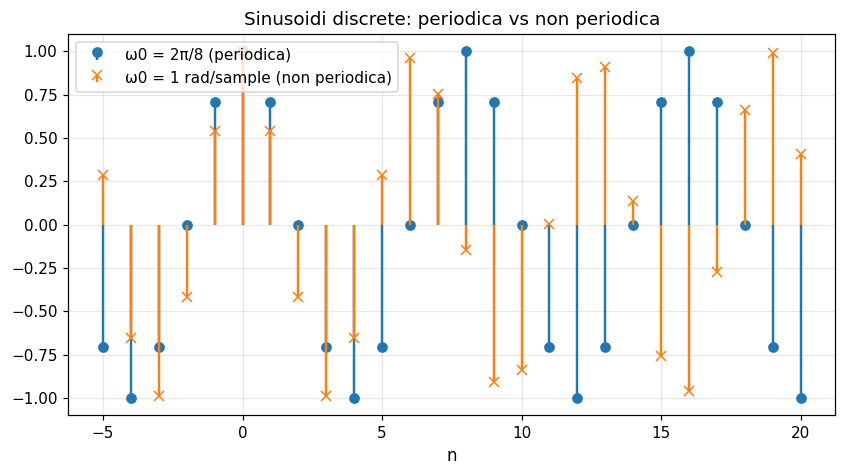

In [22]:
# Visualizziamo impulso, gradino, esponenziale, sinusoidi (periodica e non)
n = np.arange(-5, 21)
delta = (n == 0).astype(float)
u_step = (n >= 0).astype(float)

alpha = 0.8
x_exp = alpha**n.clip(min=0)
x_exp[n < 0] = 0   # parte causale

# Sinusoide periodica: ω0 = 2π/8 => N=8
omega1 = 2*np.pi/8
x_per = np.cos(omega1*n)

# Sinusoide non periodica: ω0 irrazionale (es. ω0 = 1 rad/sample)
omega2 = 1.0
x_aperiodic = np.cos(omega2*n)

fig, axes = plt.subplots(2, 2, figsize=(11, 6))
for ax, x, title in zip(axes.ravel(),
                        [delta, u_step, x_exp, x_per],
                        [r"$\delta[n]$", r"$u[n]$",
                         r"$0.8^n\,u[n]$", r"$\cos(2\pi n/8)$ — periodica"]):
    ax.stem(n, x, basefmt=" ")
    ax.set_title(title); ax.set_xlabel("n")
fig.tight_layout(); plt.show()

# Periodica vs non periodica: stesso plot con due segnali a confronto
fig, ax = plt.subplots()
ax.stem(n, x_per, linefmt="C0-", markerfmt="C0o", basefmt=" ", label="ω0 = 2π/8 (periodica)")
ax.stem(n, x_aperiodic, linefmt="C1-", markerfmt="C1x", basefmt=" ", label="ω0 = 1 rad/sample (non periodica)")
ax.legend(); ax.set_title("Sinusoidi discrete: periodica vs non periodica")
ax.set_xlabel("n"); plt.show()


## 2.2 Sistemi a tempo discreto

Un **sistema** è una mappa $T: x[n] \mapsto y[n]$. Le quattro proprietà chiave:

* **Linearità**: $T(\alpha x_1 + \beta x_2) = \alpha\,T(x_1) + \beta\,T(x_2)$.
* **Tempo-invarianza**: se $y[n]=T\{x[n]\}$, allora $y[n-n_0] = T\{x[n-n_0]\}$.
* **Causalità**: $y[n]$ dipende solo da $x[k]$ per $k\le n$.
* **Stabilità BIBO**: se $|x[n]|\le M_x$ per ogni $n$, allora $|y[n]|\le M_y$.

Un sistema lineare e tempo-invariante si chiama **LTI**. È **completamente
determinato** dalla sua *risposta all'impulso* $h[n] = T\{\delta[n]\}$.


## 2.3 Decomposizione a impulsi e convoluzione (dimostrazione)

**Dimostrazione (decomposizione a impulsi).** Per ogni sequenza vale
$$
x[n] \;=\; \sum_{k=-\infty}^{+\infty} x[k]\,\delta[n-k].
$$
*Prova:* fissato $n$, $\delta[n-k]$ vale 1 solo per $k=n$ e 0 altrove; quindi la
somma collassa al singolo termine $x[n]\cdot 1 = x[n]$. $\square$

**Dimostrazione (risposta come convoluzione).** Sia $T$ LTI con risposta
all'impulso $h[n]=T\{\delta[n]\}$. Allora, applicando linearità e tempo-invarianza
alla decomposizione a impulsi:
$$
y[n] \;=\; T\!\left\{\sum_k x[k]\,\delta[n-k]\right\}
\;=\; \sum_k x[k]\,T\{\delta[n-k]\}
\;=\; \sum_k x[k]\,h[n-k].
$$
Cioè $y[n] = (x*h)[n] = \sum_k x[k]\,h[n-k]$. $\square$

**Significato.** La risposta di un sistema LTI a un ingresso arbitrario si
ottiene combinando linearmente repliche traslate della risposta all'impulso.

**Proprietà della convoluzione.** Commutativa, associativa, distributiva sulla
somma:
$x*h = h*x;\ (x*h)*g = x*(h*g);\ (x_1+x_2)*h = x_1*h + x_2*h$.


## 2.4 Convoluzione: tre implementazioni

### 2.4.1 Versione esplicita (doppio ciclo `for`)

Calcoliamo $y[n] = \sum_k x[k]\,h[n-k]$ campionando il risultato e azzerando
fuori dal supporto.


In [23]:
# Convoluzione manuale con doppio ciclo: ottima per capire, lenta in pratica
def conv_explicit(x, h):
    Nx = len(x); Nh = len(h)
    Ny = Nx + Nh - 1            # lunghezza risultato della convoluzione lineare
    y  = np.zeros(Ny)
    for n in range(Ny):         # ciclo sui campioni di uscita
        s = 0.0
        for k in range(Nx):     # ciclo sull'ingresso
            j = n - k           # indice dentro h
            if 0 <= j < Nh:
                s += x[k] * h[j]
        y[n] = s
    return y

x = np.array([1, 2, 3, 4], dtype=float)
h = np.array([1, 0, -1], dtype=float)
y = conv_explicit(x, h)
print("x  =", x)
print("h  =", h)
print("y  =", y)
print("controllo NumPy: np.convolve(x,h) =", np.convolve(x, h))


x  = [1. 2. 3. 4.]
h  = [ 1.  0. -1.]
y  = [ 1.  2.  2.  2. -3. -4.]
controllo NumPy: np.convolve(x,h) = [ 1.  2.  2.  2. -3. -4.]


### 2.4.2 Versione "matrice Toeplitz" (algebra lineare esplicita)

La convoluzione si può scrivere come $\mathbf{y} = H_T\,\mathbf{x}$, dove
$H_T$ è una matrice di Toeplitz costruita con $h$:

$$
H_T \;=\;
\begin{pmatrix}
h[0] & 0 & 0 & 0 \\
h[1] & h[0] & 0 & 0 \\
h[2] & h[1] & h[0] & 0 \\
0    & h[2] & h[1] & h[0]\\
0    & 0    & h[2] & h[1] \\
0    & 0    & 0    & h[2]
\end{pmatrix}, \qquad
\mathbf{x} = \begin{pmatrix} x[0]\\ x[1] \\ x[2] \\ x[3]\end{pmatrix}.
$$

Verifichiamolo numericamente: $H_T \mathbf{x}$ deve dare gli stessi valori di
`conv_explicit(x, h)`.


In [24]:
# Costruzione esplicita della matrice di Toeplitz e moltiplicazione
def toeplitz_conv_matrix(h, Nx):
    Nh = len(h); Ny = Nx + Nh - 1
    H = np.zeros((Ny, Nx))
    for i in range(Ny):
        for j in range(Nx):
            k = i - j
            if 0 <= k < Nh:
                H[i, j] = h[k]
    return H

H = toeplitz_conv_matrix(h, Nx=4)
print("Matrice di Toeplitz H_T:\n", H)
print("\nH_T x =", H @ x)


Matrice di Toeplitz H_T:
 [[ 1.  0.  0.  0.]
 [ 0.  1.  0.  0.]
 [-1.  0.  1.  0.]
 [ 0. -1.  0.  1.]
 [ 0.  0. -1.  0.]
 [ 0.  0.  0. -1.]]

H_T x = [ 1.  2.  2.  2. -3. -4.]


### 2.4.3 Versione ottimizzata (`np.convolve` / `scipy.signal.fftconvolve`)


In [25]:
# Confronto: NumPy diretto vs SciPy via FFT
y_np    = np.convolve(x, h)
y_scipy = signal.fftconvolve(x, h)
print("NumPy convolve :", y_np)
print("SciPy fftconv  :", y_scipy)

# Confronto tempi su segnali più grandi
xb = np.random.randn(2000)
hb = np.random.randn(150)
import time
t0=time.perf_counter(); _ = conv_explicit(xb, hb);                  t1=time.perf_counter()
t2=time.perf_counter(); _ = np.convolve(xb, hb);                    t3=time.perf_counter()
t4=time.perf_counter(); _ = signal.fftconvolve(xb, hb);             t5=time.perf_counter()
print(f"esplicita    : {t1-t0:.3f} s")
print(f"np.convolve  : {t3-t2:.4f} s")
print(f"fftconvolve  : {t5-t4:.4f} s")


NumPy convolve : [ 1.  2.  2.  2. -3. -4.]
SciPy fftconv  : [ 1.  2.  2.  2. -3. -4.]
esplicita    : 0.128 s
np.convolve  : 0.0001 s
fftconvolve  : 0.0003 s


### 2.4.4 Convoluzione "passo-passo" visualizzata


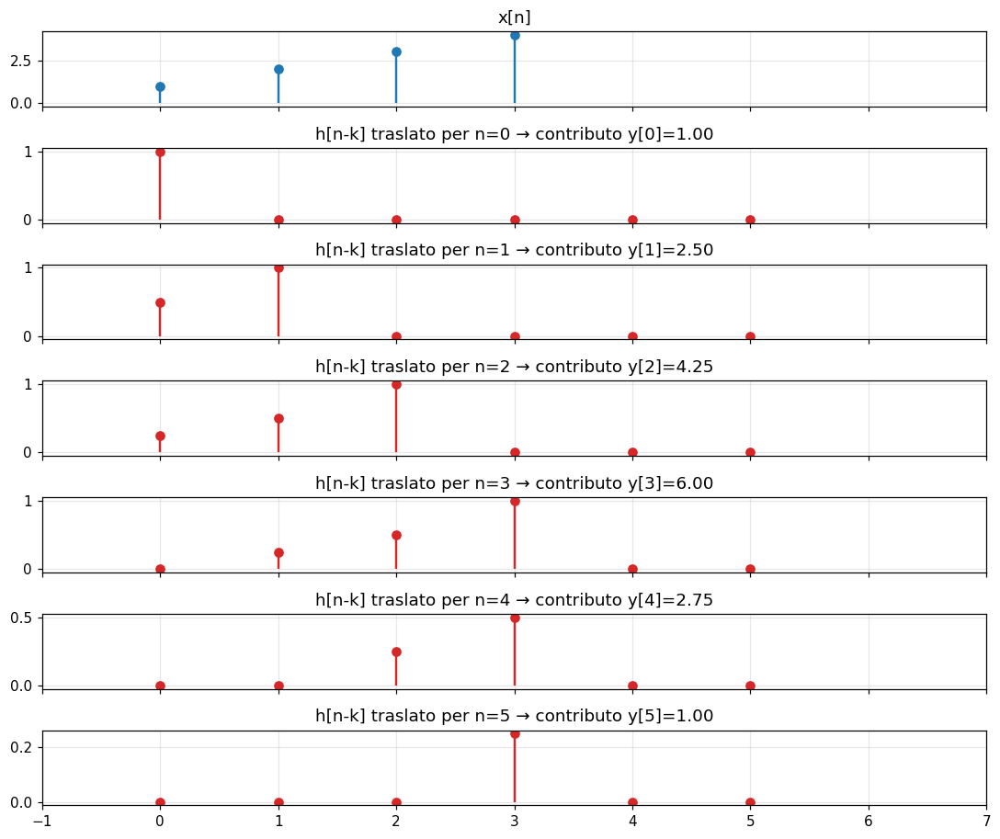

y = [1.   2.5  4.25 6.   2.75 1.  ]


In [26]:
# Diagramma didattico: traslazione e somma a ogni passo
x = np.array([1, 2, 3, 4], dtype=float)
h = np.array([1, 0.5, 0.25], dtype=float)
Nx, Nh = len(x), len(h)
Ny = Nx + Nh - 1

fig, axes = plt.subplots(Ny+1, 1, figsize=(10, 1.2*(Ny+1)), sharex=True)
axes[0].stem(np.arange(Nx), x, basefmt=" ", linefmt="C0-", markerfmt="C0o", label="x")
axes[0].set_title("x[n]"); axes[0].set_xlim(-1, Ny+1)

y = np.zeros(Ny)
for n in range(Ny):
    h_shift = np.zeros(Ny)
    for j in range(Nh):
        if 0 <= n-j < Nx:
            h_shift[n-j] += h[j]  # questa visualizzazione disegna h "flippata" e traslata
    s = float(np.sum(x[:Nx] * h_shift[:Nx]))
    y[n] = s
    axes[n+1].stem(np.arange(Ny), h_shift, basefmt=" ", linefmt="C3-", markerfmt="C3o")
    axes[n+1].set_title(f"h[n-k] traslato per n={n} → contributo y[{n}]={s:.2f}")
plt.tight_layout(); plt.show()
print("y =", y)


## 2.5 Stabilità BIBO e causalità per LTI (dimostrazioni)

**Teorema (BIBO).** Un sistema LTI è stabile BIBO se e solo se
$\sum_{n=-\infty}^{+\infty} |h[n]| < \infty$.

*Prova (⇐).* Supponiamo $\sum|h[n]| = S < \infty$ e $|x[n]|\le M_x$ per ogni $n$.
Allora
$$
|y[n]| \;=\; \Bigl|\sum_k x[k]\,h[n-k]\Bigr|
\;\le\; \sum_k |x[k]|\,|h[n-k]|
\;\le\; M_x \sum_k |h[n-k]|
\;=\; M_x\,S.
$$
Quindi $|y[n]|$ è limitato. ✓

*Prova (⇒).* Per contrapposizione: se $\sum_n |h[n]| = \infty$, scegliamo
$x[k] = \operatorname{sgn}(h[-k])$. Allora $|x[k]|\le 1$ ma
$y[0] = \sum_k x[k]\,h[-k] = \sum_k |h[-k]| = \infty$. ✓
$\square$

**Teorema (causalità).** Un sistema LTI è causale se e solo se $h[n]=0$ per $n<0$.

*Prova.* (⇐) ovvio dalla convoluzione. (⇒) Se $h[n_0]\ne 0$ per qualche $n_0<0$,
applichiamo $\delta[n]$ in ingresso: l'uscita $h[n_0]\ne 0$ a $n=n_0<0$
dipende da $x[0]\ne 0$, cioè da un istante futuro. Non causale. ✓
$\square$


## 2.6 Esponenziali complessi come autofunzioni degli LTI (dim.)

**Teorema.** Per un sistema LTI con risposta $h[n]$, l'ingresso $x[n] = e^{j\omega n}$
produce
$$
y[n] \;=\; H(e^{j\omega})\,e^{j\omega n},\qquad
H(e^{j\omega}) \;=\; \sum_{k=-\infty}^{+\infty} h[k]\,e^{-j\omega k}.
$$
Cioè $e^{j\omega n}$ è un'**autofunzione** del sistema e $H(e^{j\omega})$ è
l'autovalore associato — è esattamente la **risposta in frequenza**.

*Prova.* Per la convoluzione:
$$
y[n] = \sum_k h[k]\,e^{j\omega(n-k)} = e^{j\omega n}\sum_k h[k]\,e^{-j\omega k}
     = e^{j\omega n}\,H(e^{j\omega}). \quad\square
$$

**Conseguenza centrale.** Applicare un sistema LTI a una sinusoide la lascia
sinusoide della **stessa** frequenza, cambiando solo ampiezza e fase secondo
$H(e^{j\omega})$. Questo giustifica perché analizziamo i sistemi LTI nel dominio
delle frequenze.


In [27]:
# Verifica numerica: ingresso e^{jω n} → uscita H(e^{jω}) e^{jω n}
omega0 = 2*np.pi*0.1   # frequenza arbitraria in rad/sample
h = np.array([0.2, 0.5, 0.2])   # filtro lisciante
N = 64; n = np.arange(N)
x = np.exp(1j*omega0*n)
y = np.convolve(x, h)[:N]

H = np.sum(h * np.exp(-1j*omega0*np.arange(len(h))))    # autovalore previsto
y_pred = H * np.exp(1j*omega0*n)
print("|y - H e^{jωn}| max =", np.max(np.abs(y - y_pred)))
print("H(e^{jω0}) =", H, "  |H|=", abs(H), "  arg(H)=", np.angle(H))


|y - H e^{jωn}| max = 0.6721632233877345
H(e^{jω0}) = (0.6663118960624632-0.48410392940526725j)   |H|= 0.8236067977499789   arg(H)= -0.6283185307179586


## 2.7 Equazioni alle differenze, FIR e IIR

**Equazione alle differenze (forma generale)**:
$$
\sum_{k=0}^{P} a_k\,y[n-k] \;=\; \sum_{m=0}^{Q} b_m\,x[n-m].
$$
Per convenzione $a_0 = 1$.

* **FIR (Finite Impulse Response)**: $a_k = 0$ per $k\ge 1$. Cioè
  $y[n] = \sum_m b_m\,x[n-m]$. La risposta all'impulso ha durata finita
  ($Q+1$ campioni), uguale ai coefficienti $b_m$.
* **IIR (Infinite Impulse Response)**: almeno un $a_k\ne 0$ con $k\ge 1$.
  Risposta all'impulso (potenzialmente) infinita. Più efficiente, ma può essere
  instabile.

**Esempio IIR**: $y[n] = x[n] + 0.8\,y[n-1]$ ha $h[n] = 0.8^n u[n]$.

**Esempio FIR**: $y[n] = (x[n] + x[n-1] + x[n-2])/3$ ha
$h = [1/3, 1/3, 1/3]$.


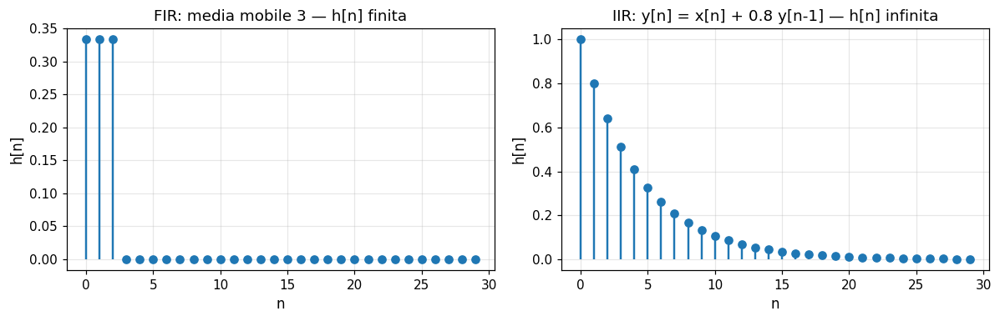

In [28]:
# IIR vs FIR: risposta all'impulso
N = 30; n = np.arange(N)
impulse = (n == 0).astype(float)

# IIR: a = [1, -0.8]; b = [1]
h_iir = signal.lfilter([1], [1, -0.8], impulse)
# FIR: moving average di lunghezza 3
h_fir = signal.lfilter([1/3, 1/3, 1/3], [1], impulse)

fig, axes = plt.subplots(1, 2, figsize=(11, 3.6))
axes[0].stem(n, h_fir, basefmt=" "); axes[0].set_title("FIR: media mobile 3 — h[n] finita")
axes[1].stem(n, h_iir, basefmt=" "); axes[1].set_title("IIR: y[n] = x[n] + 0.8 y[n-1] — h[n] infinita")
for ax in axes: ax.set_xlabel("n"); ax.set_ylabel("h[n]")
plt.tight_layout(); plt.show()


## Must remember — Capitolo 2

1. **Decomposizione a impulsi**: ogni sequenza è una somma di impulsi pesati.
2. **Convoluzione**: uscita di un LTI = ingresso convoluto con $h$.
3. **Stabilità BIBO**: $\sum|h[n]|<\infty$.
4. **Causalità**: $h[n]=0$ per $n<0$.
5. **Esponenziali complessi = autofunzioni** degli LTI; gli autovalori sono la
   risposta in frequenza $H(e^{j\omega})$.
6. **FIR vs IIR**: il primo ha $h$ finita e fase lineare facile; il secondo è
   più efficiente ma può essere instabile.

## Esercizi capitolo 2

1. Calcolare a mano $y[n] = (x*h)[n]$ con $x=[1,2,3]$ e $h=[1,-1]$.
2. Costruire la matrice di Toeplitz di $h=[1,2,1]$ per $N_x=5$ e verificare con
   `np.convolve`.
3. Dimostrare che $u[n]*\delta[n-3] = u[n-3]$ usando la decomposizione a
   impulsi.
4. Mostrare che il filtro $y[n]=2 y[n-1]+x[n]$ è instabile esaminando $h[n]$.
5. Calcolare la risposta in frequenza del sistema $y[n]= x[n]-x[n-1]$ valutando
   $H(e^{j\omega}) = 1 - e^{-j\omega}$ e disegnarne il modulo.


# Capitolo 3 — Conversione analogico-digitale

In questo capitolo passiamo dal mondo continuo a quello discreto. Trattiamo il
campionamento (Shannon/Nyquist), l'aliasing, la quantizzazione, lo zero-order
hold e la ricostruzione ideale via sinc.


## 3.1 Definizioni

**Campionamento ideale.** Da $x(t)$ otteniamo $x[n] = x(nT_s)$.

* $T_s$: **periodo di campionamento** (s).
* $F_s = 1/T_s$: **frequenza di campionamento** (Hz).
* $\omega = 2\pi f/F_s$: frequenza discreta normalizzata (rad/sample).

**Quantizzazione.** Ogni campione viene rappresentato in un numero finito di
bit $B$. Se il range dinamico è $\pm A$, la **quantizzazione uniforme** ha passo
$\Delta = 2A/2^B$. L'errore di quantizzazione $e[n] = \hat x[n] - x[n]$ è
modellato come rumore additivo uniforme in $[-\Delta/2,\Delta/2]$, con varianza
$\sigma_e^2 = \Delta^2/12$.

**Rapporto segnale/rumore di quantizzazione (SQNR).** Per un segnale a piena
scala:
$$
\mathrm{SQNR}\,\approx\, 6.02\,B + 1.76\ \text{dB}.
$$
Ogni bit in più aggiunge circa 6 dB.


## 3.2 Teorema del campionamento (Shannon)

**Enunciato.** Sia $x(t)$ un segnale a banda limitata, $X(j\Omega) = 0$ per
$|\Omega| > \Omega_M$. Se $\Omega_s = 2\pi F_s > 2\,\Omega_M$, allora $x(t)$ è
ricostruibile esattamente da $\{x(nT_s)\}_{n\in\mathbb{Z}}$ tramite
$$
x(t) \;=\; \sum_{n=-\infty}^{+\infty} x[n]\,\mathrm{sinc}\!\left(\frac{t-nT_s}{T_s}\right).
$$

**Idea della dimostrazione (in frequenza).** Il campionamento equivale a
moltiplicare $x(t)$ per un treno di impulsi $\Delta_T(t) = \sum_k \delta(t-kT_s)$.
Trasformando, il prodotto in tempo diventa convoluzione in frequenza con un treno
di impulsi spaziati di $\Omega_s$. Il risultato è
$$
X_s(j\Omega) \;=\; \frac{1}{T_s}\sum_{k=-\infty}^{+\infty} X\!\big(j(\Omega - k\Omega_s)\big),
$$
cioè lo spettro originale **replicato** con passo $\Omega_s$. Se $\Omega_s > 2\Omega_M$
le repliche non si sovrappongono: un filtro passabasso ideale a frequenza di
taglio $\Omega_M$ recupera $X(j\Omega)$ esattamente. La sinc è la risposta
all'impulso (continua) di tale filtro ideale. $\square$

**Aliasing.** Se $\Omega_s \le 2\Omega_M$ le repliche si sovrappongono: lo
spettro originale viene corrotto e non è più recuperabile. Le componenti di alta
frequenza appaiono "ripiegate" (alias) in basse frequenze.


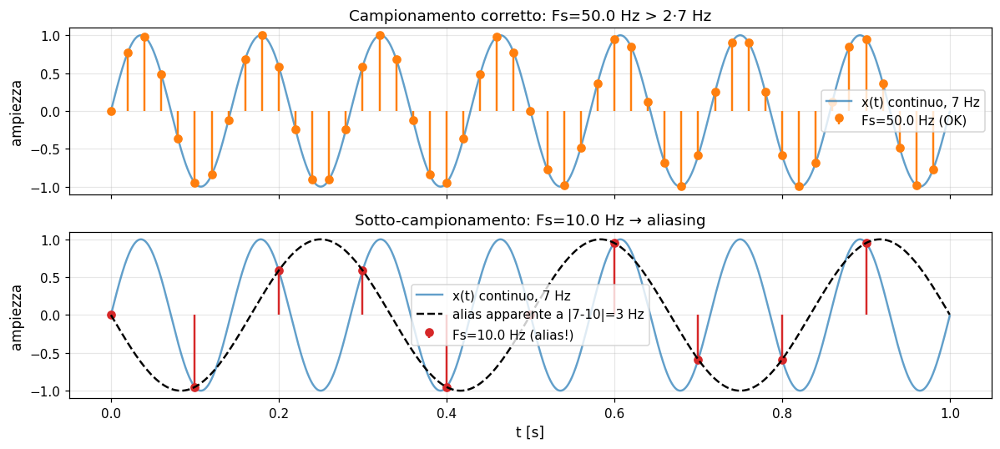

In [29]:
# Sinusoide a 7 Hz: campionata correttamente (Fs=50 Hz) vs sotto-campionata (Fs=10 Hz)
f0 = 7.0
T = 1.0
t_cont = np.linspace(0, T, 4000, endpoint=False)
x_cont = np.sin(2*np.pi*f0*t_cont)

Fs_ok, Fs_bad = 50.0, 10.0
n_ok = np.arange(int(T*Fs_ok)); t_ok = n_ok/Fs_ok; x_ok = np.sin(2*np.pi*f0*t_ok)
n_bd = np.arange(int(T*Fs_bad)); t_bd = n_bd/Fs_bad; x_bd = np.sin(2*np.pi*f0*t_bd)

fig, axes = plt.subplots(2, 1, figsize=(11, 5), sharex=True)
axes[0].plot(t_cont, x_cont, alpha=0.7, label="x(t) continuo, 7 Hz")
axes[0].stem(t_ok, x_ok, linefmt="C1-", markerfmt="C1o", basefmt=" ", label=f"Fs={Fs_ok} Hz (OK)")
axes[0].set_title(f"Campionamento corretto: Fs={Fs_ok} Hz > 2·7 Hz")
axes[0].legend(); axes[0].set_ylabel("ampiezza")
axes[1].plot(t_cont, x_cont, alpha=0.7, label="x(t) continuo, 7 Hz")
axes[1].stem(t_bd, x_bd, linefmt="C3-", markerfmt="C3o", basefmt=" ", label=f"Fs={Fs_bad} Hz (alias!)")
# Ricostruzione apparente: una sinusoide di frequenza |f0 - Fs| = 3 Hz
axes[1].plot(t_cont, np.sin(2*np.pi*(f0 - Fs_bad)*t_cont), "k--",
             label=f"alias apparente a |{f0:.0f}-{Fs_bad:.0f}|={abs(f0-Fs_bad):.0f} Hz")
axes[1].set_title(f"Sotto-campionamento: Fs={Fs_bad} Hz → aliasing")
axes[1].legend(); axes[1].set_xlabel("t [s]"); axes[1].set_ylabel("ampiezza")
plt.tight_layout(); plt.show()


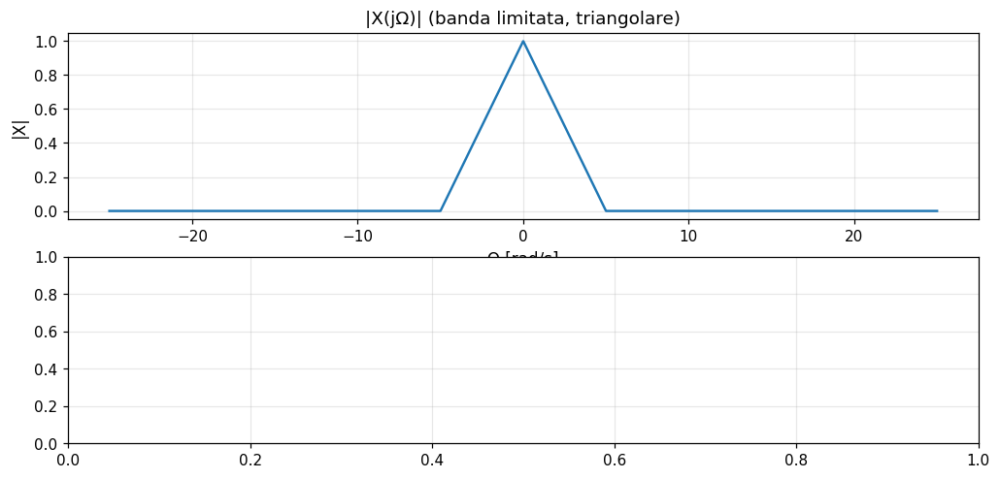

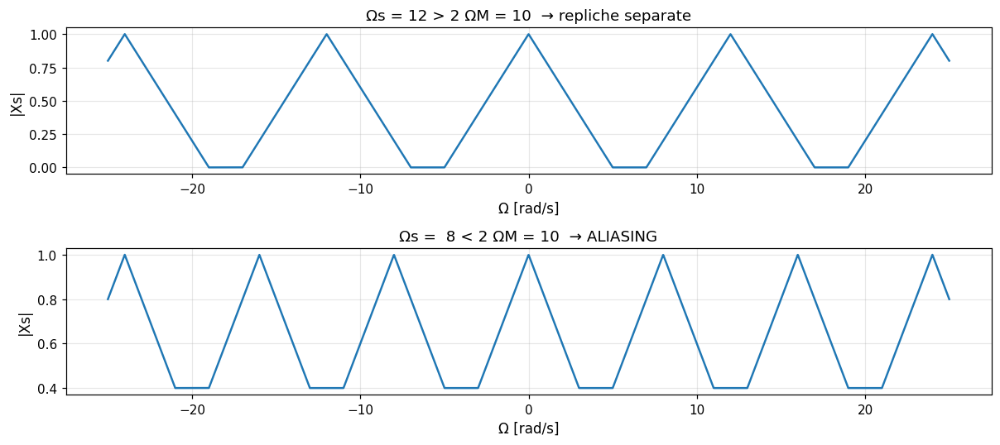

In [30]:
# Spettro replicato dopo campionamento: visualizzazione schematica
fig, axes = plt.subplots(2, 1, figsize=(11, 5))
Omega_M = 5
omega = np.linspace(-25, 25, 4000)
def triangle(omega, M):
    return np.maximum(0, 1 - np.abs(omega)/M)
axes[0].plot(omega, triangle(omega, Omega_M))
axes[0].set_title("|X(jΩ)| (banda limitata, triangolare)")
axes[0].set_xlabel("Ω [rad/s]"); axes[0].set_ylabel("|X|")

# replica con Omega_s = 12 (OK) e Omega_s = 8 (aliasing)
for ax, Os, title in [(axes[1], 12, "Ω_s = 12 > 2·5: repliche separate"),
                      (None, None, None)]:
    pass

fig, axes = plt.subplots(2, 1, figsize=(11, 5))
for ax, Os, title in [(axes[0], 12, "Ωs = 12 > 2 ΩM = 10  → repliche separate"),
                      (axes[1], 8,  "Ωs =  8 < 2 ΩM = 10  → ALIASING")]:
    rep = np.zeros_like(omega)
    for k in range(-3, 4):
        rep = rep + triangle(omega - k*Os, Omega_M)
    ax.plot(omega, rep)
    ax.set_title(title); ax.set_xlabel("Ω [rad/s]"); ax.set_ylabel("|Xs|")
plt.tight_layout(); plt.show()


## 3.3 Quantizzazione e rumore di quantizzazione

Modello uniforme con passo $\Delta = 2A/2^B$. Errore $e[n] \sim \mathcal{U}(-\Delta/2,\Delta/2)$,
varianza $\Delta^2/12$. SQNR cresce di 6 dB ogni bit aggiuntivo.


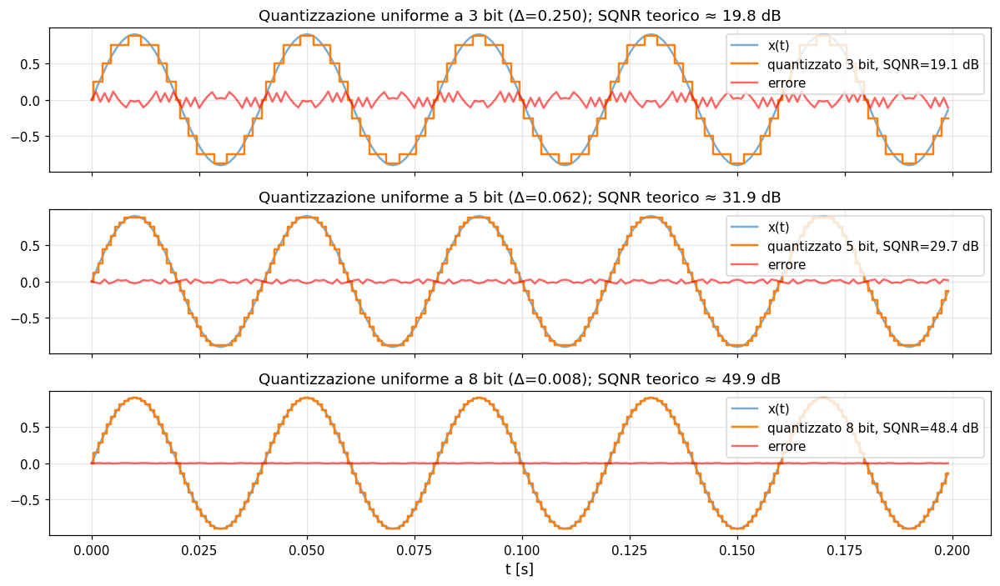

In [31]:
# Quantizzazione di una sinusoide a B bit. Confronto con SQNR teorico.
def quantize(x, B, A=None):
    if A is None: A = np.max(np.abs(x))
    L = 2**B
    Delta = 2*A/L
    q = np.round(x/Delta)*Delta
    q = np.clip(q, -A + Delta/2, A - Delta/2)
    return q, Delta

fs = 1000; t = np.arange(0, 0.2, 1/fs)
x = 0.9*np.sin(2*np.pi*25*t)

fig, axes = plt.subplots(3, 1, figsize=(11, 6.5), sharex=True)
for ax, B in zip(axes, [3, 5, 8]):
    q, Delta = quantize(x, B, A=1.0)
    err = q - x
    P_signal = np.mean(x**2); P_noise = np.mean(err**2)
    sqnr = 10*np.log10(P_signal/P_noise)
    ax.plot(t, x, alpha=0.6, label="x(t)")
    ax.step(t, q, where="mid", label=f"quantizzato {B} bit, SQNR={sqnr:.1f} dB")
    ax.plot(t, err, "r", alpha=0.6, label="errore")
    ax.legend(loc="upper right")
    ax.set_title(f"Quantizzazione uniforme a {B} bit (Δ={Delta:.3f}); SQNR teorico ≈ {6.02*B+1.76:.1f} dB")
axes[-1].set_xlabel("t [s]")
plt.tight_layout(); plt.show()


## 3.4 Anti-aliasing, oversampling, zero-order hold

* **Filtro anti-aliasing.** Prima dell'ADC, un filtro analogico passabasso
  limita la banda del segnale a $F_s/2$ in modo da evitare aliasing.
* **Oversampling.** Campionare a $F_s \gg 2 F_M$ rilassa la pendenza richiesta
  dal filtro anti-aliasing e riduce il rumore di quantizzazione in banda utile
  (dopo decimazione).
* **Zero-order hold (DAC).** In uscita, un convertitore digitale-analogico
  spesso "tiene" il valore campionato per $T_s$ secondi: nel dominio della
  frequenza ciò introduce una pesatura $|\mathrm{sinc}(f T_s)|$ che può essere
  compensata con un filtro di "equalizzazione sinc".

## 3.5 Ricostruzione ideale via sinc


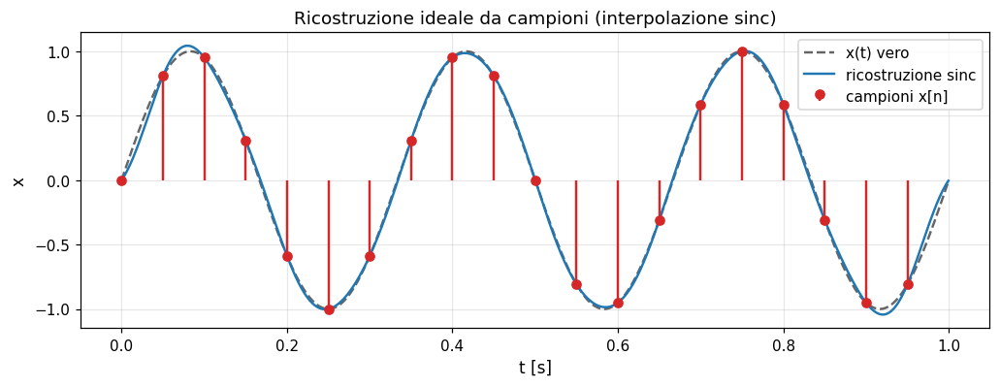

In [32]:
# Ricostruzione di un sinusoide campionato tramite formula della sinc
Fs = 20.0; Ts = 1/Fs; T = 1.0
n  = np.arange(int(T*Fs)); t_n = n*Ts
f0 = 3.0
x_n = np.sin(2*np.pi*f0*t_n)

# Griglia fine per "ricostruzione continua"
t = np.linspace(0, T, 2000, endpoint=False)
def sinc_interp(t, t_n, x_n, Ts):
    # x(t) = Σ x[n] sinc((t-n Ts)/Ts)
    x = np.zeros_like(t)
    for k in range(len(t_n)):
        x = x + x_n[k]*np.sinc((t - t_n[k])/Ts)
    return x

x_rec = sinc_interp(t, t_n, x_n, Ts)
x_true = np.sin(2*np.pi*f0*t)

fig, ax = plt.subplots(figsize=(11, 3.6))
ax.plot(t, x_true, "k--", alpha=0.6, label="x(t) vero")
ax.plot(t, x_rec, "C0", label="ricostruzione sinc")
ax.stem(t_n, x_n, linefmt="C3-", markerfmt="C3o", basefmt=" ", label="campioni x[n]")
ax.set_title("Ricostruzione ideale da campioni (interpolazione sinc)")
ax.set_xlabel("t [s]"); ax.set_ylabel("x"); ax.legend(); plt.show()


## Must remember — Capitolo 3

1. Campionare a $F_s > 2\,F_{\max}$ è la condizione di Shannon/Nyquist.
2. Sotto-campionare = aliasing inevitabile.
3. Quantizzare a $B$ bit ⇒ rumore $\sim \Delta^2/12$, SQNR ≈ $6\,B + 1.76$ dB.
4. Per ricostruire un segnale continuo da campioni, l'interpolatore ideale è la
   sinc.

## Esercizi capitolo 3

1. Una sinusoide a $f_0 = 40$ Hz campionata a $F_s = 30$ Hz a quale frequenza
   apparente compare? Verificarlo in Python.
2. Mostrare che un convertitore a 10 bit fra $\pm 1$ V ha $\Delta\approx 1.95$ mV.
3. Generare un segnale a banda piatta in $[0, 60]$ Hz e campionarlo a $F_s=100$
   Hz. Disegnare lo spettro del campionato e identificare l'aliasing.
4. Implementare un filtro anti-aliasing analogico equivalente (passabasso
   Butterworth di ordine 6 con cut-off $40$ Hz) prima di campionare un segnale a
   $F_s = 100$ Hz e verificare la riduzione dell'aliasing.


# Capitolo 4 — Fourier, DTFT, DFT, FFT e trasformata Z

Capitolo cardine. Qui costruiamo in modo unificato tutti i tipi di trasformata
di Fourier (continua e discreta, periodica e non), introduciamo la DFT come
cambio di base, dimostriamo Parseval e il teorema della convoluzione, e
collegniamo DTFT e trasformata Z attraverso la circonferenza unitaria.


## 4.1 Quadro unificato delle trasformate di Fourier

| Tempo | Periodico in tempo? | Trasformata | Risultato in frequenza |
|---|---|---|---|
| continuo | sì (periodo $T$) | Serie di Fourier (CTFS) | sequenza discreta $c_k$ |
| continuo | no | Trasformata di Fourier (CTFT) | funzione continua $X(j\Omega)$ |
| discreto | no | DTFT | funzione continua **$2\pi$-periodica** $X(e^{j\omega})$ |
| discreto | sì (periodo $N$) | DTFS = DFT | sequenza finita $X[k]$ |

**Idea unificante.** Tutte sono **proiezioni** di un segnale su una base di
esponenziali complessi. La FFT è semplicemente un *algoritmo* efficiente (in
$O(N\log N)$) per calcolare la DFT.


## 4.2 DFT come cambio di base

Per una sequenza finita $x[0],\dots,x[N-1]$ definiamo:
$$
X[k] \;=\; \sum_{n=0}^{N-1} x[n]\,e^{-j 2\pi k n/N},\qquad k=0,\dots,N-1.
$$

Sia $W_N = e^{-j 2\pi/N}$. Allora possiamo scrivere $X = W\mathbf{x}$ con
$W_{kn} = W_N^{kn}$. La matrice $W$ è la **matrice DFT**.

**Matrice DFT esplicita per $N=4$**:

$$
W_4 \;=\;
\begin{pmatrix}
1 & 1     & 1   & 1\\
1 & -j    & -1  & j\\
1 & -1    & 1   & -1\\
1 & j     & -1  & -j
\end{pmatrix}.
$$

Vale $W_4^{-1} = \tfrac{1}{4} W_4^{*}$: $W$ è una trasformazione unitaria a meno
del fattore $\sqrt N$.

**Dimostrazione (DFT come cambio di base).** Le righe (o colonne) di $W$ sono
ortogonali: $\sum_{n=0}^{N-1} W_N^{kn}\,W_N^{-mn} = N\,\delta_{km}$. Questo
discende dalla somma di una serie geometrica:
se $k=m$, ogni termine è 1, somma $=N$; se $k\ne m$, $\sum_{n=0}^{N-1} z^n = \tfrac{z^N-1}{z-1}$
con $z = W_N^{k-m}$ e $z^N = 1$, quindi la somma è 0. Quindi
$W\,W^{*} = N\,I$, da cui $W^{-1} = \tfrac{1}{N} W^{*}$. $\square$

**Antitrasformata.**
$$
x[n] \;=\; \frac{1}{N}\sum_{k=0}^{N-1} X[k]\,e^{j 2\pi k n/N}.
$$

**Bin frequenziali.** Il bin $k$ corrisponde alla frequenza
$f_k = k\,F_s/N$ Hz (per $k\le N/2$) e a $f_k = (k-N)\,F_s/N$ per $k>N/2$ se
si usa l'ordinamento standard (alias delle frequenze negative).


In [33]:
# Matrice DFT esplicita per N=4 e prodotto matrice-vettore
N = 4
n = np.arange(N); k = n.reshape(-1, 1)
W = np.exp(-1j*2*np.pi*k*n/N)
print("Matrice DFT W_4 (arrotondata):\n", np.round(W, 6))

x = np.array([1, 2, 3, 4], dtype=complex)
X_matrix = W @ x
X_fft    = np.fft.fft(x)
print("\nDFT via matrice :", np.round(X_matrix, 6))
print("DFT via FFT     :", np.round(X_fft, 6))

# Verifica dell'ortogonalità: W W* = N I
print("\nW W* /N (deve essere identità):\n", np.round(np.abs(W @ W.conj().T)/N, 3))


Matrice DFT W_4 (arrotondata):
 [[ 1.+0.j  1.+0.j  1.+0.j  1.+0.j]
 [ 1.+0.j  0.-1.j -1.-0.j -0.+1.j]
 [ 1.+0.j -1.-0.j  1.+0.j -1.-0.j]
 [ 1.+0.j -0.+1.j -1.-0.j  0.-1.j]]

DFT via matrice : [10.+0.j -2.+2.j -2.-0.j -2.-2.j]
DFT via FFT     : [10.+0.j -2.+2.j -2.+0.j -2.-2.j]

W W* /N (deve essere identità):
 [[1. 0. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 0. 1.]]


## 4.3 DFT manuale, DFT matriciale, FFT (versione esplicita vs ottimizzata)


In [34]:
# Confronto: DFT con doppi cicli, DFT matriciale, FFT numpy
def dft_explicit(x):
    N = len(x)
    X = np.zeros(N, dtype=complex)
    for k in range(N):
        s = 0.0+0.0j
        for n in range(N):
            s += x[n] * np.exp(-1j*2*np.pi*k*n/N)
        X[k] = s
    return X

def dft_matrix(x):
    N = len(x)
    n = np.arange(N); k = n.reshape(-1, 1)
    W = np.exp(-1j*2*np.pi*k*n/N)
    return W @ x

x = np.array([1.0, 2.0, 3.0, 4.0])
print("explicit :", dft_explicit(x))
print("matrix   :", dft_matrix(x))
print("fft      :", np.fft.fft(x))

# Confronto tempi su un vettore più grande
N_big = 4096
xb = np.random.randn(N_big)
import time
t0=time.perf_counter(); _ = dft_matrix(xb);   t1=time.perf_counter()
t2=time.perf_counter(); _ = np.fft.fft(xb);   t3=time.perf_counter()
print(f"\nDFT matriciale (O(N^2)) : {t1-t0:.4f} s")
print(f"FFT (O(N log N))         : {t3-t2:.4f} s")


explicit : [10.+0.00000000e+00j -2.+2.00000000e+00j -2.-9.79717439e-16j
 -2.-2.00000000e+00j]
matrix   : [10.+0.00000000e+00j -2.+2.00000000e+00j -2.-9.79717439e-16j
 -2.-2.00000000e+00j]
fft      : [10.+0.j -2.+2.j -2.+0.j -2.-2.j]



DFT matriciale (O(N^2)) : 0.4506 s
FFT (O(N log N))         : 0.0002 s


## 4.4 Teorema di Parseval per DFT (dimostrazione)

**Enunciato.** Per ogni $x\in\mathbb{C}^N$:
$$
\sum_{n=0}^{N-1} |x[n]|^2 \;=\; \frac{1}{N}\sum_{k=0}^{N-1} |X[k]|^2.
$$

**Dimostrazione.** Sia $X = W\mathbf{x}$ con $W$ DFT $N\times N$. Allora
$$
\|X\|^2 = X^* X = (W\mathbf x)^*(W\mathbf x) = \mathbf{x}^* W^* W\,\mathbf{x}
= \mathbf{x}^*\,(N I)\,\mathbf{x} = N\,\|\mathbf{x}\|^2,
$$
usando $W^*W = NI$. Dividendo per $N$: $\|\mathbf{x}\|^2 = (1/N)\|X\|^2$. $\square$

**Significato.** L'energia di un segnale è conservata dalla DFT (a meno della
normalizzazione $N$).


In [35]:
# Verifica numerica di Parseval
x = np.random.randn(64) + 1j*np.random.randn(64)
X = np.fft.fft(x)
print("Σ|x|²        =", np.sum(np.abs(x)**2))
print("Σ|X|²/N      =", np.sum(np.abs(X)**2)/len(x))


Σ|x|²        = 142.53226443895687
Σ|X|²/N      = 142.53226443895693


## 4.5 Teorema della convoluzione per DFT (dimostrazione)

**Enunciato (convoluzione circolare).** Se $x,h\in\mathbb{C}^N$, indichiamo con
$x \circledast h$ la **convoluzione circolare** $(x\circledast h)[n] = \sum_{k=0}^{N-1} x[k]\,h[(n-k) \bmod N]$.
Allora
$$
\mathrm{DFT}\{x\circledast h\} \;=\; X[k]\cdot H[k].
$$

**Dimostrazione.** Per la DFT:
$$
\mathrm{DFT}\{x\circledast h\}[k] = \sum_n \Big(\sum_m x[m]\,h[(n-m)\bmod N]\Big) e^{-j 2\pi k n/N}.
$$
Cambio di variabile $\ell = (n-m)\bmod N$: la somma diventa
$\sum_m \sum_\ell x[m]\,h[\ell]\,e^{-j 2\pi k(m+\ell)/N}$ (le potenze di
$e^{-j 2\pi k /N}$ hanno periodo $N$, quindi possiamo sostituire l'indice mod $N$
senza cambiare la somma) $= \big(\sum_m x[m] e^{-j 2\pi k m/N}\big)\big(\sum_\ell h[\ell] e^{-j 2\pi k\ell/N}\big) = X[k]H[k]$. $\square$

**Convoluzione lineare via DFT.** Per ottenere la convoluzione *lineare* di $x$
e $h$ con DFT, si fa zero-padding di entrambe a lunghezza $L \ge N_x + N_h - 1$
e poi si applica il teorema sopra.


In [36]:
# Convoluzione lineare via DFT con zero-padding
x = np.array([1, 2, 3, 4], dtype=float)
h = np.array([1, 0, -1],   dtype=float)
L = len(x) + len(h) - 1
xp = np.zeros(L); xp[:len(x)] = x
hp = np.zeros(L); hp[:len(h)] = h
y_dft = np.fft.ifft(np.fft.fft(xp)*np.fft.fft(hp)).real
y_np  = np.convolve(x, h)
print("DFT-based  :", y_dft)
print("np.convolve:", y_np)


DFT-based  : [ 1.  2.  2.  2. -3. -4.]
np.convolve: [ 1.  2.  2.  2. -3. -4.]


## 4.6 Finestre, leakage spettrale e zero-padding

* **Finestratura implicita.** La DFT di una sequenza finita si comporta come la
  DTFT di $x$ moltiplicata per una finestra rettangolare $w[n]=1$ per
  $0\le n\le N-1$.
* **Leakage.** Se la frequenza del segnale **non** è un multiplo intero di
  $F_s/N$ (cioè non cade esattamente in un bin), l'energia di una sinusoide si
  "spande" sui bin vicini. La forma dello spread dipende dalla finestra.
* **Finestre comuni.** Rettangolare, Hann, Hamming, Blackman, Kaiser. Più la
  finestra è "smussata", minore è il leakage, ma maggiore è la larghezza del
  lobo principale (peggior risoluzione in frequenza).
* **Zero-padding.** Allunga $x$ con zeri prima della DFT. **Non aggiunge
  informazione**: serve solo a campionare più finemente la DTFT (interpolazione
  spettrale). La risoluzione effettiva resta $\approx 1/T_\text{obs}$, dove
  $T_\text{obs}$ è la durata vera del segnale.


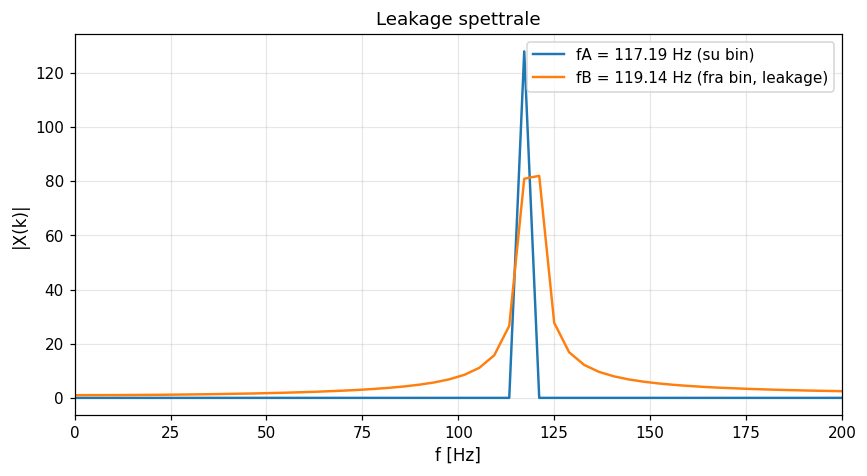

In [37]:
# Leakage: sinusoide la cui frequenza non cade su un bin
fs = 1000; N = 256
n  = np.arange(N)
f_bin = fs/N           # passo dei bin
# frequenza A: esattamente sul bin 30 ⇒ niente leakage
fA = 30 * f_bin
# frequenza B: a metà fra due bin ⇒ leakage massimo
fB = (30 + 0.5) * f_bin

xA = np.cos(2*np.pi*fA*n/fs)
xB = np.cos(2*np.pi*fB*n/fs)

XA = np.fft.fft(xA); XB = np.fft.fft(xB)
freqs = np.fft.fftfreq(N, d=1/fs)
mask  = freqs >= 0

fig, ax = plt.subplots()
ax.plot(freqs[mask], np.abs(XA[mask]), label=f"fA = {fA:.2f} Hz (su bin)")
ax.plot(freqs[mask], np.abs(XB[mask]), label=f"fB = {fB:.2f} Hz (fra bin, leakage)")
ax.set_xlim(0, 200); ax.set_xlabel("f [Hz]"); ax.set_ylabel("|X(k)|")
ax.set_title("Leakage spettrale"); ax.legend(); plt.show()


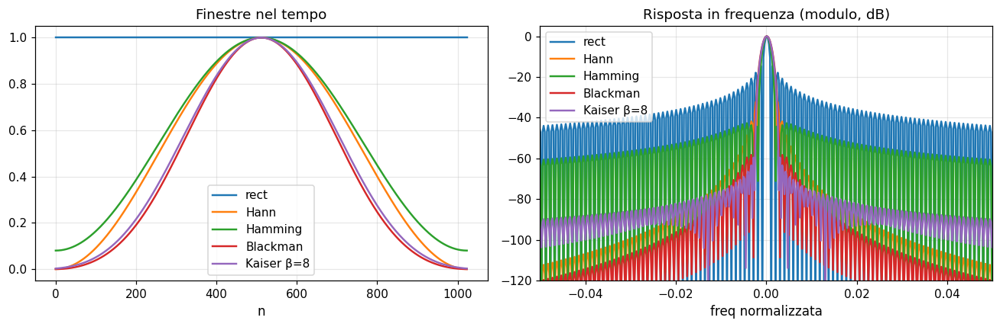

In [38]:
# Confronto finestre: rect, Hann, Hamming, Blackman, Kaiser
N = 1024
windows = {
    "rect"     : np.ones(N),
    "Hann"     : np.hanning(N),
    "Hamming"  : np.hamming(N),
    "Blackman" : np.blackman(N),
    "Kaiser β=8": np.kaiser(N, beta=8),
}
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
for name, w in windows.items():
    axes[0].plot(w, label=name)
    Wf = np.fft.fftshift(np.fft.fft(w/np.sum(w), n=4096))
    f  = np.linspace(-0.5, 0.5, 4096)
    axes[1].plot(f, 20*np.log10(np.maximum(np.abs(Wf), 1e-7)), label=name)
axes[0].set_title("Finestre nel tempo"); axes[0].set_xlabel("n"); axes[0].legend()
axes[1].set_xlim(-0.05, 0.05); axes[1].set_ylim(-120, 5)
axes[1].set_title("Risposta in frequenza (modulo, dB)")
axes[1].set_xlabel("freq normalizzata"); axes[1].legend()
plt.tight_layout(); plt.show()


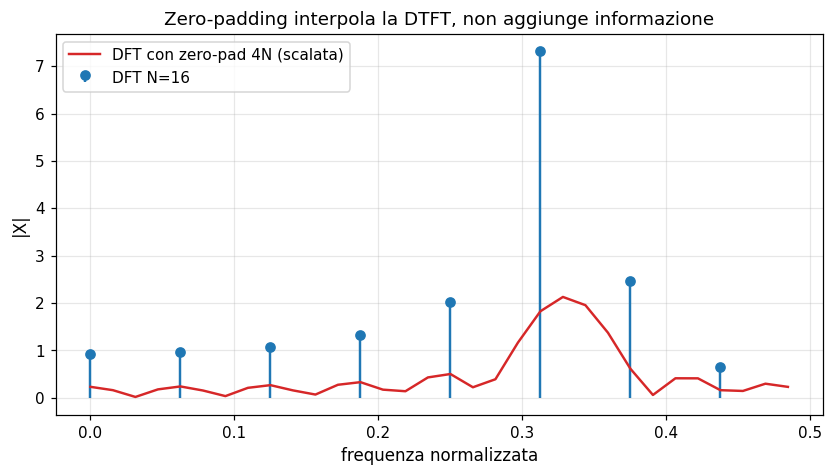

In [39]:
# Zero-padding: stessa sequenza, DFT a N e a 4N
N = 16
n = np.arange(N)
x = np.cos(2*np.pi*5.3*n/N)            # frequenza intermedia tra due bin

X_N  = np.fft.fft(x)                 # DFT a N
X_4N = np.fft.fft(x, n=4*N)          # DFT con zero-pad a 4N
f_N   = np.fft.fftfreq(N,   d=1.0)
f_4N  = np.fft.fftfreq(4*N, d=1.0)

m1 = f_N >= 0; m2 = f_4N >= 0
fig, ax = plt.subplots()
ax.stem(f_N[m1],  np.abs(X_N[m1]),  linefmt="C0-", markerfmt="C0o", basefmt=" ", label="DFT N=16")
ax.plot(f_4N[m2], np.abs(X_4N[m2])/4, "C3", label="DFT con zero-pad 4N (scalata)")
ax.set_xlabel("frequenza normalizzata"); ax.set_ylabel("|X|")
ax.set_title("Zero-padding interpola la DTFT, non aggiunge informazione")
ax.legend(); plt.show()


## 4.7 Trasformata Z, ROC, relazione con DTFT

**Definizione.** $X(z) = \sum_{n=-\infty}^{+\infty} x[n]\,z^{-n}$ con
$z\in\mathbb{C}$. La **ROC** è l'insieme dei $z$ per cui la serie converge in
modulo assoluto.

**Sequenze causali.** Se $x[n]=0$ per $n<0$, la ROC è esterna a un cerchio di
raggio uguale al modulo del polo più grande: $|z| > R_+$. Per sequenze
anticausali, è interna: $|z| < R_-$.

**Relazione con DTFT.** La DTFT è la trasformata Z **valutata sul cerchio
unitario** $z = e^{j\omega}$:
$$
X(e^{j\omega}) \;=\; X(z)\big|_{z=e^{j\omega}}.
$$
Esiste se e solo se la **circonferenza unitaria appartiene alla ROC**.

**Dim. relazione DTFT–Z.** Sostituendo $z=e^{j\omega}$:
$X(e^{j\omega}) = \sum_n x[n] e^{-j\omega n}$, che è esattamente la DTFT.
La convergenza richiede $\sum_n |x[n]|\,|e^{-j\omega n}| = \sum_n |x[n]|<\infty$
sul cerchio unitario, cioè la circonferenza è nella ROC. $\square$

**Stabilità BIBO ⇔ ROC contiene il cerchio unitario** (riprenderemo nel
capitolo filtri).


zeri  = [0.9]
poli  = [ 0.85207973 -0.35207973]


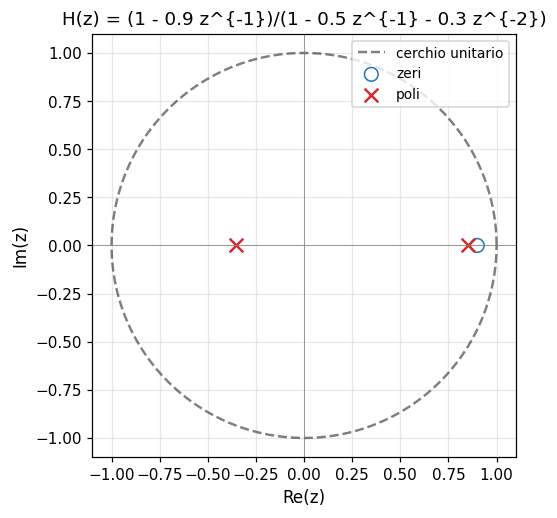

In [40]:
# Plot di poli e zeri di un sistema di esempio H(z) = (1 - 0.9 z^{-1}) / (1 - 0.5 z^{-1} - 0.3 z^{-2})
b = np.array([1.0, -0.9])
a = np.array([1.0, -0.5, -0.3])
zeros, poles, gain = signal.tf2zpk(b, a)
print("zeri  =", zeros)
print("poli  =", poles)

# Usiamo il helper plot_pole_zero definito a inizio notebook
plot_pole_zero(zeros, poles, title=r"H(z) = (1 - 0.9 z^{-1})/(1 - 0.5 z^{-1} - 0.3 z^{-2})")
plt.show()


## Must remember — Capitolo 4

1. **DFT = cambio di base** su esponenziali complessi; la matrice $W$ è unitaria
   a meno di $\sqrt N$.
2. **Parseval** preserva l'energia (con fattore $1/N$).
3. **Convoluzione lineare ↔ prodotto in frequenza** (con zero-padding per
   evitare l'aliasing temporale).
4. **Leakage**: la finestra che applichiamo (anche solo "rettangolare per
   troncamento") determina come l'energia si spande nei bin.
5. **Zero-padding ≠ migliore risoluzione**, solo interpolazione della DTFT.
6. **DTFT = trasformata Z sul cerchio unitario.**

## Esercizi capitolo 4

1. Costruire $W_4$ a mano e verificare $W^*W = 4 I$.
2. Calcolare la DFT di $x=[1,1,0,0]$ con la matrice e confrontare con `np.fft.fft`.
3. Mostrare numericamente Parseval su un segnale reale di lunghezza 32.
4. Applicare zero-padding a un cosenoide di durata 64 e visualizzare il modulo
   spettrale per $N_{pad} = 64, 128, 256, 1024$.
5. Disegnare poli/zeri di $H(z) = 1/(1 - 0.95 z^{-1})$ e discutere stabilità.


# Capitolo 5 — Filtri numerici FIR e IIR

In questo capitolo progettiamo filtri digitali. Partiamo dal filtro ideale e
dalle sue specifiche reali, vediamo le famiglie principali (Butterworth,
Chebyshev I/II, ellittici, FIR con finestratura e Kaiser), discutiamo
stabilità, fase lineare, group delay e trasformazione bilineare. Concludiamo
applicando i filtri a un ECG sintetico rumoroso.


## 5.1 Filtro ideale e specifiche reali

**Filtro ideale passabasso**: $|H(e^{j\omega})|=1$ per $|\omega|<\omega_c$, 0
altrove, fase nulla. È **non causale** e non realizzabile.

**Specifiche reali.** Si lavora con:

* **passband** $[0, \omega_p]$ con ripple massimo $\delta_p$ (oppure $A_p$ dB),
* **stopband** $[\omega_s, \pi]$ con attenuazione minima $A_s$ dB,
* **transition band** $[\omega_p, \omega_s]$.

**Trade-off tipico.** Maggiore selettività ⇒ ordine più alto, oppure ripple
ammesso in banda passante/stopband.

**FIR vs IIR.**

* **FIR** (Finite Impulse Response): fase **lineare** possibile (importante per
  biomedico), sempre stabile, ordine alto a parità di selettività.
* **IIR** (Infinite Impulse Response): ordine basso, ma fase non lineare e
  rischio di instabilità.


## 5.2 Famiglie IIR: Butterworth, Chebyshev, Ellittico

* **Butterworth.** Massimamente piatto in banda passante e stopband; transizione
  lenta. Ottima scelta quando vogliamo pochi artefatti.
* **Chebyshev I.** Ripple in passband, monotonico in stopband; transizione
  più ripida del Butterworth a parità di ordine.
* **Chebyshev II (inverso).** Monotonico in passband, ripple in stopband.
* **Ellittico (Cauer).** Ripple sia in passband sia in stopband; transizione
  *minima* a parità di ordine — ottimo per filtri molto selettivi.


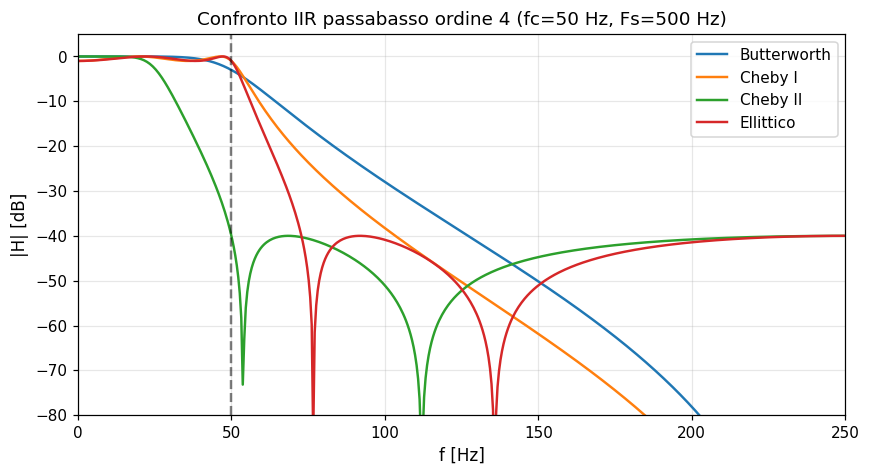

In [41]:
# Confronto risposta in ampiezza delle quattro famiglie IIR — passabasso a 50 Hz, Fs=500 Hz
fs = 500.0; fc = 50.0
order = 4
b_bu, a_bu = signal.butter(order, fc, fs=fs)
b_c1, a_c1 = signal.cheby1(order, rp=1.0, Wn=fc, fs=fs)        # ripple 1 dB in passband
b_c2, a_c2 = signal.cheby2(order, rs=40.0, Wn=fc, fs=fs)       # 40 dB in stopband
b_el, a_el = signal.ellip(order, rp=1.0, rs=40.0, Wn=fc, fs=fs)

fig, ax = plt.subplots()
for b, a, name in [(b_bu, a_bu, "Butterworth"),
                   (b_c1, a_c1, "Cheby I"),
                   (b_c2, a_c2, "Cheby II"),
                   (b_el, a_el, "Ellittico")]:
    w, h = signal.freqz(b, a, fs=fs)
    ax.plot(w, 20*np.log10(np.maximum(np.abs(h), 1e-6)), label=name)
ax.axvline(fc, color="k", ls="--", alpha=0.5)
ax.set_xlim(0, fs/2); ax.set_ylim(-80, 5)
ax.set_xlabel("f [Hz]"); ax.set_ylabel("|H| [dB]")
ax.set_title(f"Confronto IIR passabasso ordine {order} (fc=50 Hz, Fs=500 Hz)")
ax.legend(); plt.show()


## 5.3 FIR a fase lineare con finestratura

**Idea.** Si parte dalla risposta all'impulso del filtro **ideale**
$h_d[n] = \omega_c/\pi \cdot \mathrm{sinc}(\omega_c (n-M/2)/\pi)$ (per un
passabasso a fase lineare e di lunghezza $M+1$), poi la si moltiplica per una
finestra (Hann, Hamming, Blackman, Kaiser…) per limitare la durata e
controllare ripple/attenuazione.

**Vantaggi.** Sempre stabile, fase lineare ⇒ niente distorsione di fase, buon
controllo via finestra. **Svantaggi.** Lunghezza alta per selettività elevata.

**Kaiser.** La finestra Kaiser permette di scegliere $\beta$ in funzione di
ripple e attenuazione richiesti (formule di Kaiser–Bessel).


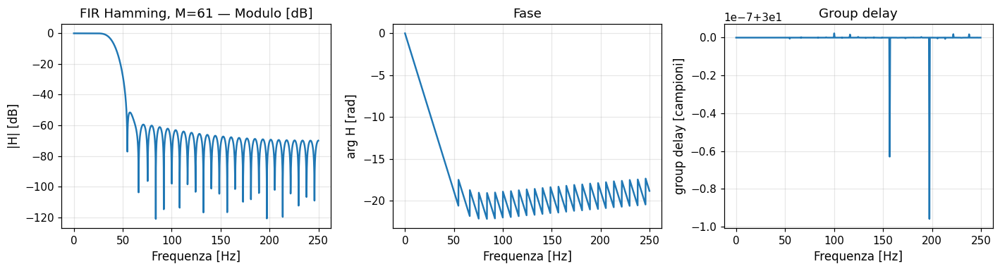

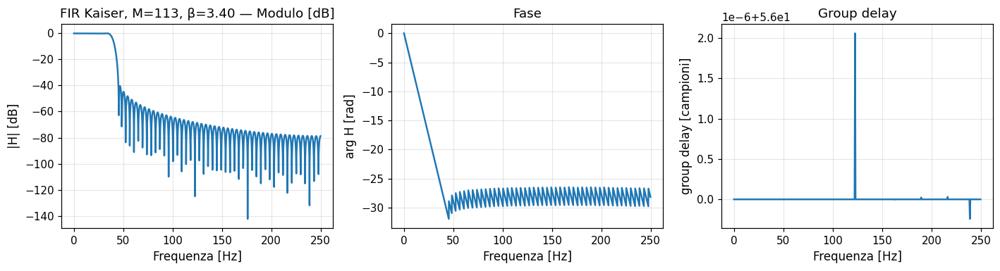

numtaps Hamming : 61
numtaps Kaiser  : 113   beta = 3.3953210522614574


In [42]:
# FIR passabasso fc=40 Hz con metodo della finestratura (Hamming) e Kaiser
fs = 500.0; fc = 40.0; numtaps = 61   # lunghezza dispari ⇒ fase lineare di tipo I

b_ham = signal.firwin(numtaps, cutoff=fc, fs=fs, window="hamming")
# Kaiser con specifiche: ripple 0.01, attenuazione 40 dB → calcoliamo β e numtaps
A = 40.0
beta = signal.kaiser_beta(A)
numtaps_k, beta_k = signal.kaiserord(A, width=10/(0.5*fs))
b_kai = signal.firwin(numtaps_k, cutoff=fc, window=("kaiser", beta_k), fs=fs)

# Visualizzazione
plot_filter_response(b_ham, [1.0], fs=fs, title=f"FIR Hamming, M={numtaps}")
plt.show()
plot_filter_response(b_kai, [1.0], fs=fs, title=f"FIR Kaiser, M={numtaps_k}, β={beta_k:.2f}")
plt.show()

print("numtaps Hamming :", numtaps)
print("numtaps Kaiser  :", numtaps_k, "  beta =", beta_k)


## 5.4 Filtri specifici biomedici: notch, bandpass, ECG

* **Notch a 50 Hz.** Rimuove l'interferenza di rete.
* **Bandpass ECG**: tipicamente 0.5 – 40 Hz per ECG diagnostico.
* **Bandpass EMG**: 20 – 500 Hz.
* **Bandpass EEG per ritmi**: 8 – 13 Hz per alpha, ecc.


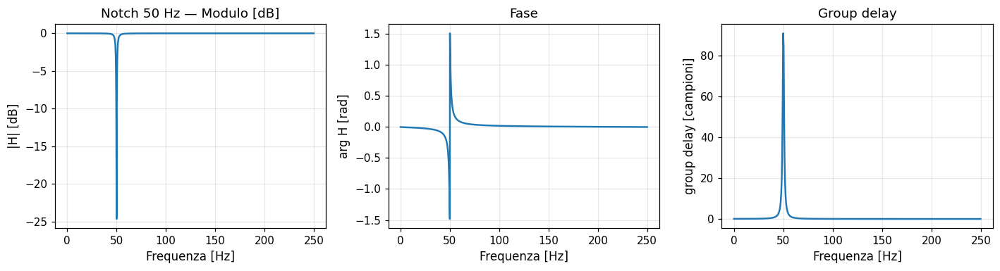

C:\Users\fra29\AppData\Local\Temp\ipykernel_178164\1860950617.py:54: UserWarning: The filter's denominator is extremely small at frequencies [0.000, 0.006, 0.012, 0.018, 0.025, 0.031], around which a singularity may be present
  w_gd, gd = signal.group_delay((b, a), fs=fs)


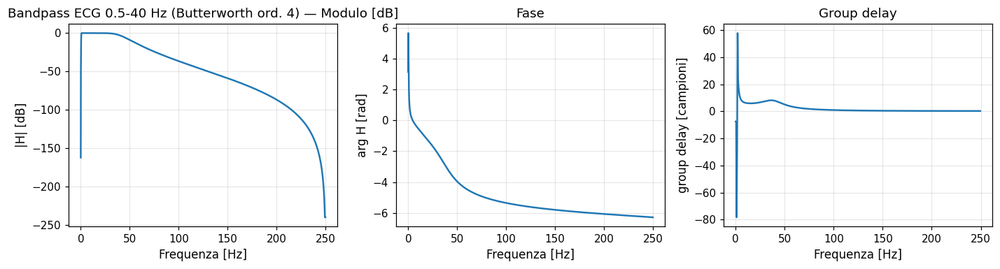

In [43]:
# Notch 50 Hz e bandpass ECG
fs = 500.0

# Notch IIR (forma trasversale con poli/zeri vicini al cerchio)
f_notch = 50.0; Q = 30.0
b_notch, a_notch = signal.iirnotch(w0=f_notch, Q=Q, fs=fs)

# Bandpass 0.5-40 Hz Butterworth ordine 4
b_bp, a_bp = signal.butter(N=4, Wn=[0.5, 40.0], btype="band", fs=fs)

plot_filter_response(b_notch, a_notch, fs=fs, title="Notch 50 Hz")
plt.show()
plot_filter_response(b_bp, a_bp, fs=fs, title="Bandpass ECG 0.5-40 Hz (Butterworth ord. 4)")
plt.show()


## 5.5 Fase lineare, group delay e filtraggio "zero-phase"

* **Fase lineare.** Se $\arg H(e^{j\omega}) = -\alpha\omega + \beta$ allora il
  filtro introduce solo un ritardo costante $\alpha$ (per i FIR simmetrici è
  $(M-1)/2$). Non distorce la forma d'onda — cruciale per ECG, dove la
  morfologia è clinica.
* **Group delay.** $\tau_g(\omega) = -\,\dfrac{d\,\arg H(e^{j\omega})}{d\omega}$.
  Costante ⇔ fase lineare.
* **Filtraggio zero-phase** (`scipy.signal.filtfilt`): applica il filtro in
  avanti e poi all'indietro. Cancella la fase, raddoppia l'ordine effettivo, ma
  è **non causale** (richiede tutto il segnale in memoria). Ottimo per analisi
  offline.


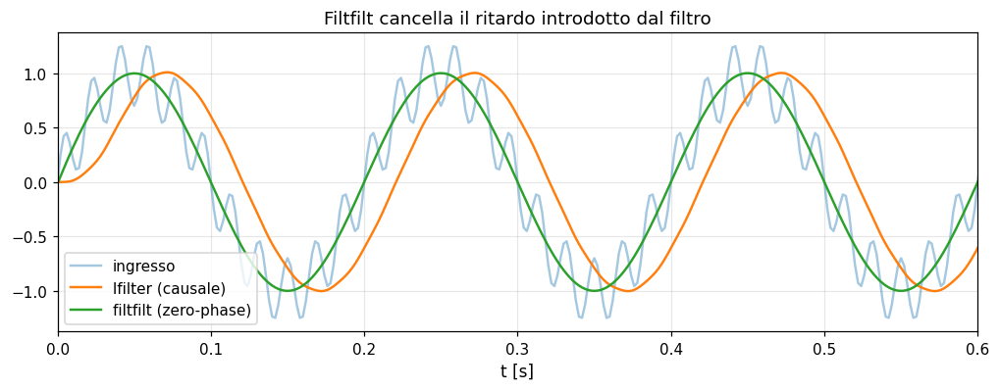

In [44]:
# Confronto: filtfilt (zero-phase) vs lfilter (causale)
fs = 500.0; t = np.arange(0, 2, 1/fs)
x = (np.sin(2*np.pi*5*t) +
     0.3*np.sin(2*np.pi*55*t))               # 5 Hz utile, 55 Hz rumoroso

b, a = signal.butter(4, Wn=20, btype="low", fs=fs)
y_caus = signal.lfilter(b, a, x)
y_zero = signal.filtfilt(b, a, x)

fig, ax = plt.subplots(figsize=(11, 3.6))
ax.plot(t, x, alpha=0.4, label="ingresso")
ax.plot(t, y_caus, label="lfilter (causale)")
ax.plot(t, y_zero, label="filtfilt (zero-phase)")
ax.set_xlim(0, 0.6); ax.set_xlabel("t [s]")
ax.set_title("Filtfilt cancella il ritardo introdotto dal filtro")
ax.legend(); plt.show()


## 5.6 Trasformazione bilineare (derivazione)

**Definizione.**
$$
s \;=\; \frac{2}{T}\,\frac{1-z^{-1}}{1+z^{-1}}\quad\Longleftrightarrow\quad
z \;=\; \frac{2/T + s}{2/T - s}.
$$

**Idea (giustificazione via Taylor).** Lo schema di Tustin approssima
l'integrale continuo $H_c(s)$ con l'integrazione **trapezoidale**: applicando
la regola dei trapezi a $\dot y(t) = a y(t) + b u(t)$ si ottiene la relazione
sopra. Sviluppando $z = e^{sT}\approx 1 + sT + (sT)^2/2 + \dots$ e troncando a
secondo ordine si ritrova proprio la trasformazione bilineare.

**Mapping del piano $s$ al piano $z$.** L'asse immaginario $s = j\Omega$ si
mappa sulla circonferenza unitaria $|z|=1$ (si verifica sostituendo
$s = j\Omega$ e calcolando $|z|$). Il semipiano sinistro $\Re(s)<0$ si mappa
nell'interno del cerchio unitario $|z|<1$ ⇒ **stabilità preservata**.

**Prewarping.** Il mapping è non lineare in frequenza:
$\omega = 2\arctan(\Omega T/2)$. Per filtri con frequenze critiche da preservare,
si "pre-distorce" la frequenza analogica: $\Omega' = (2/T)\tan(\omega/2)$.

**Esempio numerico.** Mappiamo un Butterworth analogico passabasso $f_c = 10$ Hz
in digitale a $F_s = 100$ Hz con bilineare e prewarping.


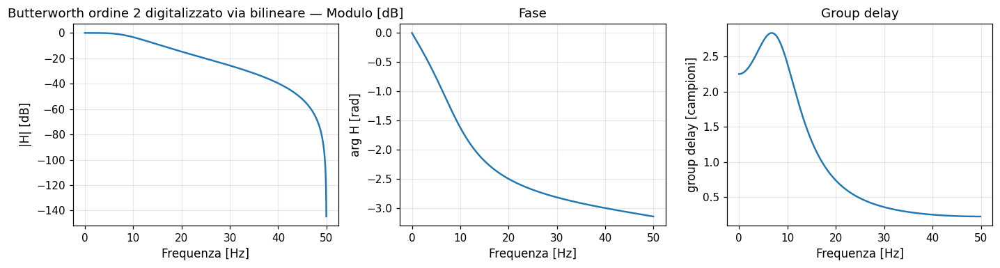

In [45]:
# Esempio bilineare + prewarping
fs = 100.0; fc = 10.0
# Filtro analogico continuo Butterworth ordine 2
b_a, a_a = signal.butter(2, 2*np.pi*fc, btype="low", analog=True)
# Bilineare con prewarping di scipy
b_d, a_d = signal.bilinear(b_a, a_a, fs)

plot_filter_response(b_d, a_d, fs=fs, title="Butterworth ordine 2 digitalizzato via bilineare")
plt.show()


## 5.7 Applicazione a ECG sintetico rumoroso


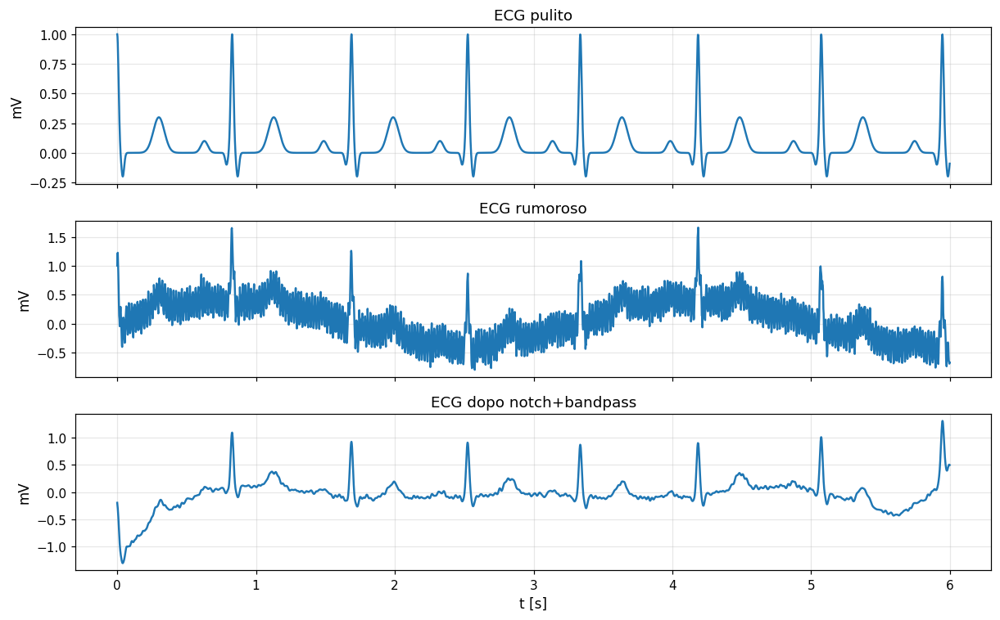

In [46]:
# Pipeline minimale: ECG + rumore di rete + baseline → notch + bandpass
def synth_ecg(duration=8.0, fs=500.0, hr_bpm=72.0, seed=0):
    rng = np.random.default_rng(seed)
    t = np.arange(0, duration, 1/fs)
    rr = 60.0/hr_bpm
    n_beats = int(np.ceil(duration/rr)) + 2
    rr_seq = rr*(1 + 0.05*rng.standard_normal(n_beats))
    beat_times = np.cumsum(rr_seq) - rr_seq[0]
    waves = [(-0.2,0.10,0.025), (-0.04,-0.1,0.01),
             (0,1.0,0.01), (0.04,-0.2,0.01), (0.3,0.3,0.04)]
    ecg = np.zeros_like(t)
    for tb in beat_times:
        for off, A, w in waves:
            ecg += A*np.exp(-((t-(tb+off))**2)/(2*w**2))
    return t, ecg

fs = 500.0
t, ecg_clean = synth_ecg(duration=6.0, fs=fs)

rng = np.random.default_rng(11)
mains    = 0.25*np.sin(2*np.pi*50*t)
baseline = 0.4 *np.sin(2*np.pi*0.3*t)
gauss    = 0.05*rng.standard_normal(len(t))
ecg_noisy = ecg_clean + mains + baseline + gauss

# Notch + bandpass
b_n, a_n = signal.iirnotch(50, Q=30, fs=fs)
b_b, a_b = signal.butter(4, [0.5, 40], btype="band", fs=fs)

ecg_step1 = signal.filtfilt(b_n, a_n, ecg_noisy)
ecg_filt  = signal.filtfilt(b_b, a_b, ecg_step1)

fig, axes = plt.subplots(3, 1, figsize=(11, 7), sharex=True)
axes[0].plot(t, ecg_clean);  axes[0].set_title("ECG pulito");           axes[0].set_ylabel("mV")
axes[1].plot(t, ecg_noisy);  axes[1].set_title("ECG rumoroso");          axes[1].set_ylabel("mV")
axes[2].plot(t, ecg_filt);   axes[2].set_title("ECG dopo notch+bandpass"); axes[2].set_ylabel("mV")
axes[2].set_xlabel("t [s]")
plt.tight_layout(); plt.show()


## 5.8 Errori comuni nella progettazione di filtri

* **Confondere Hz e rad/sample.** Le routine di `scipy.signal` accettano `fs`,
  ma se non lo passi devi normalizzare la frequenza a $f_c/(F_s/2)$.
* **Dimenticare Nyquist.** Provare a progettare un filtro con $f_c > F_s/2$ è
  un errore di logica, non solo di codice.
* **Usare `filtfilt` per dati real-time.** È non causale: serve l'intero
  segnale. In real-time si usano filtri causali.
* **Ignorare la fase.** Per analisi di morfologia (ECG, EMG diagnostico) la
  distorsione di fase è clinicamente rilevante.
* **Progettare IIR instabili.** Poli fuori dal cerchio unitario ⇒ uscita
  divergente. Sempre verificare `np.max(np.abs(poles)) < 1` o usare la
  rappresentazione SOS.
* **Non controllare gli artefatti di transizione.** All'inizio e alla fine del
  filtraggio si vedono transitori. Usare `padlen` di `filtfilt` o scartare i
  primi/ultimi campioni.

## Must remember — Capitolo 5

1. **FIR**: stabili, fase lineare possibile, lunghezza alta.
2. **IIR**: efficienti, ma può perdere stabilità o fase lineare.
3. **Butterworth/Chebyshev/Ellittico**: scelta in base a piattezza vs ripeness.
4. **Trasformazione bilineare** mappa $s\to z$, asse $j\Omega\to|z|=1$;
   serve **prewarping** per frequenze critiche.
5. **filtfilt** per analisi offline (zero-phase), **lfilter** per real-time.

## Esercizi capitolo 5

1. Progettare un FIR passabanda ECG (0.5-40 Hz) a fase lineare, $M=201$ a
   $F_s=500$ Hz, e confrontarlo con un IIR Butterworth ord.4.
2. Progettare un notch a 60 Hz con $Q=30$ per uso in USA e applicarlo a un
   segnale sintetico con rete a 60 Hz.
3. Mostrare numericamente che `filtfilt` raddoppia l'attenuazione (in dB)
   rispetto a `lfilter`.
4. Mappare con bilineare un Butterworth analogico ordine 3 con $f_c=20$ Hz a un
   digitale con $F_s=200$ Hz e confrontare con la versione `signal.butter`
   diretta digitale.
5. Mostrare con `signal.tf2zpk` che un IIR ord.6 progettato a passabanda
   ravvicinato può avere poli vicini al cerchio unitario, e che la forma `sos`
   è più stabile.


# Capitolo 6 — Variabili aleatorie e probabilità

Capitolo introduttivo alla probabilità necessaria per i processi stocastici e
le decisioni cliniche. Costruiamo le basi (esperimento, evento, probabilità),
le variabili aleatorie (PDF/CDF), media e varianza, covarianza e correlazione,
distribuzioni congiunte/condizionate, e il teorema di Bayes con un esempio
clinico completo.


## 6.1 Esperimento aleatorio, eventi e probabilità

**Spazio campionario $\Omega$.** L'insieme di tutti gli esiti possibili di un
esperimento aleatorio.

**Evento.** Un sottoinsieme $A\subseteq \Omega$.

**Probabilità.** Una funzione $P: 2^\Omega \to [0,1]$ che soddisfa:

1. $P(\Omega) = 1$;
2. $P(A)\ge 0$ per ogni $A$;
3. $P\left(\bigcup_i A_i\right) = \sum_i P(A_i)$ per famiglie numerabili
   disgiunte.

**Probabilità condizionata.** $P(A|B) = P(A\cap B)/P(B)$ se $P(B)>0$.

**Indipendenza.** $A\perp B$ se $P(A\cap B) = P(A)P(B)$, equivalentemente
$P(A|B) = P(A)$.

**Variabile aleatoria reale.** Funzione $X: \Omega \to \mathbb{R}$ misurabile.
Per i segnali, $X(\omega)$ è il valore numerico di un campione, di una
ampiezza, di una decisione binaria, ecc.

**CDF.** $F_X(x) = P(X\le x)$, non decrescente, continua a destra, con
$\lim_{x\to-\infty}F=0$ e $\lim_{x\to+\infty}F=1$.

**PDF (per variabili continue).** $f_X(x) = dF_X/dx$, con $\int f_X dx = 1$ e
$P(a<X\le b) = \int_a^b f_X(x)\,dx$.

**Esempi.**

* Uniforme $\mathcal{U}(a,b)$: $f(x) = 1/(b-a)$ in $[a,b]$.
* Gaussiana $\mathcal{N}(\mu,\sigma^2)$:
  $f(x) = \tfrac{1}{\sqrt{2\pi}\sigma}\exp\!\big(-(x-\mu)^2/(2\sigma^2)\big)$.
* Esponenziale di tasso $\lambda$: $f(x) = \lambda e^{-\lambda x}$ per $x\ge 0$.


## 6.2 Media, varianza, covarianza, correlazione

**Media (valore atteso).** $\mathbb{E}[X] = \int x f_X(x)\,dx$ (continuo);
$\mathbb{E}[X] = \sum_k x_k\,p_k$ (discreto).

**Varianza e dev.std.** $\operatorname{Var}(X) = \mathbb{E}[(X-\mathbb{E}X)^2]
= \mathbb{E}[X^2] - (\mathbb{E}X)^2$; $\sigma_X = \sqrt{\operatorname{Var}(X)}$.

**Covarianza.** $\operatorname{Cov}(X,Y) = \mathbb{E}[(X-\mathbb{E}X)(Y-\mathbb{E}Y)]
= \mathbb{E}[XY] - \mathbb{E}X\,\mathbb{E}Y$.

**Correlazione (coeff. di Pearson).**
$\rho_{XY} = \operatorname{Cov}(X,Y)/(\sigma_X\sigma_Y)\in [-1, 1]$. Misura
**linearità**: $\rho = \pm 1$ ⇔ $Y = aX+b$.

**Indipendenza ⇒ scorrelazione**, ma non viceversa: $\operatorname{Cov}=0$ non
implica indipendenza in generale (controesempio: $Y = X^2$ con $X$ simmetrica).

**Matrice di covarianza (multivariato).** Per
$\mathbf{X}=(X_1,\dots,X_p)^\top$:
$$
\Sigma_{ij} \;=\; \operatorname{Cov}(X_i, X_j),\qquad
\Sigma = \mathbb{E}\!\bigl[(\mathbf{X}-\boldsymbol{\mu})(\mathbf{X}-\boldsymbol{\mu})^\top\bigr].
$$
$\Sigma$ è simmetrica e semidefinita positiva.


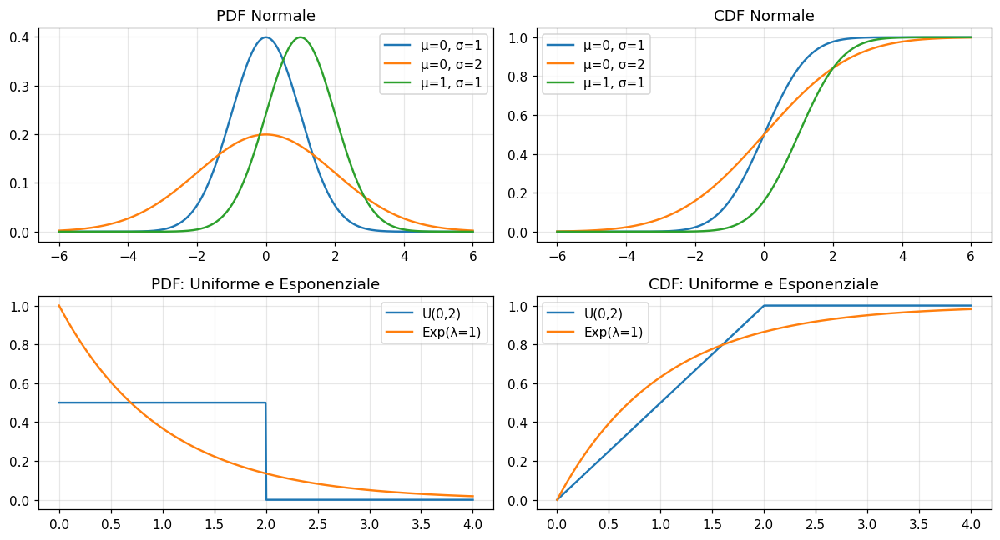

In [47]:
# Visualizziamo PDF/CDF di Normale, Uniforme, Esponenziale e effetto di μ, σ
x = np.linspace(-6, 6, 600)
fig, axes = plt.subplots(2, 2, figsize=(11, 6))

# Normale con varie μ, σ
for mu, s in [(0, 1), (0, 2), (1, 1)]:
    axes[0,0].plot(x, stats.norm.pdf(x, mu, s), label=f"μ={mu}, σ={s}")
axes[0,0].set_title("PDF Normale"); axes[0,0].legend()

for mu, s in [(0, 1), (0, 2), (1, 1)]:
    axes[0,1].plot(x, stats.norm.cdf(x, mu, s), label=f"μ={mu}, σ={s}")
axes[0,1].set_title("CDF Normale"); axes[0,1].legend()

# Uniforme e Esponenziale (su asse positivo)
xp = np.linspace(0, 4, 600)
axes[1,0].plot(xp, stats.uniform.pdf(xp, 0, 2), label="U(0,2)")
axes[1,0].plot(xp, stats.expon.pdf(xp,  scale=1), label="Exp(λ=1)")
axes[1,0].set_title("PDF: Uniforme e Esponenziale"); axes[1,0].legend()
axes[1,1].plot(xp, stats.uniform.cdf(xp, 0, 2), label="U(0,2)")
axes[1,1].plot(xp, stats.expon.cdf(xp,  scale=1), label="Exp(λ=1)")
axes[1,1].set_title("CDF: Uniforme e Esponenziale"); axes[1,1].legend()
plt.tight_layout(); plt.show()


## 6.3 Distribuzione congiunta, marginale, condizionata; correlazione

**Congiunta.** $f_{X,Y}(x,y)$. **Marginale.** $f_X(x) = \int f_{X,Y}(x,y)\,dy$.
**Condizionata.** $f_{Y|X}(y|x) = f_{X,Y}(x,y)/f_X(x)$.

**Indipendenza.** $f_{X,Y}(x,y) = f_X(x)\,f_Y(y)$.

**Esempio: gaussiana bivariata con $\rho\in\{-0.8, 0, 0.8\}$.**


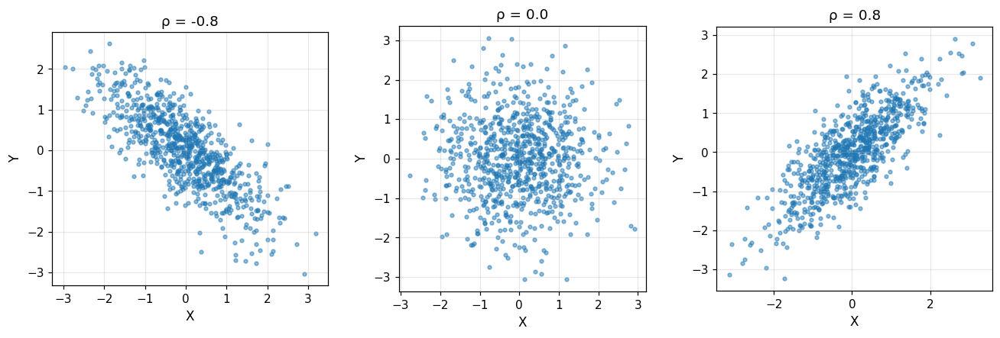

In [48]:
# Scatter di campioni bivariati con vari ρ
rng = np.random.default_rng(42)
N = 800
fig, axes = plt.subplots(1, 3, figsize=(12, 4))
for ax, rho in zip(axes, [-0.8, 0.0, 0.8]):
    Sigma = np.array([[1, rho], [rho, 1]])
    L = np.linalg.cholesky(Sigma)
    z = rng.standard_normal((N, 2)) @ L.T
    ax.scatter(z[:,0], z[:,1], s=10, alpha=0.5)
    ax.set_title(f"ρ = {rho}")
    ax.set_xlabel("X"); ax.set_ylabel("Y")
    ax.set_aspect("equal", adjustable="box")
plt.tight_layout(); plt.show()


## 6.4 Teorema di Bayes (dimostrazione ed esempio clinico)

**Dimostrazione.** Per definizione $P(A|B)P(B) = P(A\cap B) = P(B|A)P(A)$,
da cui
$$
P(A|B) \;=\; \frac{P(B|A)\,P(A)}{P(B)}.
$$
Inoltre $P(B) = P(B|A)P(A) + P(B|\bar A)P(\bar A)$ (formula delle probabilità
totali). $\square$

**Significato.** Permette di **invertire la direzione** della condizionata. In
test diagnostici:

* $P(D)$ = prevalenza,
* $\mathrm{Se} = P(T^+|D)$ = sensibilità,
* $\mathrm{Sp} = P(T^-|\bar D)$ = specificità,
* $\mathrm{PPV} = P(D|T^+) = \dfrac{\mathrm{Se}\,P(D)}{\mathrm{Se}\,P(D) + (1-\mathrm{Sp})(1-P(D))}$.

**Esempio numerico.** Malattia con prevalenza $P(D) = 1\%$, test con sensibilità
$99\%$ e specificità $95\%$. Qual è la probabilità di avere davvero la malattia
dato test positivo?

$\mathrm{PPV} = \tfrac{0.99 \cdot 0.01}{0.99\cdot 0.01 + 0.05\cdot 0.99} \approx 0.167$.

Quindi anche un test "molto sensibile" non basta in popolazioni a bassa
prevalenza: l'**87%** dei test positivi sono falsi positivi. Lezione tipica di
epidemiologia, fondamentale per il signal processing biomedico applicato.


PPV = 0.167 (probabilità di malattia se test positivo)
NPV = 1.000 (probabilità di star bene se test negativo)


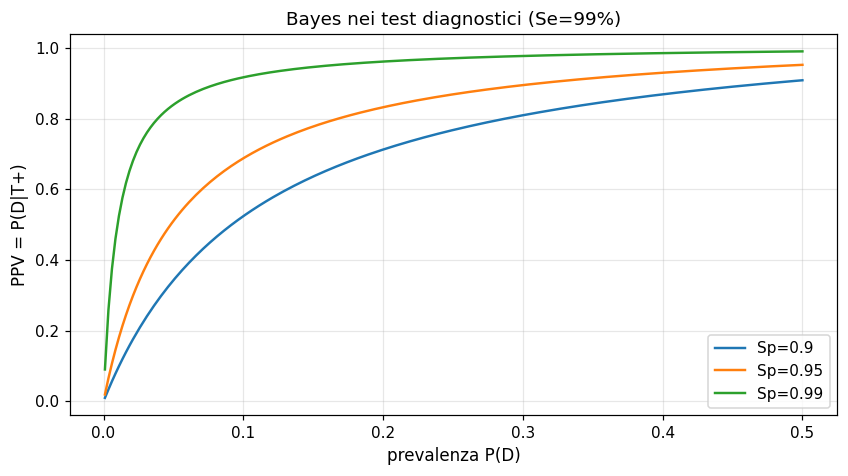


Tabella di contingenza (popolazione 10 000, prev=1%, Se=99%, Sp=95%):
           T+        T-
  D+      99.0       1.0
  D-     495.0    9405.0


In [49]:
# Funzione PPV/NPV e tabella di contingenza
def bayes_ppv(prevalence, sensitivity, specificity):
    P_T_pos = sensitivity*prevalence + (1-specificity)*(1-prevalence)
    PPV = sensitivity*prevalence / P_T_pos
    P_T_neg = specificity*(1-prevalence) + (1-sensitivity)*prevalence
    NPV = specificity*(1-prevalence) / P_T_neg
    return PPV, NPV

prev = 0.01; se = 0.99; sp = 0.95
PPV, NPV = bayes_ppv(prev, se, sp)
print(f"PPV = {PPV:.3f} (probabilità di malattia se test positivo)")
print(f"NPV = {NPV:.3f} (probabilità di star bene se test negativo)")

# Curva PPV in funzione della prevalenza per due valori di specificità
prevs = np.linspace(0.001, 0.5, 200)
fig, ax = plt.subplots()
for sp_ in [0.90, 0.95, 0.99]:
    ppvs = [bayes_ppv(p, 0.99, sp_)[0] for p in prevs]
    ax.plot(prevs, ppvs, label=f"Sp={sp_}")
ax.set_xlabel("prevalenza P(D)"); ax.set_ylabel("PPV = P(D|T+)")
ax.set_title("Bayes nei test diagnostici (Se=99%)")
ax.legend(); plt.show()

# Tabella di contingenza per popolazione di 10 000 persone
N_pop = 10_000
TP = se*prev*N_pop
FN = (1-se)*prev*N_pop
FP = (1-sp)*(1-prev)*N_pop
TN = sp*(1-prev)*N_pop
print("\nTabella di contingenza (popolazione 10 000, prev=1%, Se=99%, Sp=95%):")
print(f"           T+        T-")
print(f"  D+   {TP:7.1f}   {FN:7.1f}")
print(f"  D-   {FP:7.1f}   {TN:7.1f}")


## Must remember — Capitolo 6

1. **Probabilità** = misura normalizzata su un'algebra di eventi.
2. **PDF/CDF** caratterizzano una v.a.; media e varianza ne riassumono il primo
   e il secondo momento.
3. **Correlazione** = covarianza normalizzata, misura linearità.
4. **Bayes** inverte la direzione della condizionata; con bassa prevalenza
   anche un test ottimo ha bassissimo PPV.

## Esercizi capitolo 6

1. Verificare numericamente che, per una gaussiana standard, $P(|X|<1.96)\approx 0.95$.
2. Generare 10 000 coppie di una bivariata con $\rho=0.6$ e stimare $\rho$ via
   `numpy.corrcoef`.
3. Calcolare PPV e NPV per Se=80%, Sp=99%, prevalenza 0.5%.
4. Disegnare in funzione della prevalenza la curva PPV per un test con
   Se=95%, Sp=90%.


# Capitolo 7 — Processi stocastici e spettri di potenza

Da un singolo segnale ad un **ensemble di realizzazioni**. Stazionarietà,
ergodicità, autocorrelazione, densità spettrale di potenza, metodi
non-parametrici (periodogramma, Welch) e parametrici (AR via Yule–Walker).


## 7.1 Processo stocastico: definizione e linguaggio

Un **processo stocastico** a tempo discreto è una famiglia di variabili aleatorie
$\{X[n]\}_{n\in\mathbb{Z}}$ definite sullo stesso spazio probabilistico. Per
ogni $n$, $X[n]$ è una v.a.; per ogni realizzazione $\omega$, la sequenza
$\{X[n](\omega)\}$ è una funzione del tempo (una *realizzazione*).

**Quattro punti di vista.**

1. **Fissato $n$**: distribuzione marginale di $X[n]$.
2. **Fissati $n_1, n_2$**: distribuzione congiunta di $(X[n_1], X[n_2])$.
3. **Fissato $\omega$**: una singola realizzazione $x[n]$.
4. **Ensemble**: insieme di tutte le realizzazioni.

**Statistiche.**

* Media (in ensemble): $\mu_X[n] = \mathbb{E}[X[n]]$.
* Autocorrelazione: $R_X[n_1, n_2] = \mathbb{E}[X[n_1] X[n_2]^*]$.
* Autocovarianza: $C_X[n_1, n_2] = R_X[n_1, n_2] - \mu_X[n_1]\mu_X[n_2]^*$.

**Stazionarietà in senso lato (WSS).**

* $\mu_X[n] = \mu_X$ costante,
* $R_X[n_1, n_2] = R_X[\ell]$ con $\ell = n_1 - n_2$.

**Ergodicità (in media).** Le statistiche temporali coincidono con quelle di
ensemble: $\hat\mu = \frac1N\sum_n x[n] \to \mu_X$. È un'ipotesi di lavoro
spesso ragionevole su segnali biomedici stabili.


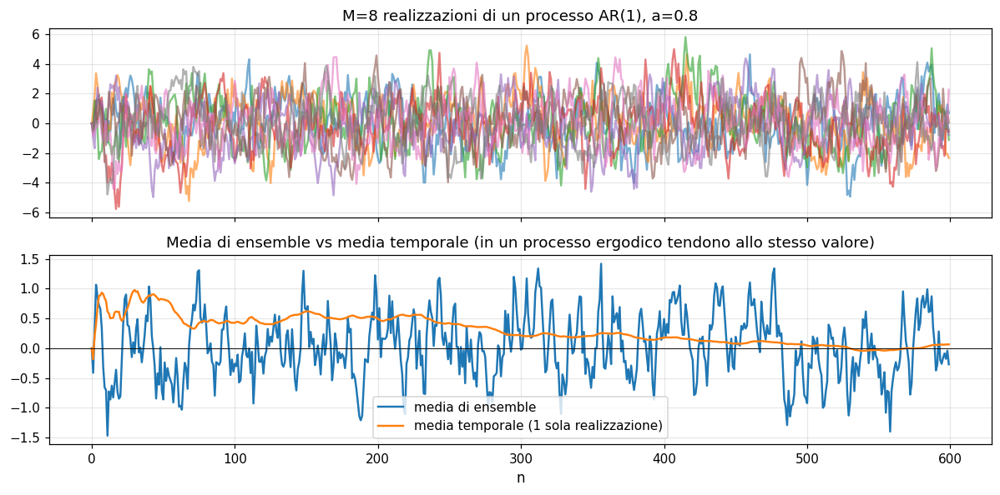

In [50]:
# Simuliamo M realizzazioni di un processo AR(1): X[n] = a X[n-1] + w[n]
M = 8; N = 600; a = 0.8
rng = np.random.default_rng(123)
X = np.zeros((M, N))
for m in range(M):
    w = rng.standard_normal(N)
    for n in range(1, N):
        X[m, n] = a*X[m, n-1] + w[n]

fig, axes = plt.subplots(2, 1, figsize=(11, 5.5), sharex=True)
for m in range(M):
    axes[0].plot(X[m], alpha=0.6)
axes[0].set_title(f"M={M} realizzazioni di un processo AR(1), a={a}")

# Media di ensemble (su M traiettorie) vs media temporale di una sola realizzazione
mean_ens = X.mean(axis=0)
mean_time = np.cumsum(X[0])/np.arange(1, N+1)
axes[1].plot(mean_ens, label="media di ensemble")
axes[1].plot(mean_time, label="media temporale (1 sola realizzazione)")
axes[1].axhline(0, color="k", lw=0.6)
axes[1].set_xlabel("n"); axes[1].legend()
axes[1].set_title("Media di ensemble vs media temporale (in un processo ergodico tendono allo stesso valore)")
plt.tight_layout(); plt.show()


## 7.2 Autocorrelazione e teorema di Wiener–Khinchin

**Definizione (WSS).** $r_X[\ell] = \mathbb{E}[X[n+\ell]\,X[n]^*]$.

**Proprietà.**
$r_X[0] = \mathbb{E}|X|^2 \ge 0$,
$r_X[-\ell] = r_X[\ell]^*$,
$|r_X[\ell]| \le r_X[0]$.

**Densità spettrale di potenza (PSD).**
$$
S_X(e^{j\omega}) \;=\; \sum_{\ell=-\infty}^{+\infty} r_X[\ell]\,e^{-j\omega\ell}.
$$

**Teorema di Wiener–Khinchin.** Per un processo WSS, la PSD è la DTFT
dell'autocorrelazione, ed essa è **reale, non negativa e $2\pi$-periodica**.

**Dimostrazione (idea).** Considera $Y_N[\omega] = \sum_{n=0}^{N-1} X[n]e^{-j\omega n}$
e calcola $\mathbb{E}|Y_N|^2/N$. Espandendo il modulo quadro e usando la
stazionarietà:
$$
\frac{1}{N}\mathbb{E}|Y_N|^2 = \sum_{\ell=-(N-1)}^{N-1}\!\!\Bigl(1 - \frac{|\ell|}{N}\Bigr) r_X[\ell]\,e^{-j\omega\ell}.
$$
Passando al limite $N\to\infty$ otteniamo $S_X(e^{j\omega}) = \sum_\ell r_X[\ell]e^{-j\omega\ell}$.
La non-negatività deriva dal fatto che è limite di valori di
$|Y_N|^2/N \ge 0$. $\square$

**Conseguenza.** Potenza totale del processo = area sotto la PSD:
$$
\mathbb{E}|X[n]|^2 = r_X[0] = \frac{1}{2\pi}\int_{-\pi}^{\pi} S_X(e^{j\omega})\,d\omega.
$$


## 7.3 Stima dell'autocorrelazione

Dati $N$ campioni di una realizzazione:

* **Stima biased**: $\hat r_b[\ell] = \dfrac{1}{N}\sum_{n=0}^{N-|\ell|-1} x[n+|\ell|]\,x[n]$.
* **Stima unbiased**: $\hat r_u[\ell] = \dfrac{1}{N-|\ell|}\sum_{n=0}^{N-|\ell|-1} x[n+|\ell|]\,x[n]$.

La biased è consistente in MSE e produce una stima di PSD garantitamente non
negativa (necessaria per Wiener–Khinchin). La unbiased ha più rumore ai lag
grandi.


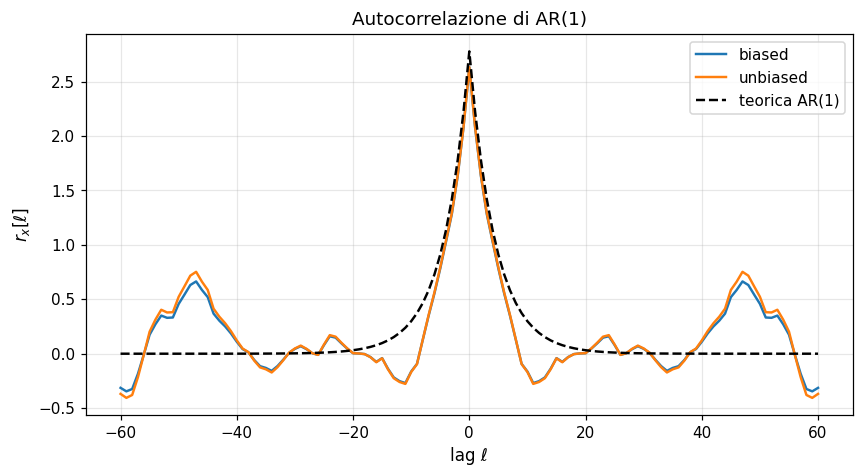

In [51]:
# Implementazione esplicita dell'autocorrelazione biased e unbiased
def autocorr_explicit(x, max_lag=None, unbiased=False):
    x = np.asarray(x, dtype=float)
    N = len(x);
    if max_lag is None: max_lag = N-1
    lags = np.arange(-max_lag, max_lag+1)
    r = np.zeros(len(lags))
    for i, lag in enumerate(lags):
        L = abs(lag)
        s = np.sum(x[L:] * x[:N-L])
        r[i] = s/(N - L) if unbiased else s/N
    return lags, r

N = 400; a = 0.8
rng = np.random.default_rng(0)
w = rng.standard_normal(N)
x = signal.lfilter([1], [1, -a], w)        # AR(1) di parametro a

lags, r_b = autocorr_explicit(x, max_lag=60, unbiased=False)
_,    r_u = autocorr_explicit(x, max_lag=60, unbiased=True)

# Teorica: r_X[ℓ] = σ_w^2 a^{|ℓ|}/(1-a^2) per AR(1)
r_theory = 1.0 * a**np.abs(lags)/(1 - a**2)

fig, ax = plt.subplots()
ax.plot(lags, r_b, label="biased")
ax.plot(lags, r_u, label="unbiased")
ax.plot(lags, r_theory, "k--", label="teorica AR(1)")
ax.set_xlabel("lag ℓ"); ax.set_ylabel(r"$r_x[\ell]$"); ax.set_title("Autocorrelazione di AR(1)")
ax.legend(); plt.show()


## 7.4 Periodogramma e Welch

**Periodogramma**: stima diretta della PSD via DFT:
$$
\hat P_\text{per}(f_k) = \frac{1}{N\,F_s}\,|X[k]|^2.
$$
È **non consistente** (varianza non tende a zero al crescere di $N$).

**Metodo di Welch.** Divide il segnale in $K$ segmenti con overlap, applica una
finestra a ognuno, calcola il periodogramma e ne fa la media. Riduce la
varianza di un fattore $\sim K$, a costo di una peggior risoluzione in
frequenza.

**Parametri di Welch.**

* `nperseg`: lunghezza del segmento; più lungo ⇒ migliore risoluzione, peggior
  varianza.
* `noverlap`: tipicamente $50\%$ di `nperseg` (per Hann).
* `window`: Hann è una scelta robusta.


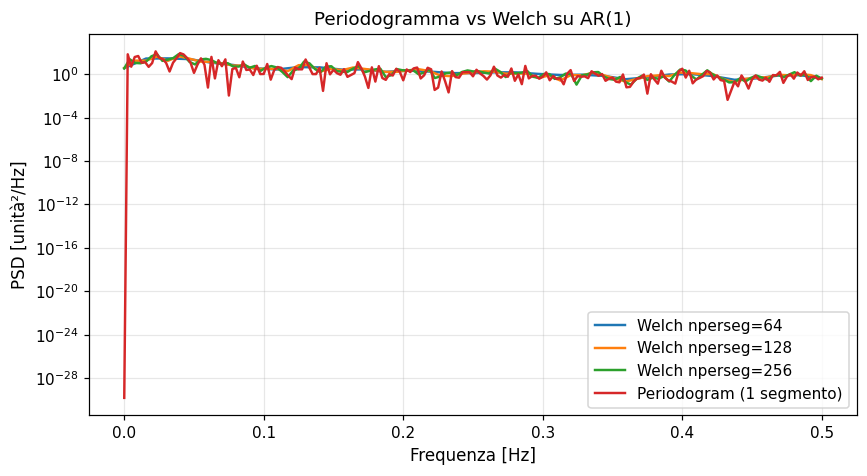

In [52]:
# Periodogramma rumoroso vs Welch più stabile, su AR(1) di prima
fs = 1.0    # usiamo frequenza normalizzata
f_per, Pper = signal.periodogram(x, fs=fs)
psds = {}
for nperseg in [64, 128, 256]:
    f_w, Pw = signal.welch(x, fs=fs, nperseg=nperseg, noverlap=nperseg//2,
                           window="hann")
    psds[f"Welch nperseg={nperseg}"] = (f_w, Pw)
psds["Periodogram (1 segmento)"] = (f_per, Pper)
plot_psd_comparison(psds, fs=fs, title="Periodogramma vs Welch su AR(1)")
plt.show()


## 7.5 Modelli parametrici AR, MA, ARMA e equazioni di Yule–Walker

**AR(p)**: $x[n] = -\sum_{k=1}^p a_k\,x[n-k] + w[n]$, $w[n]$ rumore bianco
$\sim (0,\sigma^2)$. È un filtro IIR all-pole alimentato da rumore.

**Equazioni di Yule–Walker.** Moltiplicando l'equazione AR per $x[n-\ell]$ e
prendendo l'attesa:
$$
r_x[\ell] + \sum_{k=1}^p a_k\,r_x[\ell-k] = \sigma^2\,\delta_\ell.
$$
Per $\ell = 1,\dots,p$ otteniamo un sistema lineare con matrice di Toeplitz
simmetrica.

**Forma matriciale espansa (AR(3))**:
$$
\begin{pmatrix}
r_x[0] & r_x[1] & r_x[2] \\
r_x[1] & r_x[0] & r_x[1] \\
r_x[2] & r_x[1] & r_x[0]
\end{pmatrix}
\begin{pmatrix} -a_1 \\ -a_2 \\ -a_3 \end{pmatrix}
\;=\;
\begin{pmatrix} r_x[1] \\ r_x[2] \\ r_x[3] \end{pmatrix}.
$$

In generale: $R\,\mathbf{a} = \mathbf{r}_+$, con $R$ Toeplitz simmetrica di
ordine $p$.

**Stima di $\sigma^2$.** Dopo aver trovato $\{a_k\}$:
$\hat\sigma^2 = r_x[0] + \sum_{k=1}^p a_k\,r_x[k]$.

**PSD AR.**
$$
S_X(e^{j\omega}) \;=\; \frac{\sigma^2}{|A(e^{j\omega})|^2},
\qquad A(e^{j\omega}) = 1 + \sum_{k=1}^p a_k e^{-j\omega k}.
$$

**Quando usare un AR.** Spettro con picchi pronunciati e poco rumore di fondo;
tipici per ritmi EEG.


a stimato (Yule-Walker manuale): [-0.90456333  0.49615964]   σ²_w stimato: 0.9832372120563209


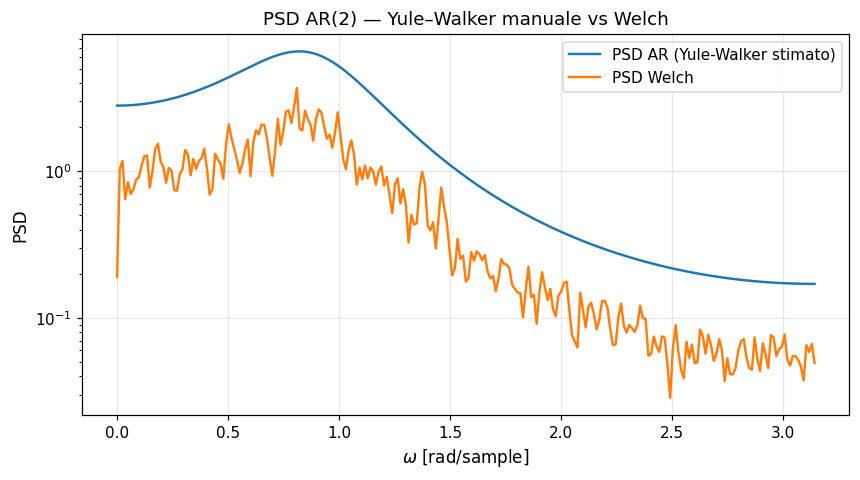

In [53]:
# Yule-Walker manuale (con scipy.linalg.solve_toeplitz) vs scipy.linalg.solve generico
def yule_walker_manual(r, p):
    R = linalg.toeplitz(r[:p])
    r_plus = r[1:p+1]
    a = linalg.solve(R, r_plus)          # a = R^{-1} r_+
    sigma2 = r[0] - a @ r_plus
    return -a, sigma2                    # convenzione AR: x[n] + Σ a_k x[n-k] = w[n]

# Generiamo un AR(2) noto: x[n] = 0.9 x[n-1] - 0.5 x[n-2] + w[n]
true_a = np.array([1, -0.9, 0.5])
true_sig2 = 1.0
N = 4000
rng = np.random.default_rng(7)
w = rng.standard_normal(N)
x = signal.lfilter([1], true_a, w)

# Stima dell'autocorrelazione biased
lags = np.arange(0, 20)
r_hat = np.array([np.sum(x[L:] * x[:N-L])/N for L in lags])

# Yule-Walker manuale
a_yw, sig2_yw = yule_walker_manual(r_hat, p=2)
print("a stimato (Yule-Walker manuale):", a_yw, "  σ²_w stimato:", sig2_yw)

# PSD AR teorica vs Welch
w_grid = np.linspace(0, np.pi, 1024)
A = 1.0 + a_yw[0]*np.exp(-1j*w_grid) + a_yw[1]*np.exp(-1j*2*w_grid)
S_AR = sig2_yw / np.abs(A)**2

f_w, P_w = signal.welch(x, fs=2*np.pi, nperseg=512, noverlap=256, window="hann",
                       return_onesided=True, scaling="density")
fig, ax = plt.subplots()
ax.semilogy(w_grid, S_AR, label="PSD AR (Yule-Walker stimato)")
ax.semilogy(f_w, P_w, label="PSD Welch")
ax.set_xlabel(r"$\omega$ [rad/sample]"); ax.set_ylabel("PSD")
ax.set_title("PSD AR(2) — Yule–Walker manuale vs Welch")
ax.legend(); plt.show()


## 7.6 Rumore bianco, rosa e colorato

* **Bianco**: PSD costante. $r_X[\ell] = \sigma^2\delta[\ell]$. Realistico solo
  come idealizzazione.
* **Rosa (1/f)**: PSD $\propto 1/f$. Comune in elettronica, biologia, EEG di
  fondo.
* **Rosso/Browniano**: PSD $\propto 1/f^2$ (integrale di bianco).
* **Colorato in genere**: ottenuto filtrando rumore bianco.


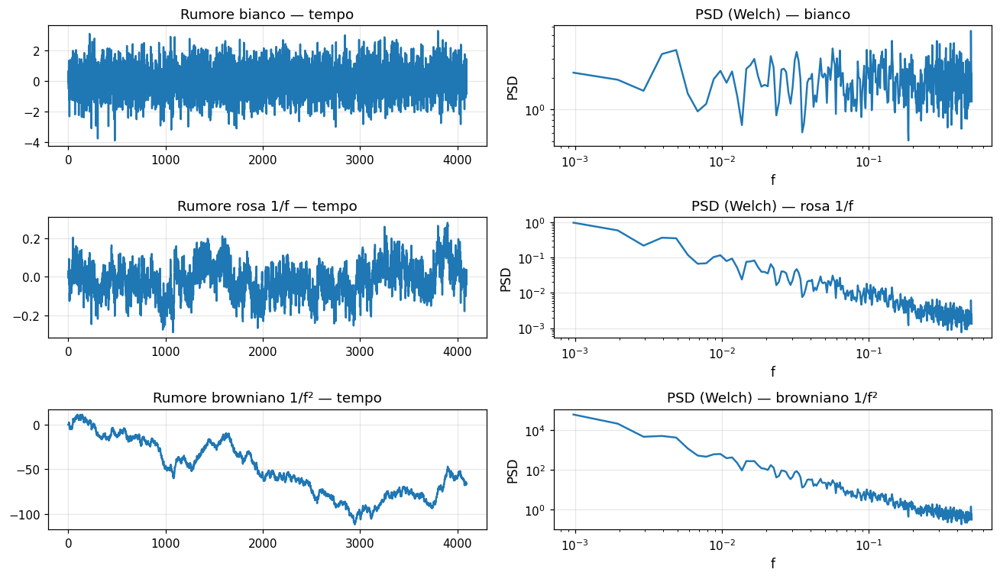

In [54]:
# Realizzazioni di rumore bianco, rosa e browniano + PSD stimate
N = 4096; fs = 1.0
rng = np.random.default_rng(0)
white = rng.standard_normal(N)
# rosa: integrazione frazionaria approssimata
def pink_filter(white):
    b = [0.049922035, -0.095993537, 0.050612699, -0.004408786]
    a = [1, -2.494956002, 2.017265875, -0.522189400]
    return signal.lfilter(b, a, white)
pink = pink_filter(white)
brown = np.cumsum(white)

fig, axes = plt.subplots(3, 2, figsize=(12, 7))
for i, (sig, name) in enumerate([(white, "bianco"), (pink, "rosa 1/f"), (brown, "browniano 1/f²")]):
    axes[i,0].plot(sig); axes[i,0].set_title(f"Rumore {name} — tempo")
    f, P = signal.welch(sig, fs=fs, nperseg=1024)
    axes[i,1].loglog(f[1:], P[1:]); axes[i,1].set_title(f"PSD (Welch) — {name}")
    axes[i,1].set_xlabel("f"); axes[i,1].set_ylabel("PSD")
plt.tight_layout(); plt.show()


## Must remember — Capitolo 7

1. **Processo stocastico** = famiglia di v.a.; statistiche di ensemble vs
   statistiche temporali.
2. **WSS**: media costante, autocorrelazione dipendente solo dal lag.
3. **Wiener–Khinchin**: PSD = DTFT dell'autocorrelazione (reale, non negativa).
4. **Periodogramma** è rumoroso; **Welch** lo media su segmenti per ridurre
   varianza.
5. **AR via Yule–Walker**: ottimo per spettri con picchi.

## Esercizi capitolo 7

1. Simulare 1000 realizzazioni di lunghezza 500 di un AR(1) con $a=0.95$ e
   stimare la media di ensemble in $n=499$; confrontarla con la media
   teorica (0).
2. Per lo stesso AR(1), confrontare $r_x[\ell]$ stimato con la formula
   teorica $\sigma_w^2 a^{|\ell|}/(1-a^2)$.
3. Implementare Welch manualmente con `np.fft.fft` su segmenti Hann.
4. Risolvere Yule–Walker AR(2) per dati con $a_1=0.7,\ a_2=-0.2$.


# Capitolo 8 — Processi non stazionari, STFT, spettrogramma e wavelet

I segnali biomedici reali non sono stazionari: i ritmi EEG cambiano con lo
stato, l'EMG passa da quiete ad attivazione, l'ECG ha aritmie. La Fourier
globale fornisce una "media di tutto il tempo" e perde la localizzazione
temporale degli eventi. In questo capitolo introduciamo gli strumenti
tempo-frequenza: STFT, spettrogramma, wavelet.


## 8.1 Perché Fourier globale fallisce sui segnali non stazionari

Considera un *chirp*: una sinusoide la cui frequenza istantanea cresce
linearmente nel tempo. La sua FFT mostra energia spalmata su una banda larga,
ma non ci dice **quando** ciascuna frequenza era presente.


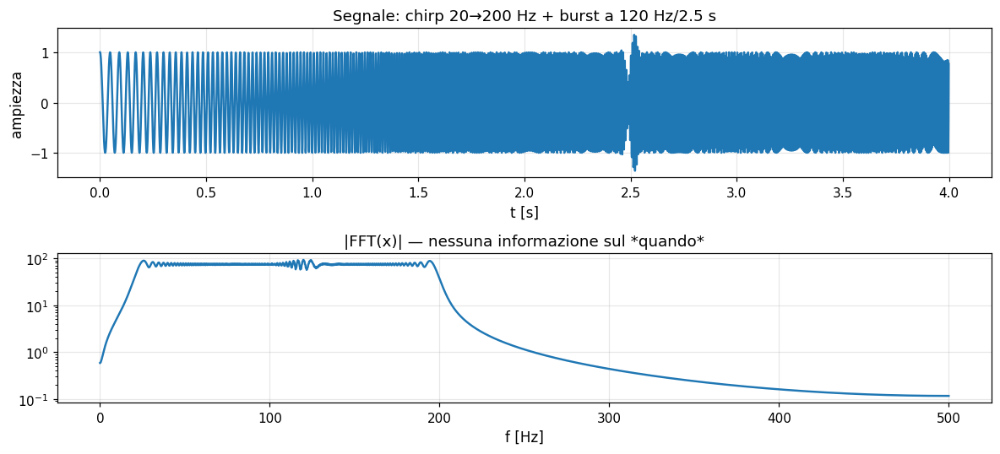

In [55]:
# Chirp + burst transitorio: Fourier globale "vede" solo un mix
fs = 1000.0
t = np.arange(0, 4.0, 1/fs)
chirp = signal.chirp(t, f0=20, t1=t[-1], f1=200, method="linear")
burst = np.exp(-((t-2.5)**2)/(2*0.02**2)) * np.cos(2*np.pi*120*t)
x = chirp + 0.7*burst

X = np.fft.rfft(x); f = np.fft.rfftfreq(len(x), 1/fs)

fig, axes = plt.subplots(2, 1, figsize=(11, 5))
axes[0].plot(t, x); axes[0].set_title("Segnale: chirp 20→200 Hz + burst a 120 Hz/2.5 s")
axes[0].set_xlabel("t [s]"); axes[0].set_ylabel("ampiezza")
axes[1].semilogy(f, np.abs(X))
axes[1].set_title("|FFT(x)| — nessuna informazione sul *quando*")
axes[1].set_xlabel("f [Hz]")
plt.tight_layout(); plt.show()


## 8.2 Short-Time Fourier Transform (STFT) e spettrogramma

**Idea.** Applichiamo Fourier a finestre **locali** del segnale:
$$
X(\tau, \omega) \;=\; \sum_{n} x[n]\,w[n-\tau]\,e^{-j\omega n}.
$$

**Spettrogramma**: $|X(\tau, \omega)|^2$ ⇒ mappa tempo-frequenza.

**Trade-off tempo-frequenza.** Una finestra **corta** dà buona localizzazione
nel tempo ma scarsa risoluzione in frequenza, e viceversa. Vale la disuguaglianza
$\Delta t \cdot \Delta f \ge 1/(4\pi)$ (principio di indeterminazione tempo-
frequenza, formulazione di Gabor).

**Derivazione intuitiva.** La varianza temporale di una finestra $w$ è
$\Delta t = \sqrt{\int (t-t_0)^2 |w|^2 dt}$ e la sua varianza in frequenza
$\Delta f$ è analoga sullo spettro $W$. Per Cauchy-Schwarz applicata a
$\langle t w, w'\rangle$ si dimostra $\Delta t\cdot \Delta f\ge 1/(4\pi)$, con
uguaglianza per gaussiane.


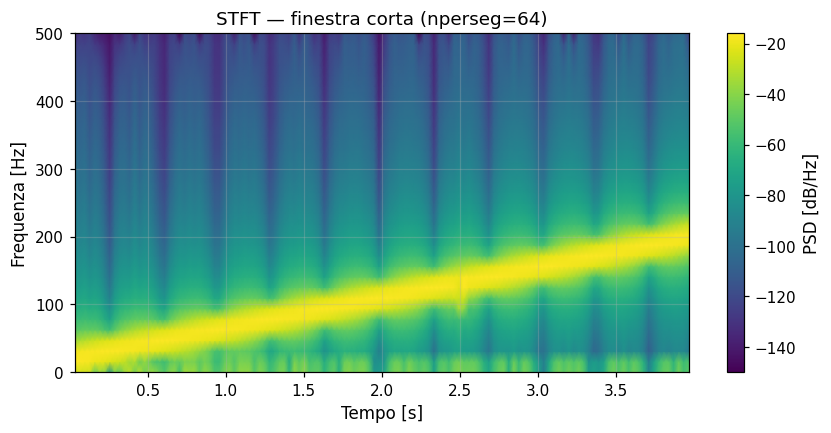

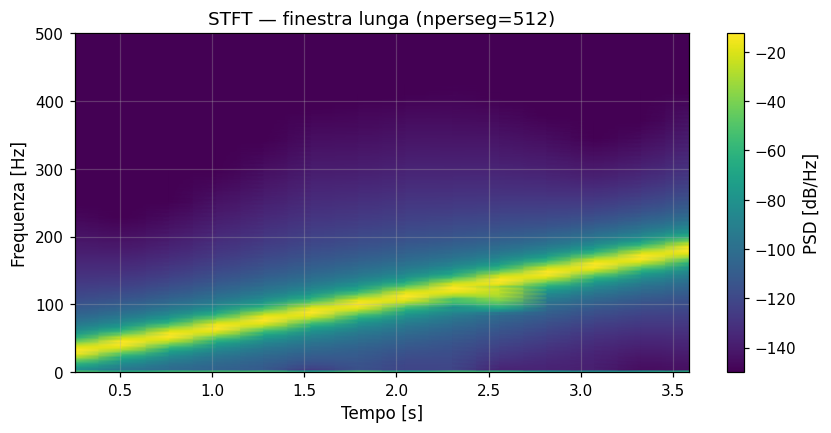

In [56]:
# Confronto STFT con finestra corta vs lunga
ax_short, _ = plot_spectrogram(x, fs=fs, nperseg=64,  title="STFT — finestra corta (nperseg=64)")
plt.show()
ax_long,  _ = plot_spectrogram(x, fs=fs, nperseg=512, title="STFT — finestra lunga (nperseg=512)")
plt.show()


## 8.3 Trasformata wavelet (idea)

**Idea.** Invece di una finestra di larghezza fissa, la trasformata wavelet usa
una famiglia di funzioni $\psi_{a,b}(t) = \tfrac{1}{\sqrt a}\psi\big((t-b)/a\big)$
con scala $a$ e traslazione $b$. Scala piccola ⇒ finestra stretta (alta
risoluzione temporale, alta frequenza); scala grande ⇒ finestra larga (bassa
frequenza, bassa risoluzione temporale).

**Continuous Wavelet Transform (CWT)**:
$$
W_x(a, b) = \int x(t)\,\psi^*_{a,b}(t)\,dt.
$$

**Discrete Wavelet Transform (DWT)**: $a = 2^j$, $b = k 2^j$. Implementazione
via banco di filtri (Mallat).

**Quando preferire la wavelet alla STFT.** Quando il segnale contiene fenomeni
multi-scala (rapidi e lenti contemporaneamente), tipici in EEG, ECG con eventi
transitori, MEG.


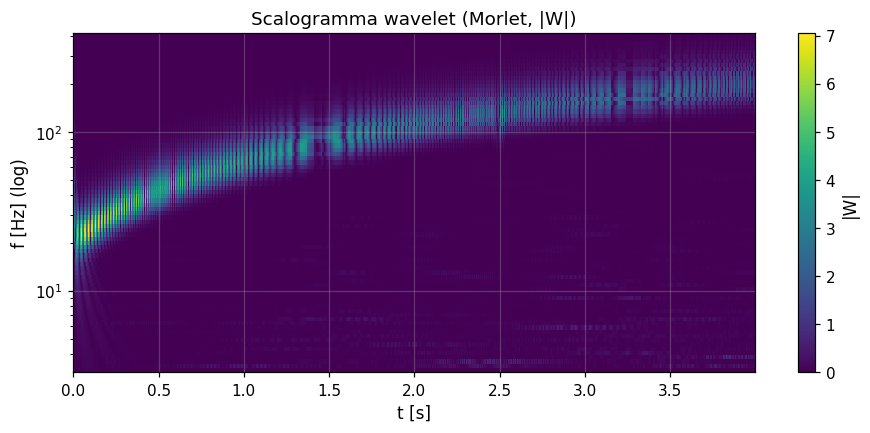

In [57]:
# Wavelet via PyWavelets se disponibile; altrimenti fallback con STFT a finestra adattiva
if HAS_PYWT:
    # CWT con Morlet
    scales = np.geomspace(2, 256, 80)
    coef, freqs = pywt.cwt(x, scales, "morl", sampling_period=1/fs)
    fig, ax = plt.subplots(figsize=(10, 4))
    pcm = ax.pcolormesh(t, freqs, np.abs(coef), shading="auto", cmap="viridis")
    ax.set_yscale("log"); ax.set_ylabel("f [Hz] (log)")
    ax.set_xlabel("t [s]")
    ax.set_title("Scalogramma wavelet (Morlet, |W|)")
    plt.gcf().colorbar(pcm, ax=ax, label="|W|"); plt.show()
else:
    print("PyWavelets non disponibile: mostro un fallback con STFT a finestra crescente")
    fig, axes = plt.subplots(1, 3, figsize=(13, 3.6))
    for ax, nperseg in zip(axes, [64, 128, 256]):
        f_s, t_s, Sxx = signal.spectrogram(x, fs=fs, nperseg=nperseg, noverlap=nperseg//2)
        ax.pcolormesh(t_s, f_s, 10*np.log10(np.maximum(Sxx, 1e-12)),
                      shading="gouraud", cmap="viridis")
        ax.set_title(f"STFT nperseg={nperseg}")
        ax.set_xlabel("t [s]"); ax.set_ylabel("f [Hz]")
    plt.tight_layout(); plt.show()


## 8.4 EEG sintetico con evento: visualizzazione tempo-frequenza


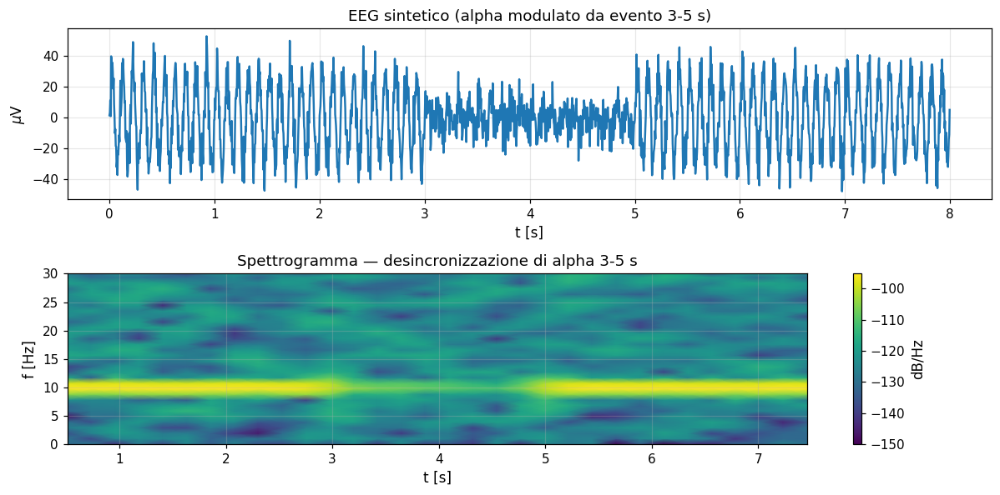

In [58]:
# EEG sintetico: alpha di fondo che si "spegne" durante un evento (desincronizzazione)
fs = 250.0; t = np.arange(0, 8, 1/fs)
rng = np.random.default_rng(2)
alpha = 30e-6*np.sin(2*np.pi*10*t)
# Modulazione: durante t in [3, 5] s la banda alpha si riduce
mod = 1.0 - 0.8*((t > 3) & (t < 5))
eeg = alpha*mod + 8e-6*rng.standard_normal(len(t))

fig, axes = plt.subplots(2, 1, figsize=(11, 5.5))
axes[0].plot(t, eeg*1e6); axes[0].set_title("EEG sintetico (alpha modulato da evento 3-5 s)")
axes[0].set_xlabel("t [s]"); axes[0].set_ylabel(r"$\mu$V")

f_s, t_s, Sxx = signal.spectrogram(eeg, fs=fs, nperseg=256, noverlap=200, window="hann")
pcm = axes[1].pcolormesh(t_s, f_s, 10*np.log10(np.maximum(Sxx, 1e-15)),
                         shading="gouraud", cmap="viridis")
axes[1].set_ylim(0, 30); axes[1].set_xlabel("t [s]"); axes[1].set_ylabel("f [Hz]")
axes[1].set_title("Spettrogramma — desincronizzazione di alpha 3-5 s")
plt.colorbar(pcm, ax=axes[1], label="dB/Hz")
plt.tight_layout(); plt.show()


## Must remember — Capitolo 8

1. La FFT globale "media" tutto il tempo e non vede *quando* succedono le cose.
2. La **STFT** scambia tempo per frequenza: finestra corta = vedi eventi rapidi,
   finestra lunga = vedi frequenze precise.
3. Il prodotto $\Delta t\Delta f \ge 1/(4\pi)$ è un limite fisico, non aggirabile.
4. La **wavelet** dà risoluzione "logaritmica" in frequenza: alta nel tempo per
   alte frequenze, alta in frequenza per basse frequenze.

## Esercizi capitolo 8

1. Generare un chirp da 1 a 50 Hz su 10 s a $F_s=200$ Hz e visualizzarne la
   STFT con due `nperseg` (64 e 512), commentando i trade-off.
2. Aggiungere un burst transitorio di 50 ms a 80 Hz e mostrare come la STFT
   con finestra lunga lo "spalmi".
3. (Se PyWavelets è installato) Calcolare la CWT con `morl` e confrontarla con
   STFT.


# Capitolo 8 (esteso) — Wavelet, multi-resolution analysis e PyWavelets

Questo è un **approfondimento dedicato** alle wavelet. Lo presentiamo in
parallelo a STFT/spettrogramma del Capitolo 8 originale, e in parallelo a
DFT/FFT, perché è un terzo strumento di analisi tempo-frequenza con proprietà
matematiche e pratiche profondamente diverse. Lavoriamo passo per passo,
dalle motivazioni storiche fino a un esempio completo di **denoising wavelet
di un ECG**.

Pre-requisiti del Capitolo 8 originale (STFT, spettrogramma, principio di
indeterminazione tempo-frequenza). Tutto il resto è ricostruito da zero.

**Indice della sezione**

* 8E.1  Perché servono le wavelet
* 8E.2  La "wavelet madre" e la famiglia di traslazioni/scale
* 8E.3  Esempi di wavelet madre (galleria con grafici)
* 8E.4  Continuous Wavelet Transform (CWT) e scalogramma
* 8E.5  CWT con PyWavelets passo passo
* 8E.6  Multi-Resolution Analysis (MRA): l'idea di Mallat
* 8E.7  Banco di filtri: implementazione esplicita di un livello DWT
* 8E.8  Discrete Wavelet Transform (DWT) multilivello con PyWavelets
* 8E.9  Ricostruzione del segnale (inversa DWT)
* 8E.10 Denoising wavelet: thresholding hard e soft
* 8E.11 Wavelet Packet Decomposition (WPD)
* 8E.12 Confronto sistematico STFT vs CWT vs DWT
* 8E.13 Caso di studio: denoising di un ECG sintetico
* 8E.14 Errori comuni e *Must remember*


## 8E.1 Perché servono le wavelet

Riprendiamo il problema chiave: i segnali biomedici reali sono **non
stazionari**, contengono fenomeni a scale temporali molto diverse
(secondi per la respirazione, centesimi di secondo per il QRS, millisecondi
per uno spike neuronale), e una sola scala di osservazione non basta.

**Limite della STFT.** La finestra ha **larghezza fissa**: piccola per
risolvere eventi rapidi, grande per risolvere frequenze precise. Una volta
scelta, vale ovunque. Ma per un segnale che contiene **sia** oscillazioni
lente **sia** picchi rapidi, non esiste una finestra fissa "ottima".

**Idea della wavelet.** Usare una **famiglia di finestre adattive**: per le
**alte frequenze**, finestre **corte** (alta risoluzione temporale);
per le **basse frequenze**, finestre **lunghe** (alta risoluzione in
frequenza). La risoluzione in tempo e frequenza varia con la scala in modo
naturale, "logaritmico". È esattamente come funziona la percezione visiva
(dettagli fini a piccola scala, contesto grande a grande scala).

**Conseguenza.** Le wavelet rispettano comunque il principio di
indeterminazione $\Delta t\cdot\Delta f \ge 1/(4\pi)$ in ogni punto, ma
spostano dinamicamente "il prodotto" alla scala più adatta.


## 8E.2 La "wavelet madre" $\psi$ e la famiglia $\psi_{a,b}$

**Definizione (wavelet madre).** Una funzione $\psi: \mathbb{R}\to\mathbb{R}$
(o $\mathbb{C}$) si dice **wavelet madre** se:

1. ha **media nulla**: $\int_{\mathbb{R}}\psi(t)\,dt = 0$ (la "wave" oscilla);
2. ha **energia finita**: $\int_{\mathbb{R}}|\psi(t)|^2\,dt < \infty$
   (la "wavelet" è localizzata).

In genere si chiede anche la **condizione di ammissibilità**
$C_\psi = \int_{0}^{\infty}\frac{|\hat\psi(\omega)|^2}{\omega}\,d\omega < \infty$,
che garantisce l'inversione della CWT.

**Famiglia di traslazioni e dilatazioni.** Dalla wavelet madre $\psi$
generiamo una **famiglia continua** parametrizzata da scala $a>0$ e
traslazione $b\in\mathbb{R}$:
$$
\psi_{a,b}(t) \;=\; \frac{1}{\sqrt{a}}\,\psi\!\left(\frac{t-b}{a}\right).
$$
Il fattore $1/\sqrt{a}$ normalizza l'energia: $\int |\psi_{a,b}|^2\,dt =
\int|\psi|^2\,dt$ per ogni $(a,b)$.

**Significato dei parametri.**

* $a$ piccolo ⇒ wavelet **stretta** nel tempo ⇒ alta frequenza.
* $a$ grande ⇒ wavelet **larga** nel tempo ⇒ bassa frequenza.
* $b$ ⇒ trasla la wavelet sull'asse temporale.


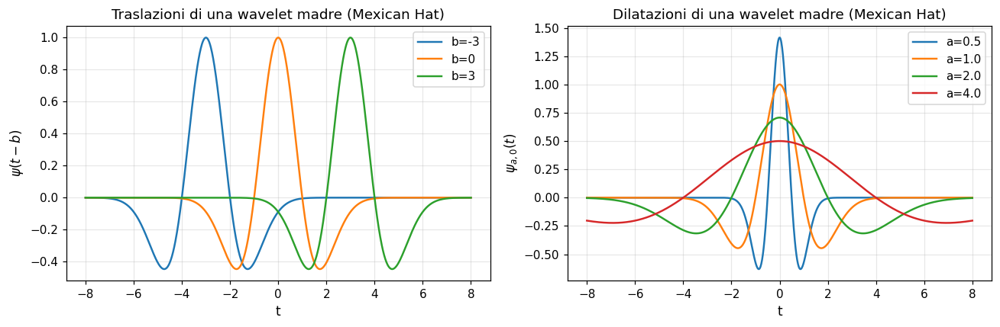

In [59]:
# Visualizziamo come varia psi_{a,b} per una stessa wavelet madre (Mexican Hat = Ricker)
def mexican_hat(t):
    # ψ(t) = (1 - t²) e^{-t²/2} (a meno di normalizzazione)
    return (1 - t**2)*np.exp(-t**2/2)

t = np.linspace(-8, 8, 1000)
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# 1) stessa scala, traslazioni diverse
for b in [-3, 0, 3]:
    axes[0].plot(t, mexican_hat(t - b), label=f"b={b}")
axes[0].set_title("Traslazioni di una wavelet madre (Mexican Hat)")
axes[0].set_xlabel("t"); axes[0].set_ylabel(r"$\psi(t-b)$"); axes[0].legend()

# 2) stessa traslazione, scale diverse
for a in [0.5, 1.0, 2.0, 4.0]:
    axes[1].plot(t, 1/np.sqrt(a)*mexican_hat(t/a), label=f"a={a}")
axes[1].set_title("Dilatazioni di una wavelet madre (Mexican Hat)")
axes[1].set_xlabel("t"); axes[1].set_ylabel(r"$\psi_{a,0}(t)$"); axes[1].legend()
plt.tight_layout(); plt.show()


## 8E.3 Galleria delle wavelet madre più usate

Le wavelet si dividono in due grandi famiglie:

* **wavelet continue** (per la CWT): Morlet, Mexican Hat, Gaussiane, Shannon…
  hanno forma analitica chiusa.
* **wavelet discrete** (per la DWT): Haar, Daubechies (`db`), Symlets (`sym`),
  Coiflets (`coif`), Biortogonali (`bior`/`rbio`)…
  sono definite tramite **banchi di filtri** (non hanno tutte forma chiusa
  semplice; si "calcolano" iterando l'algoritmo a cascata).

Vediamo una galleria con PyWavelets — `pywt.Wavelet(...)` per la DWT,
`pywt.ContinuousWavelet(...)` per la CWT. Se PyWavelets non è installato,
mostriamo solo Haar, Mexican Hat e Morlet a mano.


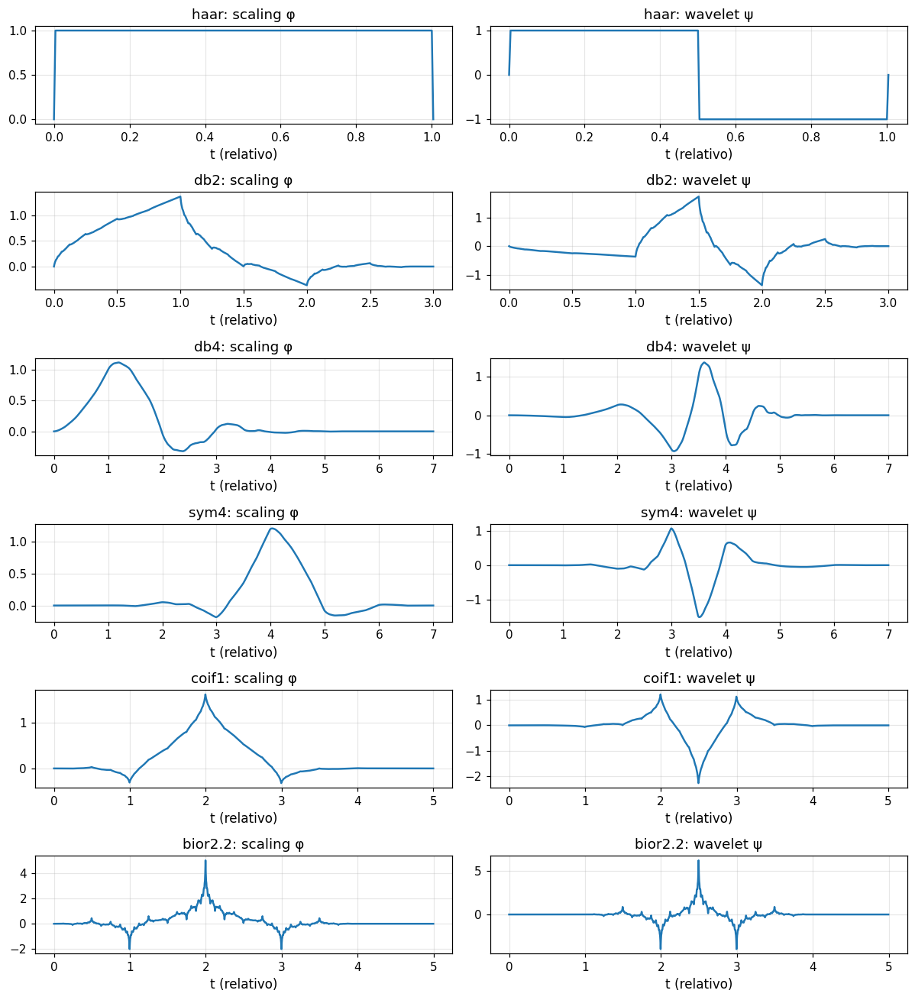

In [60]:
# Galleria di wavelet discrete (DWT): mostriamo phi (scaling, "approssimazione")
# e psi (wavelet, "dettaglio") per Haar, db2, db4, sym4, coif1, bior2.2
families_discrete = ["haar", "db2", "db4", "sym4", "coif1", "bior2.2"]

if HAS_PYWT:
    fig, axes = plt.subplots(len(families_discrete), 2,
                             figsize=(11, 2.0*len(families_discrete)))
    for i, name in enumerate(families_discrete):
        w = pywt.Wavelet(name)
        # wavefun: ritorna (phi, psi, x) per ortogonali; (phi_d, psi_d, phi_r, psi_r, x) per biortogonali
        out = w.wavefun(level=8)
        if w.orthogonal:
            phi, psi, x = out
        else:
            # biortogonali: usiamo decomposizione
            phi_d, psi_d, phi_r, psi_r, x = out
            phi, psi = phi_d, psi_d
        axes[i,0].plot(x, phi); axes[i,0].set_title(f"{name}: scaling φ")
        axes[i,1].plot(x, psi); axes[i,1].set_title(f"{name}: wavelet ψ")
        for ax in axes[i]: ax.set_xlabel("t (relativo)")
    fig.tight_layout(); plt.show()
else:
    print("PyWavelets non disponibile: salto la galleria DWT.")


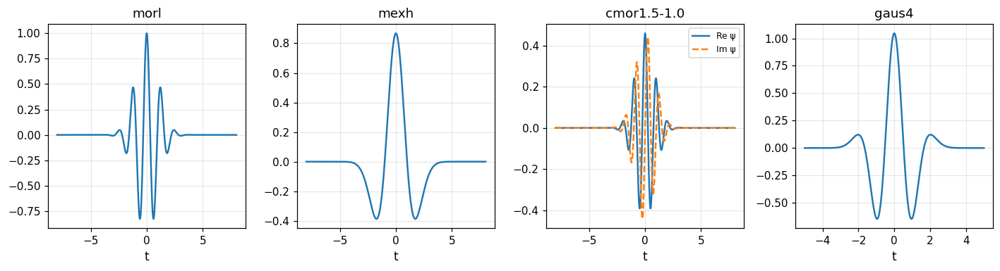

In [61]:
# Galleria di wavelet continue (CWT): mostriamo psi(t) per Morlet, Mexican Hat,
# Complex Morlet, Gaussiana di ordine 4 (gaus4)
if HAS_PYWT:
    cont_families = ["morl", "mexh", "cmor1.5-1.0", "gaus4"]
    fig, axes = plt.subplots(1, len(cont_families), figsize=(13, 3.6))
    for ax, name in zip(axes, cont_families):
        try:
            psi, x = pywt.ContinuousWavelet(name).wavefun(level=10)
        except Exception:
            ax.set_visible(False); continue
        if np.iscomplexobj(psi):
            ax.plot(x, psi.real, label="Re ψ")
            ax.plot(x, psi.imag, "--", label="Im ψ")
        else:
            ax.plot(x, psi)
        ax.set_title(name); ax.set_xlabel("t")
        if np.iscomplexobj(psi): ax.legend(fontsize=8)
    fig.tight_layout(); plt.show()
else:
    print("PyWavelets non disponibile: mostro solo Mexican Hat e Morlet a mano.")
    t = np.linspace(-6, 6, 600)
    mex = (1 - t**2)*np.exp(-t**2/2)
    f0 = 0.849
    morl = np.cos(2*np.pi*f0*t)*np.exp(-t**2/2)
    fig, axes = plt.subplots(1, 2, figsize=(11, 3.6))
    axes[0].plot(t, mex);  axes[0].set_title("Mexican Hat (Ricker)"); axes[0].set_xlabel("t")
    axes[1].plot(t, morl); axes[1].set_title("Morlet (reale, semplificata)"); axes[1].set_xlabel("t")
    plt.tight_layout(); plt.show()


**Come si legge la galleria.**

* La **scaling function** $\phi$ è l'analogo della "media locale": cattura il
  contenuto a basse frequenze.
* La **wavelet function** $\psi$ è l'analogo del "dettaglio": cattura le
  oscillazioni.
* Wavelet con più "ondulazioni" (es. `db8`) hanno più momenti nulli
  $\int t^k\psi\,dt = 0$ ⇒ migliore localizzazione in frequenza, peggiore
  nel tempo.
* Wavelet **biortogonali** (`bior2.2`) hanno simmetria ⇒ utili per le immagini.


## 8E.4 Continuous Wavelet Transform (CWT)

**Definizione.** Per un segnale $x(t)$ a energia finita:
$$
W_x(a, b) \;=\; \int_{-\infty}^{+\infty} x(t)\,\psi^*_{a,b}(t)\,dt
\;=\; \frac{1}{\sqrt{a}}\int x(t)\,\psi^*\!\left(\frac{t-b}{a}\right)\,dt.
$$
È un **prodotto interno** del segnale con ogni $\psi_{a,b}$: la stessa idea
di Fourier ("misurare quanto è presente questa base"), ma con basi
**localizzate** in tempo e in scala.

**Inversione.** Se $\psi$ è ammissibile ($C_\psi < \infty$):
$$
x(t) \;=\; \frac{1}{C_\psi}\int_0^{\infty}\!\!\int_{-\infty}^{+\infty}
W_x(a,b)\,\psi_{a,b}(t)\,\frac{da\,db}{a^2}.
$$

**Scalogramma.** $|W_x(a,b)|^2$ è la **densità di energia** del segnale nel
piano scala-tempo. Si visualizza come un'immagine 2D
(scala/frequenza sull'asse y, tempo sull'asse x).

**Frequenza pseudo-equivalente.** Per molte wavelet (Morlet, gaussiane) esiste
una corrispondenza approssimata fra scala e frequenza:
$$
f \;\approx\; \frac{f_c}{a\,T_s},
$$
dove $f_c$ è la **frequenza centrale** della wavelet madre. PyWavelets la
fornisce con `pywt.central_frequency(name)`.


## 8E.5 CWT con PyWavelets: passo passo

La funzione chiave di PyWavelets per la CWT è:

```python
coef, freqs = pywt.cwt(data, scales, wavelet, sampling_period=...)
```

* `data`: la sequenza temporale `x[n]`.
* `scales`: array di scale $a$ (numero reali $>0$). Tipicamente si usano
  scale **geometriche** (crescita esponenziale) per coprire bene molte
  ottave.
* `wavelet`: nome (`"morl"`, `"mexh"`, `"cmor1.5-1.0"`, `"gaus4"`, …).
* `sampling_period`: $T_s = 1/F_s$. Permette a PyWavelets di restituire
  `freqs` in Hz invece che in scale astratte.

`coef` è una matrice di forma `(len(scales), len(x))`; ogni riga è il
prodotto interno fra $x$ e la wavelet a quella scala, in funzione del tempo.

**Costruzione delle scale.** Per coprire una banda da $f_\min$ a $f_\max$:
$$
a \;=\; \frac{f_c}{f\,T_s},\qquad f\in[f_\min, f_\max].
$$
Tipicamente prendiamo `scales = fc/(freqs*Ts)` con `freqs = np.geomspace(...)`.


Frequenza centrale di 'morl' : fc = 0.8125


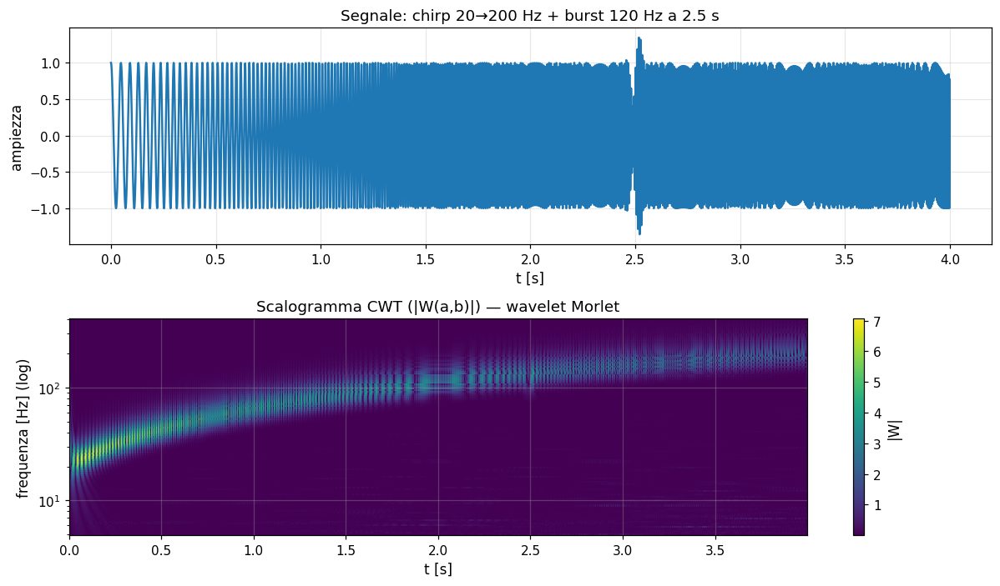

In [62]:
# CWT con PyWavelets su un segnale didattico: chirp + burst transitorio
fs = 1000.0
t = np.arange(0, 4.0, 1/fs)
chirp = signal.chirp(t, f0=20, t1=t[-1], f1=200, method="linear")
burst = np.exp(-((t-2.5)**2)/(2*0.02**2)) * np.cos(2*np.pi*120*t)
x = chirp + 0.7*burst

if HAS_PYWT:
    wavelet_name = "morl"            # Morlet reale, ottima per visualizzazione tempo-frequenza
    fc = pywt.central_frequency(wavelet_name)
    print(f"Frequenza centrale di '{wavelet_name}' : fc = {fc:.4f}")
    # Costruiamo scale che corrispondono a frequenze 5..400 Hz
    freqs_target = np.geomspace(5, 400, 120)
    scales = fc/(freqs_target*(1/fs))
    coef, freqs = pywt.cwt(x, scales, wavelet_name, sampling_period=1/fs)

    fig, axes = plt.subplots(2, 1, figsize=(11, 6.5))
    axes[0].plot(t, x); axes[0].set_title("Segnale: chirp 20→200 Hz + burst 120 Hz a 2.5 s")
    axes[0].set_xlabel("t [s]"); axes[0].set_ylabel("ampiezza")
    pcm = axes[1].pcolormesh(t, freqs, np.abs(coef), shading="auto", cmap="viridis")
    axes[1].set_yscale("log"); axes[1].set_ylabel("frequenza [Hz] (log)")
    axes[1].set_xlabel("t [s]")
    axes[1].set_title("Scalogramma CWT (|W(a,b)|) — wavelet Morlet")
    plt.gcf().colorbar(pcm, ax=axes[1], label="|W|"); plt.tight_layout(); plt.show()
else:
    print("PyWavelets non disponibile: salto la CWT.")


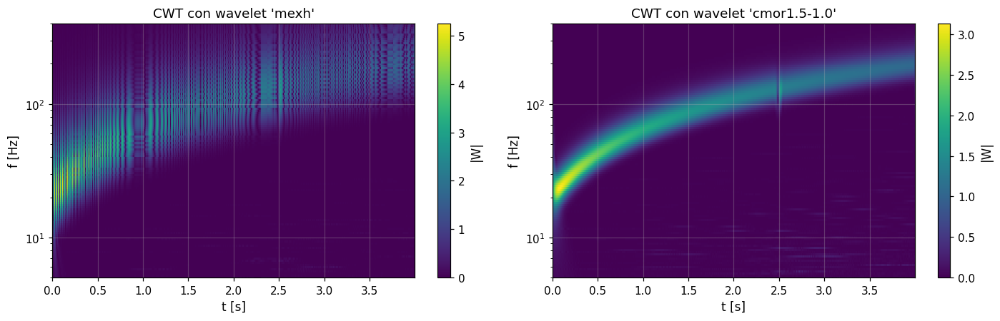

In [63]:
# Stesso segnale, due wavelet diverse: Mexican Hat vs Morlet complessa
if HAS_PYWT:
    freqs_target = np.geomspace(5, 400, 120)
    fig, axes = plt.subplots(1, 2, figsize=(13, 4.2))
    for ax, name in zip(axes, ["mexh", "cmor1.5-1.0"]):
        fc = pywt.central_frequency(name)
        scales = fc/(freqs_target*(1/fs))
        coef, freqs = pywt.cwt(x, scales, name, sampling_period=1/fs)
        pcm = ax.pcolormesh(t, freqs, np.abs(coef), shading="auto", cmap="viridis")
        ax.set_yscale("log"); ax.set_ylim(5, 400)
        ax.set_xlabel("t [s]"); ax.set_ylabel("f [Hz]")
        ax.set_title(f"CWT con wavelet '{name}'")
        plt.gcf().colorbar(pcm, ax=ax, label="|W|")
    plt.tight_layout(); plt.show()


**Cosa osservare nello scalogramma.**

* Il chirp lineare $20\to 200$ Hz appare come una **traccia diagonale** che
  attraversa il piano tempo-frequenza.
* Il burst a $120$ Hz/$2.5$ s appare come una **macchia compatta** centrata
  nel punto giusto.
* La Mexican Hat ha buona localizzazione temporale ma scarsa selettività
  in frequenza; la Morlet complessa è ottima per individuare oscillazioni.


## 8E.6 Multi-Resolution Analysis (MRA) — l'idea di Mallat

**Idea.** Decomporre lo spazio dei segnali $L^2(\mathbb{R})$ in una **scala
gerarchica** di sottospazi $\{V_j\}_{j\in\mathbb{Z}}$ con

$$
V_{j+1} \subset V_j,\qquad \bigcap_j V_j = \{0\},\qquad
\overline{\bigcup_j V_j} = L^2(\mathbb{R}).
$$

Intuitivamente $V_j$ è lo spazio dei segnali "approssimati a scala $2^j$":
più $j$ cresce, più la scala è grossa (meno dettaglio). Si dimostra
(Daubechies, Mallat) che esiste una **funzione di scala** $\phi$ tale che
$\{2^{-j/2}\phi(2^{-j}t - k)\}_k$ è una base ortonormale di $V_j$.

**Spazio dei dettagli.** $V_{j-1} = V_j \oplus W_j$, dove $W_j$ è il
**complemento ortogonale** di $V_j$ in $V_{j-1}$. Le wavelet
$\{2^{-j/2}\psi(2^{-j}t - k)\}_k$ formano una base ortonormale di $W_j$.

**Decomposizione di un segnale.** Iterando:
$$
x \in V_0 = V_1 \oplus W_1 = V_2 \oplus W_2 \oplus W_1 = \cdots
= V_J \oplus W_J \oplus \cdots \oplus W_1.
$$
Quindi $x$ si scrive come somma di una **approssimazione "grossa"** in $V_J$
più $J$ livelli di **dettaglio** in $W_J, \dots, W_1$:
$$
x[n] \;=\; \underbrace{\sum_k c^J_k\,\phi^J_k[n]}_{\text{approssimazione } a^J}
\;+\;
\sum_{j=1}^J \underbrace{\sum_k d^j_k\,\psi^j_k[n]}_{\text{dettaglio } d^j}.
$$

**Risposta in frequenza dei sottospazi.** A scala $2^j$, il sottospazio $V_j$
copre **basse** frequenze, $W_j$ copre una **banda** centrata a circa
$f \approx F_s/2^{j+1}$. Più $j$ cresce, più la banda è bassa.

**Conseguenza.** La DWT divide il segnale in una **piramide di bande** che si
restringono ottava per ottava — molto naturale per i segnali biomedici, in
cui i ritmi vivono in bande logaritmiche (delta, theta, alpha, beta, gamma).


## 8E.7 Banco di filtri: implementazione esplicita di un livello DWT

La MRA si calcola in modo **algoritmico** con un banco di filtri **a due
canali** (Mallat 1989):

1. **Filtri** $h$ (passabasso, "low") e $g$ (passaalto, "high") associati alla
   wavelet scelta. Soddisfano la *quadrature mirror filter (QMF)*:
   $g[n] = (-1)^n\,h[L-1-n]$ (per wavelet ortogonali a lunghezza $L$).
2. Per ogni livello $j$:
   * filtra $x$ con $h$ → ottieni l'approssimazione `a` (basse frequenze),
   * filtra $x$ con $g$ → ottieni il dettaglio `d` (alte frequenze),
   * **decima** ogni uscita di un fattore 2 (downsampling).
3. La cascata si applica solo al ramo dell'approssimazione, ottenendo una
   piramide di scale.

**Schema visivo (un livello).**

```
x[n] ──► h ──► ↓2 ──► a1   (approssimazione, basse freq, lunghezza ~ N/2)
     └──► g ──► ↓2 ──► d1   (dettaglio,     alte freq,  lunghezza ~ N/2)
```

**Perché la decimazione di 2.** Dopo il filtraggio, la banda utile è la metà
di quella originale, quindi (per Nyquist) bastano la metà dei campioni.

Implementiamolo a mano, per il caso più semplice: la **wavelet di Haar**, con
$h = [1, 1]/\sqrt 2$ e $g = [1, -1]/\sqrt 2$.


In [64]:
# DWT manuale a un livello con Haar
def dwt_haar_one_level(x):
    # Filtri Haar
    h = np.array([ 1,  1])/np.sqrt(2)   # passabasso
    g = np.array([ 1, -1])/np.sqrt(2)   # passaalto

    # Filtraggio (convoluzione "full") + downsampling per 2
    a_full = np.convolve(x, h, mode="full")
    d_full = np.convolve(x, g, mode="full")
    # Convenzione PyWavelets: prendi i campioni nelle posizioni 1, 3, 5, ...
    a = a_full[1::2]
    d = d_full[1::2]
    return a, d

# Test su sequenza nota
x = np.array([4, 6, 10, 12, 8, 6, 5, 5], dtype=float)
a, d = dwt_haar_one_level(x)
print("x  =", x)
print("a1 =", np.round(a, 4))
print("d1 =", np.round(d, 4))

if HAS_PYWT:
    a_p, d_p = pywt.dwt(x, "haar")
    print("\nPyWavelets:")
    print("a1 =", np.round(a_p, 4))
    print("d1 =", np.round(d_p, 4))


x  = [ 4.  6. 10. 12.  8.  6.  5.  5.]
a1 = [ 7.0711 15.5563  9.8995  7.0711]
d1 = [ 1.4142  1.4142 -1.4142  0.    ]

PyWavelets:
a1 = [ 7.0711 15.5563  9.8995  7.0711]
d1 = [-1.4142 -1.4142  1.4142  0.    ]


**Significato dei coefficienti Haar.** Con Haar:

* $a_k = (x_{2k}+x_{2k+1})/\sqrt 2$ — è la **media locale** di due campioni
  (a meno di $\sqrt 2$).
* $d_k = (x_{2k}-x_{2k+1})/\sqrt 2$ — è la **differenza locale**, sensibile
  ai salti rapidi.

Quindi la DWT di Haar a un livello è letteralmente "media e differenza".
Le altre wavelet (db, sym, coif…) generalizzano questa idea con filtri più
lunghi e più momenti nulli.


## 8E.8 DWT multilivello con PyWavelets

`pywt.wavedec(data, wavelet, level=J)` produce la decomposizione multilivello:
$$
\text{coeffs} = [a^J, d^J, d^{J-1}, \dots, d^1].
$$

* `a^J` è l'approssimazione al livello più alto (basse frequenze).
* `d^j` sono i dettagli al livello $j$ (banda passante via via più alta).

**Quanti livelli scegliere?** PyWavelets fornisce `pywt.dwt_max_level(N, w)`,
massimo numero di livelli compatibile con la lunghezza del segnale e la
lunghezza del filtro.

**Banda associata a ciascun livello.** Con $F_s$ frequenza di campionamento:

| livello $j$ | banda approssimativa |
|---|---|
| $d^1$ | $F_s/4$ – $F_s/2$ |
| $d^2$ | $F_s/8$ – $F_s/4$ |
| $d^3$ | $F_s/16$ – $F_s/8$ |
| … | … |
| $a^J$ | 0 – $F_s/2^{J+1}$ |

Esempio: $F_s = 256$ Hz e $J=5$ ⇒ $d^1$:64-128 Hz, $d^2$:32-64,
$d^3$:16-32, $d^4$:8-16, $d^5$:4-8, $a^5$:0-4. Sono **esattamente** le bande
EEG (gamma, beta, alpha, theta, delta).


DWT con 'db4', livelli J=6
  a6: lunghezza 22, std=3.35e-05
  d6: lunghezza 22, std=7.49e-06
  d5: lunghezza 38, std=1.17e-05
  d4: lunghezza 70, std=2.19e-05
  d3: lunghezza 134, std=1.3e-05
  d2: lunghezza 261, std=3.71e-06
  d1: lunghezza 515, std=3.25e-06


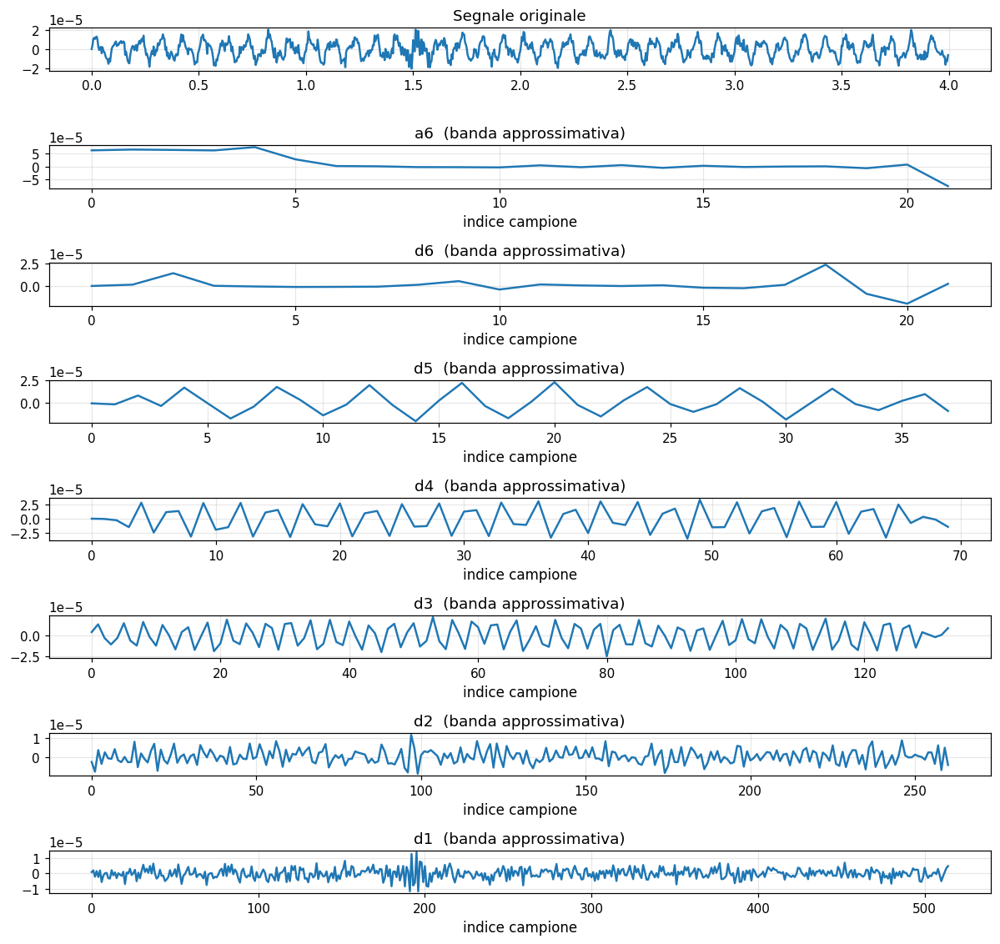

In [65]:
# DWT multilivello: piramide di coefficienti su un segnale biomedico-simile
if HAS_PYWT:
    fs = 256.0
    t = np.arange(0, 4, 1/fs)
    rng = np.random.default_rng(0)
    # mix di alpha 10 Hz + beta 22 Hz + transitorio 80 Hz + rumore
    x = (10e-6*np.sin(2*np.pi*10*t)
         + 5e-6*np.sin(2*np.pi*22*t)
         + 12e-6*np.exp(-((t-1.5)**2)/(2*0.05**2))*np.cos(2*np.pi*80*t)
         + 3e-6*rng.standard_normal(len(t)))

    w = "db4"
    max_lev = pywt.dwt_max_level(len(x), pywt.Wavelet(w).dec_len)
    J = min(6, max_lev)
    coeffs = pywt.wavedec(x, w, level=J)
    labels = [f"a{J}"] + [f"d{J-i}" for i in range(J)]
    print(f"DWT con '{w}', livelli J={J}")
    for lab, c in zip(labels, coeffs):
        print(f"  {lab}: lunghezza {len(c)}, std={np.std(c):.3g}")

    fig, axes = plt.subplots(len(coeffs)+1, 1, figsize=(11, 1.3*(len(coeffs)+1)), sharex=False)
    axes[0].plot(t, x); axes[0].set_title("Segnale originale")
    for ax, lab, c in zip(axes[1:], labels, coeffs):
        ax.plot(c); ax.set_title(f"{lab}  (banda approssimativa)")
        ax.set_xlabel("indice campione")
    plt.tight_layout(); plt.show()
else:
    print("PyWavelets non disponibile: salto la DWT multilivello.")


**Lettura della piramide.**

* `aJ` è una "versione liscia" del segnale: contiene solo il contenuto
  $<F_s/2^{J+1}$ Hz.
* `dJ, …, d1` sono via via più "fini": ogni livello descrive una banda
  un'ottava più alta.
* Un transitorio molto rapido (es. burst a 80 Hz nell'esempio) appare nei
  **dettagli ad alto livello** (`d1` o `d2`), come "macchia" localizzata.
* Un'oscillazione lenta (alpha, 10 Hz) appare nei **dettagli più bassi**
  (`d4` o `d5`).


## 8E.9 Ricostruzione (DWT inversa)

`pywt.waverec(coeffs, wavelet)` invertirebbe la decomposizione, rimettendo
insieme tutti i livelli. È **esatta** fino agli errori di troncamento numerico.

**Verifica.** Se non manipoliamo i coefficienti, $x_\text{rec} \approx x$.


In [66]:
# Verifichiamo la ricostruzione esatta
if HAS_PYWT:
    x_rec = pywt.waverec(coeffs, w)
    err = np.max(np.abs(x_rec[:len(x)] - x))
    print(f"Errore massimo di ricostruzione: {err:.2e}  (deve essere ~ 1e-15)")


Errore massimo di ricostruzione: 8.47e-21  (deve essere ~ 1e-15)


**Approssimazione progressiva.** Possiamo anche **azzerare** i
dettagli oltre un certo livello e ricostruire: otteniamo una versione
"a basse frequenze" sempre più liscia. Ottimo per visualizzare l'idea della
multi-risoluzione.


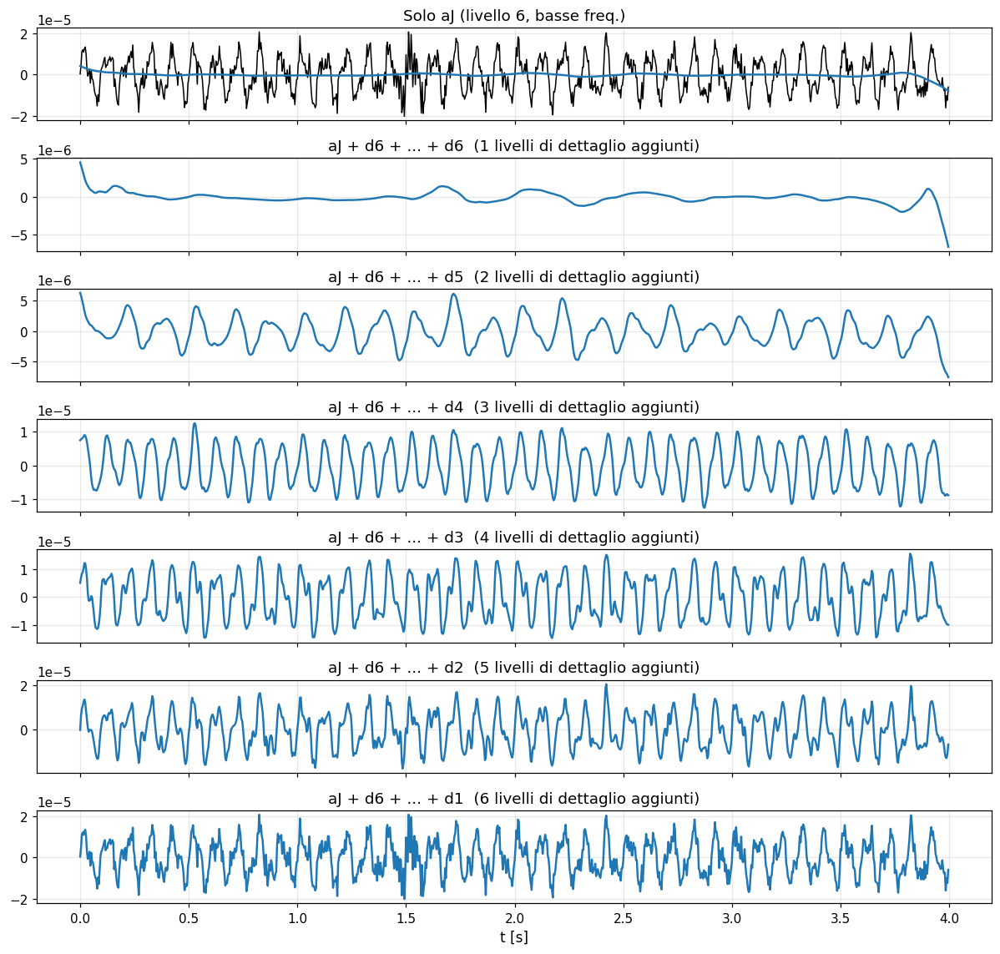

In [67]:
# Ricostruzione progressiva: a partire da approssimazione + ricostruzione livello per livello
if HAS_PYWT:
    fig, axes = plt.subplots(J+1, 1, figsize=(11, 1.5*(J+1)), sharex=True)
    axes[0].plot(t, x, "k", lw=1); axes[0].set_title("Segnale originale")
    # Partiamo dalla sola approssimazione: tutti i dettagli a zero
    for kept in range(0, J+1):
        masked = [coeffs[0]] + [c if i < kept else np.zeros_like(c)
                                for i, c in enumerate(coeffs[1:])]
        rec = pywt.waverec(masked, w)
        axes[kept].plot(t, rec[:len(t)])
        if kept == 0:
            axes[kept].set_title(f"Solo aJ (livello {J}, basse freq.)")
        else:
            axes[kept].set_title(f"aJ + d{J} + ... + d{J-kept+1}  ({kept} livelli di dettaglio aggiunti)")
    axes[-1].set_xlabel("t [s]")
    plt.tight_layout(); plt.show()


## 8E.10 Denoising wavelet: thresholding hard e soft

**Idea.** In una decomposizione wavelet, il segnale **utile** tende a
concentrarsi in **pochi** coefficienti grandi, mentre il **rumore bianco**
gaussiano si distribuisce **uniformemente** su tutti i coefficienti, con
ampiezza tipica $\sigma$. Quindi:

* **mantenere** i coefficienti grandi (informazione),
* **azzerare/comprimere** quelli piccoli (rumore).

**Hard thresholding**: $T_H(c) = c \cdot \mathbb{1}_{|c|>\lambda}$ — taglio
secco.
**Soft thresholding**: $T_S(c) = \mathrm{sgn}(c)\,\max(|c|-\lambda, 0)$ —
riduce di $\lambda$ anche i coefficienti sopra soglia.

**Soglia universale di Donoho–Johnstone**:
$\lambda = \sigma\sqrt{2\ln N}$, con $\sigma$ stimata dai **dettagli al primo
livello** tramite la **deviazione assoluta mediana**:
$$
\hat\sigma \;=\; \frac{\text{MAD}(d^1)}{0.6745}.
$$
La costante $0.6745$ rende la MAD un estimatore consistente di $\sigma$ per
rumore gaussiano.

**Algoritmo.**

1. Decomponi $x$ con `pywt.wavedec`.
2. Stima $\hat\sigma$ dai coefficienti $d^1$.
3. Applica thresholding a tutti i $d^j$ (i coefficienti di **approssimazione**
   `aJ` di solito si lasciano).
4. Ricostruisci con `pywt.waverec`.


σ vero    = 0.250
σ stimato = 0.254   (MAD su d1)
soglia λ  = 0.990


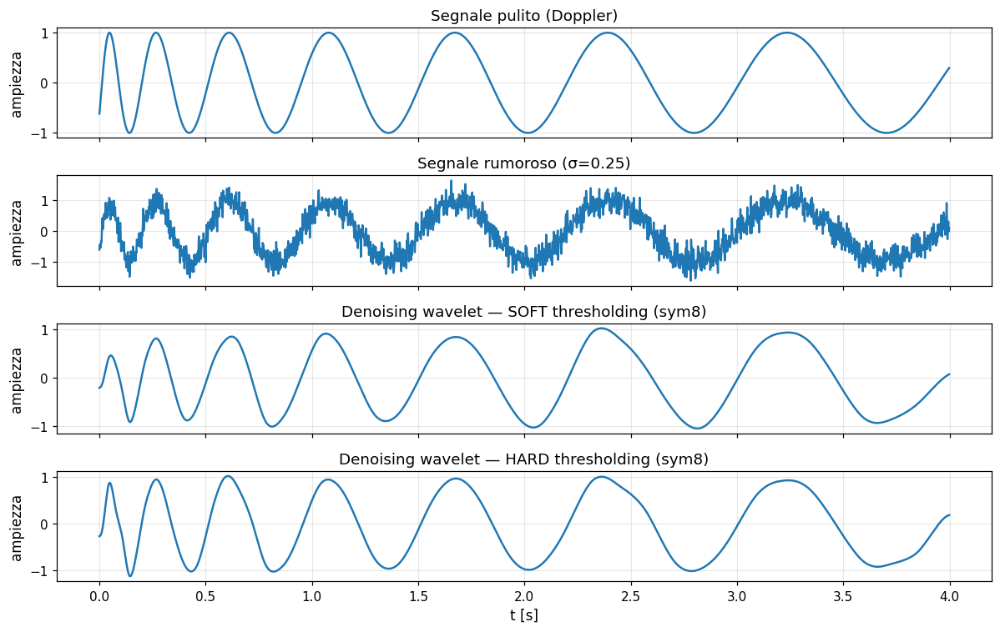

In [68]:
# Denoising wavelet completo + confronto hard/soft
if HAS_PYWT:
    fs = 500.0
    t = np.arange(0, 4, 1/fs)
    # Segnale "piped": somma di tre rampe-step (Doppler-like) per evidenziare i bordi
    clean = signal.unit_impulse(len(t)) * 0    # base nulla
    clean = np.sin(8*np.pi*np.sqrt(t+0.05))    # "Doppler", molto usato in letteratura
    rng = np.random.default_rng(7)
    sigma_true = 0.25
    noisy = clean + sigma_true*rng.standard_normal(len(t))

    def wavelet_denoise(x, wavelet="sym8", level=None, mode="soft"):
        if level is None:
            level = pywt.dwt_max_level(len(x), pywt.Wavelet(wavelet).dec_len)
        coeffs = pywt.wavedec(x, wavelet, level=level)
        # σ stimata da d1 con MAD
        sigma = np.median(np.abs(coeffs[-1]))/0.6745
        lam = sigma*np.sqrt(2*np.log(len(x)))
        new = [coeffs[0]] + [pywt.threshold(c, lam, mode=mode) for c in coeffs[1:]]
        return pywt.waverec(new, wavelet)[:len(x)], sigma, lam

    rec_soft, sigma_est, lam = wavelet_denoise(noisy, wavelet="sym8", mode="soft")
    rec_hard, _,     _    = wavelet_denoise(noisy, wavelet="sym8", mode="hard")

    print(f"σ vero    = {sigma_true:.3f}")
    print(f"σ stimato = {sigma_est:.3f}   (MAD su d1)")
    print(f"soglia λ  = {lam:.3f}")

    fig, axes = plt.subplots(4, 1, figsize=(11, 7), sharex=True)
    axes[0].plot(t, clean);    axes[0].set_title("Segnale pulito (Doppler)")
    axes[1].plot(t, noisy);    axes[1].set_title(f"Segnale rumoroso (σ={sigma_true})")
    axes[2].plot(t, rec_soft); axes[2].set_title("Denoising wavelet — SOFT thresholding (sym8)")
    axes[3].plot(t, rec_hard); axes[3].set_title("Denoising wavelet — HARD thresholding (sym8)")
    axes[-1].set_xlabel("t [s]")
    for ax in axes: ax.set_ylabel("ampiezza")
    plt.tight_layout(); plt.show()


**Quale modalità scegliere?**

* **Hard**: ricostruzioni più "fedeli" ai picchi originali, ma artefatti
  rumorosi visibili (oscillazioni residue).
* **Soft**: ricostruzioni più "lisce", picchi un po' ridotti in ampiezza ma
  meno rumore residuo.
* In contesti biomedici si preferisce **soft** per il visivo, **hard** per
  la conservazione degli eventi (es. picchi R).


## 8E.11 Wavelet Packet Decomposition (WPD)

Nella DWT classica decomponiamo **solo** il ramo dell'approssimazione. Nella
**Wavelet Packet Decomposition** decomponiamo **anche** i rami dei dettagli:
otteniamo un albero **bilanciato** di sottobande, con bande di larghezza
**uniforme** $\Delta f = F_s/2^{J+1}$.

* DWT: piramide di sottobande logaritmiche (ottave).
* WPD: griglia uniforme — utile per segnali "ricchi" in alta frequenza
  (es. EMG, suoni).

In PyWavelets si usa `pywt.WaveletPacket(data, wavelet, mode, maxlevel)`.


Numero di sottobande al livello 4: 16


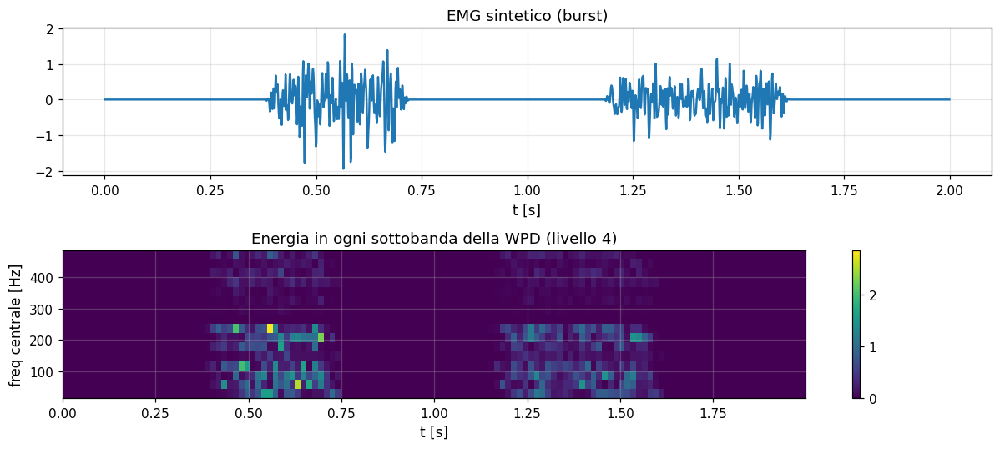

In [69]:
# Wavelet Packet Decomposition su EMG sintetico (banda 20-200 Hz)
if HAS_PYWT:
    fs = 1000.0
    t = np.arange(0, 2, 1/fs)
    rng = np.random.default_rng(3)
    emg = signal.lfilter(*signal.butter(4, [20, 200], btype="band", fs=fs),
                         rng.standard_normal(len(t)))
    # Modula con due burst
    env = ((t>0.4)&(t<0.7)) + 0.7*((t>1.2)&(t<1.6))
    env = np.convolve(env.astype(float), np.ones(40)/40, mode="same")
    emg = emg*env

    wp = pywt.WaveletPacket(data=emg, wavelet="db4", mode="symmetric", maxlevel=4)
    nodes = wp.get_level(4, order="natural")
    print(f"Numero di sottobande al livello 4: {len(nodes)}")
    # Costruiamo una matrice tempo-frequenza prendendo l'energia in ogni nodo
    energies = np.array([np.abs(n.data) for n in nodes])
    # Asse delle "frequenze" approssimativo: centro della banda
    band_centers = np.array([((i+0.5)/(2**4))*(fs/2) for i in range(len(nodes))])

    fig, axes = plt.subplots(2, 1, figsize=(11, 5))
    axes[0].plot(t, emg); axes[0].set_title("EMG sintetico (burst)")
    axes[0].set_xlabel("t [s]")
    pcm = axes[1].imshow(energies, aspect="auto", origin="lower",
                          extent=[0, t[-1], band_centers[0], band_centers[-1]],
                          cmap="viridis")
    axes[1].set_xlabel("t [s]"); axes[1].set_ylabel("freq centrale [Hz]")
    axes[1].set_title("Energia in ogni sottobanda della WPD (livello 4)")
    plt.gcf().colorbar(pcm, ax=axes[1]); plt.tight_layout(); plt.show()


## 8E.12 Confronto sistematico STFT vs CWT vs DWT

| Aspetto | STFT | CWT | DWT |
|---|---|---|---|
| Risoluzione | uniforme (finestra fissa) | logaritmica (ottave) | logaritmica (ottave) |
| Domini | tempo × frequenza | tempo × scala | tempo × livello |
| Ortogonalità | non in generale | non in generale (è ridondante) | sì per wavelet ortogonali |
| Ridondanza | bassa | alta (continua in scale) | nessuna (decimazione 2) |
| Inversione | sì (sintesi con stessa finestra) | sì (formula di ammissibilità) | sì (esattissima per ortogonali) |
| Costo | $O(N\log N)$ via FFT | $O(N\log N \cdot N_\text{scale})$ | $O(N)$ |
| Quando preferirla | banda stretta nota | analisi visiva, scaling | compressione, denoising, MRA |

Visualizziamolo su un singolo segnale che ha **due eventi a scale molto
diverse**: un'oscillazione lenta e un picco rapido.


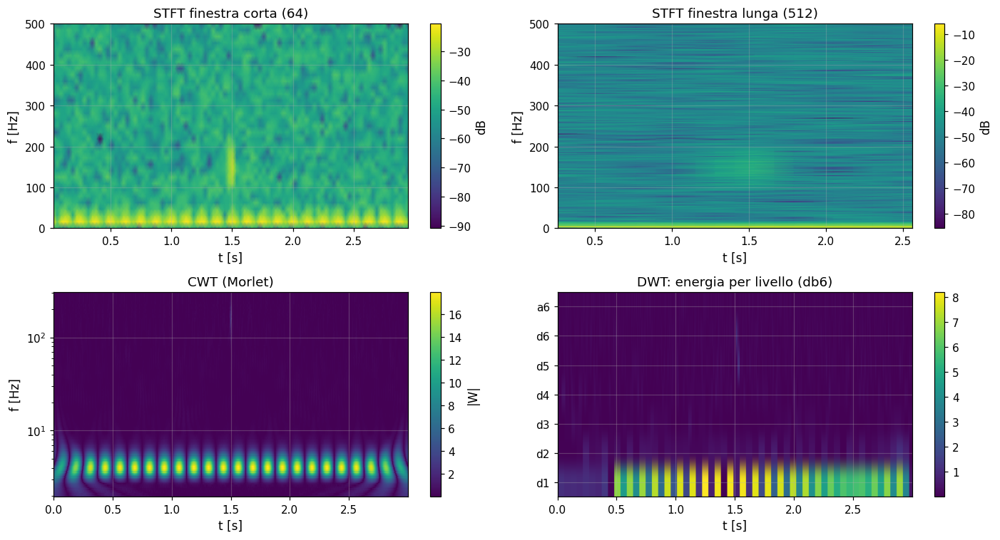

In [70]:
# Confronto su un segnale con due scale temporali molto diverse
fs = 1000.0; t = np.arange(0, 3, 1/fs)
rng = np.random.default_rng(0)
slow = np.sin(2*np.pi*4*t)
fast = 1.2*np.exp(-((t-1.5)**2)/(2*0.005**2))*np.cos(2*np.pi*150*t)
x_mix = slow + fast + 0.1*rng.standard_normal(len(t))

# STFT a due finestre
fig, axes = plt.subplots(2, 2, figsize=(13, 7))
for ax, nperseg, name in [(axes[0,0], 64,  "STFT finestra corta (64)"),
                           (axes[0,1], 512, "STFT finestra lunga (512)")]:
    f_s, t_s, Sxx = signal.spectrogram(x_mix, fs=fs, nperseg=nperseg, noverlap=nperseg//2)
    pcm = ax.pcolormesh(t_s, f_s, 10*np.log10(np.maximum(Sxx, 1e-15)),
                        shading="gouraud", cmap="viridis")
    ax.set_title(name); ax.set_xlabel("t [s]"); ax.set_ylabel("f [Hz]")
    plt.gcf().colorbar(pcm, ax=ax, label="dB")

# CWT
if HAS_PYWT:
    fc = pywt.central_frequency("morl")
    fs_target = np.geomspace(2, 300, 120)
    scales = fc/(fs_target*(1/fs))
    coef, freqs = pywt.cwt(x_mix, scales, "morl", sampling_period=1/fs)
    pcm = axes[1,0].pcolormesh(t, freqs, np.abs(coef), shading="auto", cmap="viridis")
    axes[1,0].set_yscale("log")
    axes[1,0].set_title("CWT (Morlet)"); axes[1,0].set_xlabel("t [s]"); axes[1,0].set_ylabel("f [Hz]")
    plt.gcf().colorbar(pcm, ax=axes[1,0], label="|W|")

    # DWT energia per livello
    coeffs = pywt.wavedec(x_mix, "db6", level=6)
    energy = np.zeros((len(coeffs), len(x_mix)))
    for i, c in enumerate(coeffs):
        # upsampling rozzo del modulo per allinearlo al tempo
        rep = np.repeat(np.abs(c), int(np.ceil(len(x_mix)/len(c))))[:len(x_mix)]
        energy[i] = rep
    labels = [f"a{6}"] + [f"d{6-i}" for i in range(6)]
    pcm = axes[1,1].imshow(energy[::-1], aspect="auto",
                            extent=[t[0], t[-1], 0, len(coeffs)], cmap="viridis")
    axes[1,1].set_yticks(np.arange(len(coeffs))+0.5)
    axes[1,1].set_yticklabels(labels[::-1])
    axes[1,1].set_title("DWT: energia per livello (db6)")
    axes[1,1].set_xlabel("t [s]")
    plt.gcf().colorbar(pcm, ax=axes[1,1])
plt.tight_layout(); plt.show()


## 8E.13 Caso di studio: denoising di un ECG sintetico

Costruiamo un ECG sintetico con rumore gaussiano e baseline wandering, e
confrontiamo:

1. filtraggio classico (bandpass 0.5-40 Hz),
2. denoising wavelet (sym8, soft thresholding),
3. combinazione dei due.


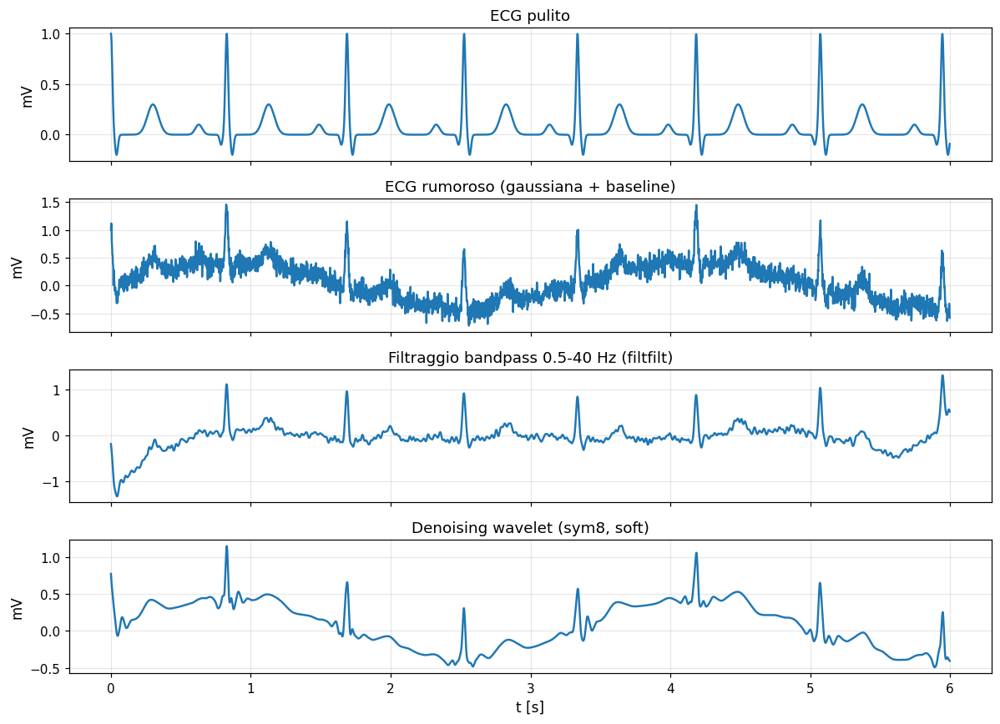

SNR ingresso  : -4.73 dB
SNR bandpass  : -2.89 dB
SNR wavelet   : -4.51 dB
SNR bandpass + wavelet : -2.89 dB


In [71]:
def synth_ecg_for_wavelet(duration=10.0, fs=500.0, hr_bpm=72.0, seed=0):
    rng = np.random.default_rng(seed)
    t = np.arange(0, duration, 1/fs)
    rr = 60.0/hr_bpm
    n_beats = int(np.ceil(duration/rr)) + 2
    rr_seq = rr*(1 + 0.05*rng.standard_normal(n_beats))
    beat_times = np.cumsum(rr_seq) - rr_seq[0]
    waves = [(-0.20, 0.10, 0.025),
             (-0.04,-0.10, 0.010),
             ( 0.00, 1.00, 0.010),
             ( 0.04,-0.20, 0.010),
             ( 0.30, 0.30, 0.040)]
    ecg = np.zeros_like(t)
    for tb in beat_times:
        for off, A, w in waves:
            ecg += A*np.exp(-((t-(tb+off))**2)/(2*w**2))
    return t, ecg

fs = 500.0
t, ecg_clean = synth_ecg_for_wavelet(duration=6.0, fs=fs)
rng = np.random.default_rng(11)
baseline = 0.4*np.sin(2*np.pi*0.3*t)
noise    = 0.10*rng.standard_normal(len(t))
ecg_noisy = ecg_clean + baseline + noise

# (1) Bandpass classico
b_b, a_b = signal.butter(4, [0.5, 40], btype="band", fs=fs)
ecg_bp = signal.filtfilt(b_b, a_b, ecg_noisy)

# (2) Denoising wavelet pure
if HAS_PYWT:
    def wavelet_denoise(x, wavelet="sym8", level=None, mode="soft"):
        if level is None:
            level = pywt.dwt_max_level(len(x), pywt.Wavelet(wavelet).dec_len)
        coeffs = pywt.wavedec(x, wavelet, level=level)
        sigma = np.median(np.abs(coeffs[-1]))/0.6745
        lam   = sigma*np.sqrt(2*np.log(len(x)))
        new   = [coeffs[0]] + [pywt.threshold(c, lam, mode=mode) for c in coeffs[1:]]
        return pywt.waverec(new, wavelet)[:len(x)]

    ecg_wv = wavelet_denoise(ecg_noisy, wavelet="sym8", mode="soft")
    ecg_wv_bp = wavelet_denoise(ecg_bp, wavelet="sym8", mode="soft")
else:
    ecg_wv = ecg_bp.copy(); ecg_wv_bp = ecg_bp.copy()

fig, axes = plt.subplots(4, 1, figsize=(11, 8), sharex=True)
axes[0].plot(t, ecg_clean); axes[0].set_title("ECG pulito")
axes[1].plot(t, ecg_noisy); axes[1].set_title("ECG rumoroso (gaussiana + baseline)")
axes[2].plot(t, ecg_bp);    axes[2].set_title("Filtraggio bandpass 0.5-40 Hz (filtfilt)")
axes[3].plot(t, ecg_wv);    axes[3].set_title("Denoising wavelet (sym8, soft)")
for ax in axes: ax.set_ylabel("mV")
axes[-1].set_xlabel("t [s]")
plt.tight_layout(); plt.show()

# Confronto con SNR stimato (segnale pulito come riferimento)
def snr(ref, est):
    pr = np.mean(ref**2)
    pe = np.mean((est - ref)**2) + 1e-15
    return 10*np.log10(pr/pe)

print(f"SNR ingresso  : {snr(ecg_clean, ecg_noisy):.2f} dB")
print(f"SNR bandpass  : {snr(ecg_clean, ecg_bp):.2f} dB")
print(f"SNR wavelet   : {snr(ecg_clean, ecg_wv):.2f} dB")
print(f"SNR bandpass + wavelet : {snr(ecg_clean, ecg_wv_bp):.2f} dB")


**Lettura del caso di studio.**

* Il bandpass elimina rumori fuori banda (baseline, alta frequenza), ma
  non discrimina le componenti rumorose **dentro** la banda 0.5-40 Hz.
* Il denoising wavelet pulisce **selettivamente** sui coefficienti piccoli:
  il QRS sopravvive perché concentrato in pochi coefficienti grandi, mentre
  la diffusione di rumore gaussiano sui coefficienti piccoli viene azzerata.
* Spesso la combinazione bandpass + wavelet dà l'SNR migliore.


## 8E.14 Errori comuni e *Must remember* — sezione wavelet

**Errori comuni.**

1. **Confondere CWT e DWT.** La CWT è ridondante (per visualizzazione), la
   DWT è ortonormale (per analisi, compressione, denoising).
2. **Non scegliere il numero di livelli con `dwt_max_level`.** Chiedere più
   livelli del massimo possibile spreca tempo e introduce artefatti dovuti a
   estensioni di bordo eccessive.
3. **Scegliere la wavelet a caso.** Per segnali ECG, le `sym` e le `db`
   funzionano bene; per immagini, le `bior`. Per visualizzazione tempo-
   frequenza, `morl` o `cmor`.
4. **Stimare $\sigma$ sui dettagli sbagliati.** La MAD deve usare i
   coefficienti **di primo livello** (`d1`), che sono dominati dal rumore.
5. **Dimenticare l'estensione di bordo.** PyWavelets di default usa
   `symmetric`. Per segnali con bordi "non simmetrici" può essere meglio
   `periodization` o `zero`. Influisce sui primi e ultimi campioni.
6. **Pensare che la DWT preservi la lunghezza esatta.** Per molte wavelet la
   `waverec` ritorna un array un po' più lungo: tagliare a `len(x)`.

**Must remember (wavelet).**

1. **Wavelet madre** = funzione localizzata, oscillante, a media nulla; la
   **scala** comprime/dilata, la **traslazione** sposta.
2. **CWT**: prodotto interno con $\psi_{a,b}$ ⇒ scalogramma 2D, ridondante,
   ottimo per visualizzazione tempo-scala.
3. **DWT**: banco di filtri ricorsivo, decimazione 2 ad ogni livello,
   ortonormale, ottimo per denoising e compressione.
4. **MRA**: il segnale si scompone in approssimazione + somma di dettagli su
   bande logaritmiche.
5. **Denoising**: soglia di Donoho $\lambda=\sigma\sqrt{2\ln N}$, $\sigma$
   stimata da MAD su `d1`, modalità soft per liscio / hard per picchi.

## Esercizi sezione wavelet

1. Calcolare a mano `dwt_haar_one_level([1,3,2,4])` e confrontare con
   `pywt.dwt`.
2. Generare un segnale a $F_s=512$ Hz con 4 bande EEG distinte (delta,
   theta, alpha, beta) e visualizzare la **piramide DWT** a $J=6$ livelli;
   verificare che ogni ritmo cada nel livello atteso.
3. Per il segnale Doppler della §8E.10, scegliere la wavelet che dà MSE
   minimo dopo soft-thresholding fra `haar, db4, sym8, coif2`.
4. (CWT) Visualizzare lo scalogramma di un chirp 5→100 Hz con `cmor1.5-1.0`
   e individuare la traccia.
5. Implementare la versione **inversa** di `dwt_haar_one_level` e
   verificare che applicarla in cascata ricostruisce $x$.


# Capitolo 9 — Pipeline biomedica completa su ECG sintetico

In questo capitolo conclusivo mettiamo in pratica tutto quello che abbiamo
visto: generiamo un ECG sintetico, aggiungiamo rumori realistici, lo filtriamo
con notch + bandpass, calcoliamo la PSD prima e dopo, ne visualizziamo lo
spettrogramma e infine rileviamo i picchi R per ottenere la frequenza
cardiaca.


## 9.1 Generazione del segnale e dei rumori


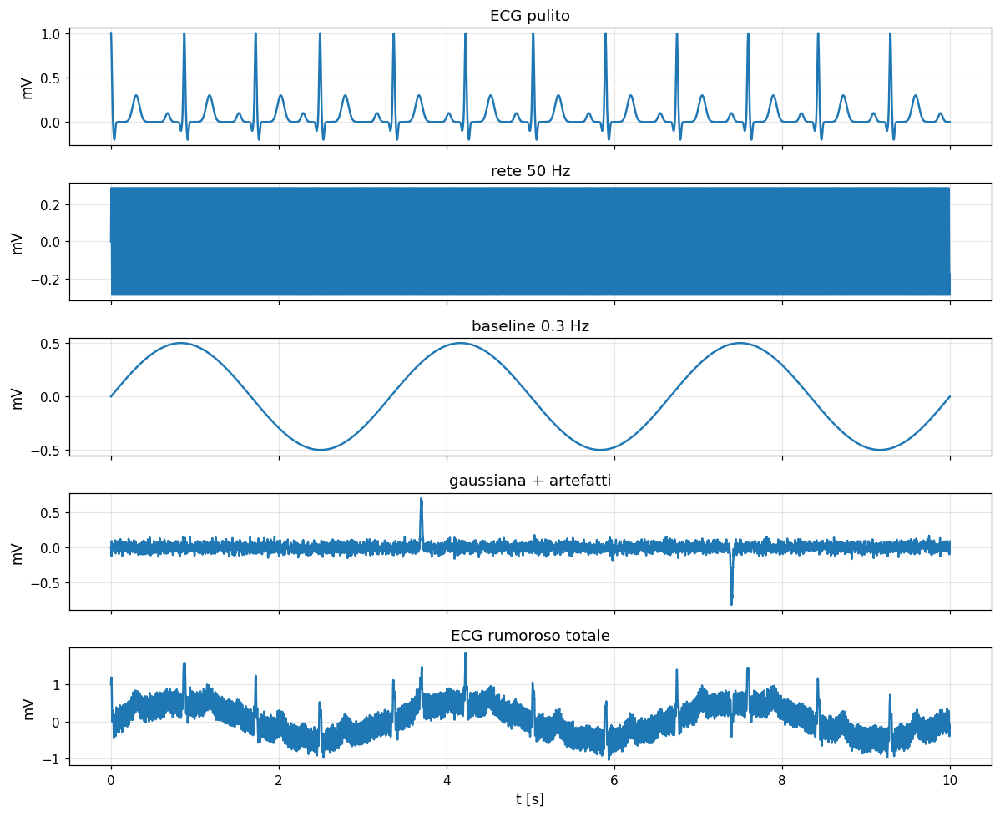

In [72]:
# Generatori (riutilizziamo lo schema visto in cap. 1/5)
def synth_ecg(duration=12.0, fs=500.0, hr_bpm=72.0, seed=0):
    rng = np.random.default_rng(seed)
    t = np.arange(0, duration, 1/fs)
    rr = 60.0/hr_bpm
    n_beats = int(np.ceil(duration/rr)) + 2
    rr_seq = rr*(1 + 0.06*rng.standard_normal(n_beats))
    beat_times = np.cumsum(rr_seq) - rr_seq[0]
    waves = [(-0.20, 0.10, 0.025),
             (-0.04,-0.10, 0.010),
             ( 0.00, 1.00, 0.010),
             ( 0.04,-0.20, 0.010),
             ( 0.30, 0.30, 0.040)]
    ecg = np.zeros_like(t)
    for tb in beat_times:
        for off, A, w in waves:
            ecg += A*np.exp(-((t-(tb+off))**2)/(2*w**2))
    return t, ecg, beat_times

fs = 500.0
t, ecg_clean, beat_times = synth_ecg(duration=10.0, fs=fs, hr_bpm=72.0, seed=1)

rng = np.random.default_rng(2)
mains    = 0.30*np.sin(2*np.pi*50.0*t)            # rumore di rete
baseline = 0.50*np.sin(2*np.pi*0.30*t)            # baseline wandering (respiro)
gauss    = 0.05*rng.standard_normal(len(t))        # rumore strumentale
artifact = np.zeros_like(t)
for tx, A in [(3.7, 0.7), (7.4, -0.8)]:           # artefatti impulsivi
    artifact += A*np.exp(-((t-tx)**2)/(2*0.01**2))

ecg_noisy = ecg_clean + mains + baseline + gauss + artifact

# Visualizziamo tutti i componenti
fig, axes = plt.subplots(5, 1, figsize=(11, 9), sharex=True)
for ax, sig, name in zip(axes,
                         [ecg_clean, mains, baseline, gauss + artifact, ecg_noisy],
                         ["ECG pulito",
                          "rete 50 Hz",
                          "baseline 0.3 Hz",
                          "gaussiana + artefatti",
                          "ECG rumoroso totale"]):
    ax.plot(t, sig); ax.set_title(name); ax.set_ylabel("mV")
axes[-1].set_xlabel("t [s]")
plt.tight_layout(); plt.show()


## 9.2 Spettro pre-filtraggio (Welch)


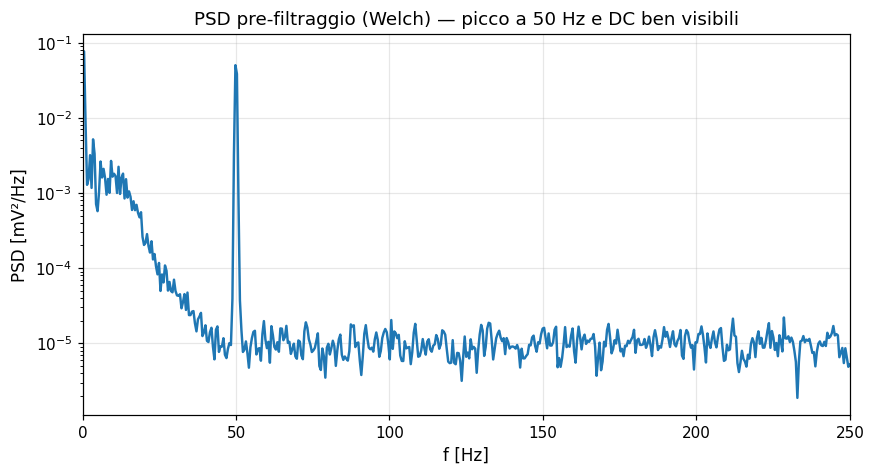

In [73]:
f_w_pre, P_w_pre = signal.welch(ecg_noisy, fs=fs, nperseg=1024, noverlap=512,
                                window="hann", scaling="density")
fig, ax = plt.subplots()
ax.semilogy(f_w_pre, P_w_pre); ax.set_xlim(0, fs/2)
ax.set_xlabel("f [Hz]"); ax.set_ylabel("PSD [mV²/Hz]")
ax.set_title("PSD pre-filtraggio (Welch) — picco a 50 Hz e DC ben visibili")
plt.show()


## 9.3 Filtraggio (notch 50 Hz + bandpass 0.5-40 Hz)

Usiamo `filtfilt` per filtraggio zero-phase, così la morfologia P-QRS-T non
viene distorta.


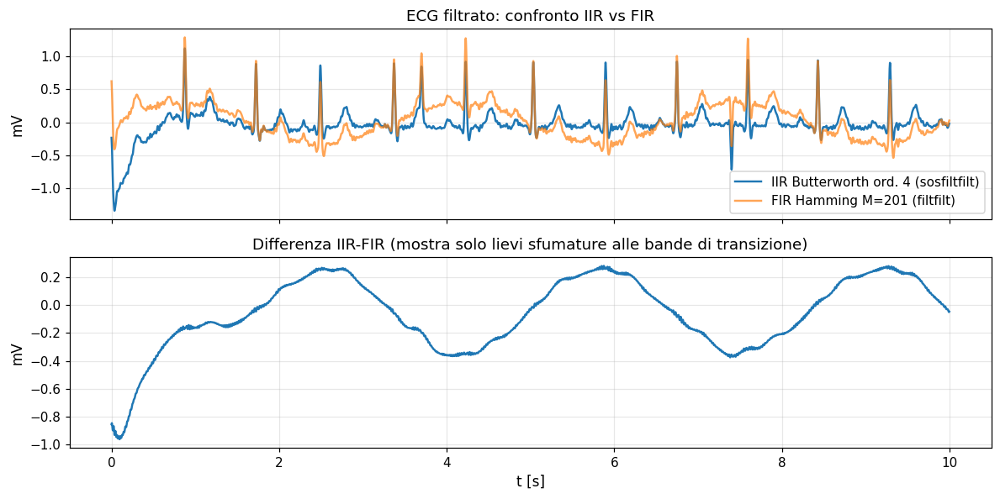

In [74]:
# Notch 50 Hz, Q=30
b_n, a_n = signal.iirnotch(w0=50.0, Q=30, fs=fs)
# Bandpass 0.5-40 Hz, Butterworth ord. 4
sos_bp = signal.butter(4, [0.5, 40], btype="band", fs=fs, output="sos")

ecg_step1 = signal.filtfilt(b_n, a_n, ecg_noisy)
ecg_filt  = signal.sosfiltfilt(sos_bp, ecg_step1)

# Confronto IIR (Butterworth) vs FIR (Hamming) come variante
b_fir = signal.firwin(numtaps=201, cutoff=[0.5, 40], pass_zero=False, fs=fs, window="hamming")
ecg_fir  = signal.filtfilt(b_fir, [1.0], ecg_step1)

fig, axes = plt.subplots(2, 1, figsize=(11, 5.5), sharex=True)
axes[0].plot(t, ecg_filt, label="IIR Butterworth ord. 4 (sosfiltfilt)")
axes[0].plot(t, ecg_fir, alpha=0.7, label="FIR Hamming M=201 (filtfilt)")
axes[0].set_title("ECG filtrato: confronto IIR vs FIR"); axes[0].set_ylabel("mV"); axes[0].legend()
axes[1].plot(t, ecg_filt - ecg_fir)
axes[1].set_title("Differenza IIR-FIR (mostra solo lievi sfumature alle bande di transizione)")
axes[1].set_xlabel("t [s]"); axes[1].set_ylabel("mV")
plt.tight_layout(); plt.show()


## 9.4 PSD post-filtraggio


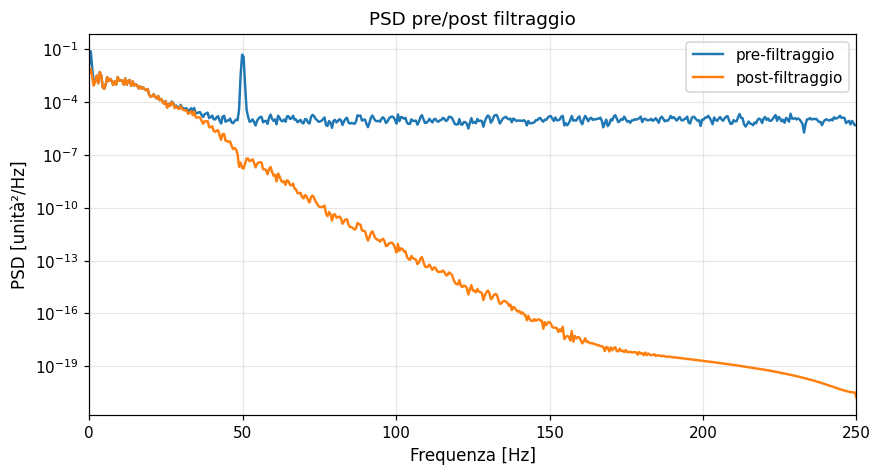

In [75]:
f_w_post, P_w_post = signal.welch(ecg_filt, fs=fs, nperseg=1024, noverlap=512,
                                  window="hann", scaling="density")
psds = {
    "pre-filtraggio" : (f_w_pre,  P_w_pre),
    "post-filtraggio": (f_w_post, P_w_post),
}
plot_psd_comparison(psds, fs=fs, title="PSD pre/post filtraggio")
plt.xlim(0, fs/2); plt.show()


## 9.5 Spettrogramma del segnale filtrato


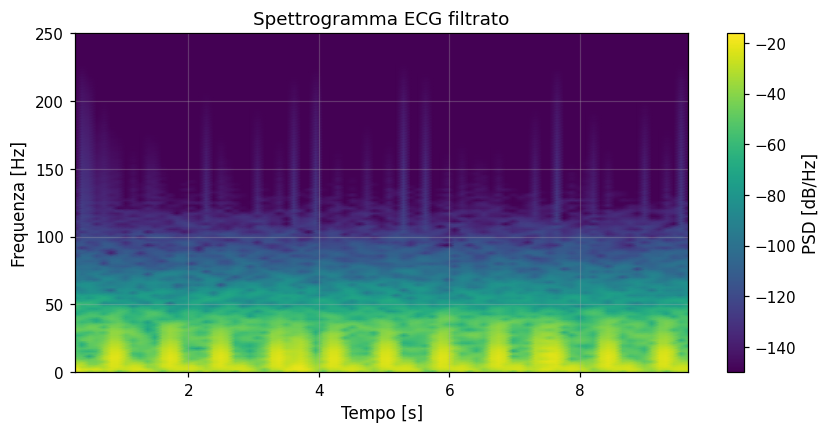

In [76]:
ax, _ = plot_spectrogram(ecg_filt, fs=fs, nperseg=256, noverlap=200,
                         title="Spettrogramma ECG filtrato")
plt.show()


## 9.6 Rilevamento dei picchi R e calcolo della frequenza cardiaca

Tecnica semplice ma efficace:

1. **Pre-enfasi** del complesso QRS: deriviamo il segnale per esaltare i fronti
   rapidi del QRS.
2. **Squaring**: eleviamo al quadrato per rendere positive e accentuare i picchi.
3. **Smoothing**: media mobile per ottenere una busta.
4. **Picchi**: `scipy.signal.find_peaks` con soglia adattiva e distanza minima
   (~ $0.3$ s = 200 bpm massima).


Numero di battiti rilevati  : 13
FC media (BPM)              : 85.4
FC std (BPM)                : 36.14


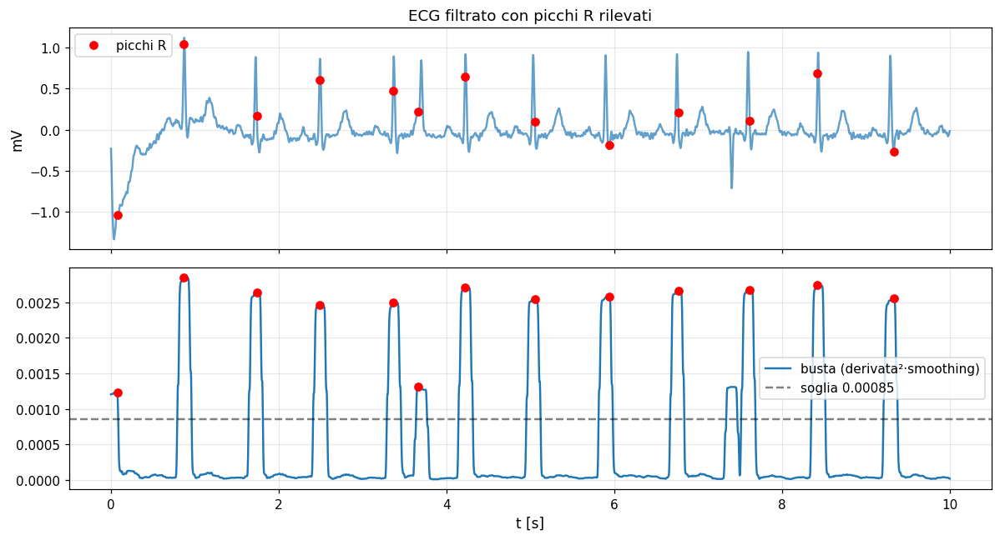

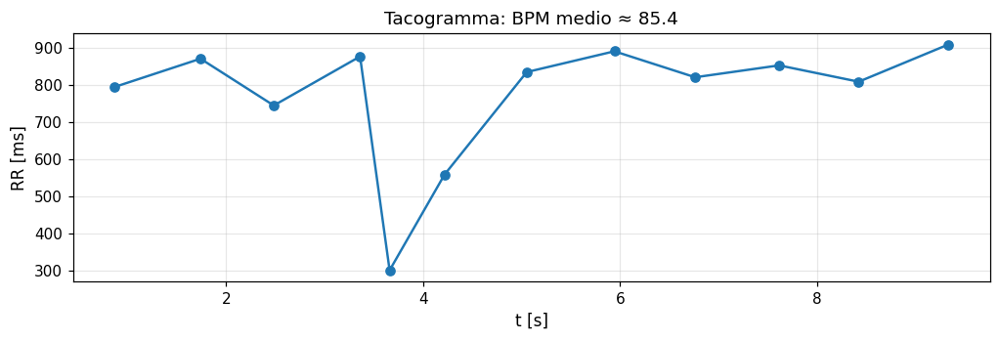

In [77]:
# Pre-enfasi via differenza, squaring, smoothing, find_peaks
deriv = np.diff(ecg_filt, prepend=ecg_filt[0])           # derivata in avanti
squared = deriv**2
win = int(0.150*fs)                                      # finestra 150 ms
smoothed = np.convolve(squared, np.ones(win)/win, mode="same")

# Soglia adattiva: 30% del max della busta
thr = 0.30 * np.max(smoothed)
peaks, props = signal.find_peaks(smoothed, height=thr, distance=int(0.300*fs))

# Intervalli RR e BPM
rr_intervals = np.diff(peaks)/fs
heart_rate   = 60.0/rr_intervals
print(f"Numero di battiti rilevati  : {len(peaks)}")
print(f"FC media (BPM)              : {np.mean(heart_rate):.1f}")
print(f"FC std (BPM)                : {np.std(heart_rate):.2f}")

fig, axes = plt.subplots(2, 1, figsize=(11, 6), sharex=True)
axes[0].plot(t, ecg_filt, alpha=0.7)
axes[0].plot(t[peaks], ecg_filt[peaks], "ro", label="picchi R")
axes[0].set_title("ECG filtrato con picchi R rilevati"); axes[0].set_ylabel("mV"); axes[0].legend()
axes[1].plot(t, smoothed, label="busta (derivata²·smoothing)")
axes[1].plot(t[peaks], smoothed[peaks], "ro")
axes[1].axhline(thr, color="k", ls="--", alpha=0.5, label=f"soglia {thr:.2g}")
axes[1].set_xlabel("t [s]"); axes[1].legend()
plt.tight_layout(); plt.show()

# Tacogramma (RR vs tempo di battito)
fig, ax = plt.subplots(figsize=(11, 3))
ax.plot(t[peaks[1:]], rr_intervals*1000, "o-")
ax.set_xlabel("t [s]"); ax.set_ylabel("RR [ms]")
ax.set_title(f"Tacogramma: BPM medio ≈ {np.mean(heart_rate):.1f}")
plt.show()


## 9.7 Discussione clinico-ingegneristica

* La sequenza **notch 50 Hz → bandpass 0.5-40 Hz → filtfilt** è uno standard
  semplice ma efficace per ECG diagnostico.
* L'uso di `filtfilt` introduce **non-causalità** (analisi offline) ma rimuove
  qualsiasi distorsione di fase, condizione cruciale per non alterare la
  morfologia QRS.
* Il rilevamento R proposto è una versione minimale dell'algoritmo di
  Pan–Tompkins. In contesti clinici reali si aggiungono soglie adattive
  ricorsive, filtri di banda 5-15 Hz prima della derivata, e controllo di
  qualità del segnale.
* L'HRV (variabilità della frequenza cardiaca) si analizza poi nel dominio
  della frequenza tramite Welch o AR sul **tacogramma** (gli intervalli RR
  ricampionati uniformemente).


# Appendice A — Python e NumPy da zero per DSP

Questa appendice riassume **da zero** il minimo Python/NumPy necessario per
seguire tutto il notebook. Se sei a tuo agio con array, slicing, broadcasting
e funzioni puoi saltarla; altrimenti è la tua "stampella" per non perderti.

## A.1 Variabili, tipi numerici, complessi

* `1` è un intero, `1.0` un float, `1+2j` un complesso.
* `int`, `float`, `complex`, `bool` sono i tipi numerici di base.
* Per i complessi Python usa `j` (non `i`).
* Operatori: `+ - * / // % **` (divisione intera `//`, modulo `%`, potenza `**`).


In [78]:
# Esempi di base
a = 3
b = 2.5
z = 1 + 2j
print("a tipo:", type(a).__name__, "  b tipo:", type(b).__name__)
print("z =", z, "  |z| =", abs(z), "  arg(z) =", np.angle(z), "rad")
print("z.conjugate() =", z.conjugate())


a tipo: int   b tipo: float
z = (1+2j)   |z| = 2.23606797749979   arg(z) = 1.1071487177940904 rad
z.conjugate() = (1-2j)


## A.2 Array NumPy: la struttura dati di tutto il DSP

Un array è una "tabella" multidimensionale di numeri **dello stesso tipo**
(omogeneo). Tre concetti chiave:

* `shape` — le dimensioni: `(N,)` 1D, `(M, N)` 2D, `(R, C, N)` 3D.
* `dtype` — il tipo (`float64`, `complex128`, `int32`, `bool`, ...).
* `strides` — come si "passa" da un elemento all'altro in memoria (avanzato).


In [79]:
# Creazione di array in vari modi
v_list  = np.array([1.0, 2.0, 3.0])
v_zeros = np.zeros(5)
v_ones  = np.ones(4)
v_arr   = np.arange(0, 10, 2)              # 0, 2, 4, 6, 8
v_lin   = np.linspace(0, 1, 6)             # 6 punti da 0 a 1 inclusi
v_rand  = np.random.default_rng(0).standard_normal(5)

print("v_list :", v_list,  "shape", v_list.shape,  "dtype", v_list.dtype)
print("arange :", v_arr)
print("linspace:", v_lin)
print("rand   :", v_rand)


v_list : [1. 2. 3.] shape (3,) dtype float64
arange : [0 2 4 6 8]
linspace: [0.  0.2 0.4 0.6 0.8 1. ]
rand   : [ 0.12573022 -0.13210486  0.64042265  0.10490012 -0.53566937]


## A.3 Indicizzazione e slicing

Le sequenze in NumPy si indicizzano con interi e con **slice** del tipo
`start:stop:step`. I valori non specificati prendono il default
(inizio/fine/`1`).


In [80]:
x = np.arange(10)
print("x         =", x)
print("x[0]      =", x[0])        # primo
print("x[-1]     =", x[-1])       # ultimo
print("x[1:4]    =", x[1:4])      # [1, 2, 3]
print("x[::2]    =", x[::2])      # ogni 2
print("x[::-1]   =", x[::-1])     # inverso
print("x[x > 5]  =", x[x > 5])    # mask booleano

# Indici "fancy"
idx = np.array([0, 3, 7])
print("x[idx]    =", x[idx])


x         = [0 1 2 3 4 5 6 7 8 9]
x[0]      = 0
x[-1]     = 9
x[1:4]    = [1 2 3]
x[::2]    = [0 2 4 6 8]
x[::-1]   = [9 8 7 6 5 4 3 2 1 0]
x[x > 5]  = [6 7 8 9]
x[idx]    = [0 3 7]


## A.4 Operazioni elementari e broadcasting

In NumPy le operazioni si applicano **elemento per elemento**:

* `a + b`, `a - b`, `a * b`, `a / b`, `a**2`, ecc.
* Per il **prodotto matrice-vettore** o **matrice-matrice** usa `@` o
  `np.dot`.
* **Broadcasting**: se due array hanno shape compatibili (uno è "1" lungo
  certi assi), NumPy li allarga automaticamente.


In [81]:
# Broadcasting: vettore + scalare, matrice + vettore riga, ecc.
v = np.array([1, 2, 3])
print("v + 10           =", v + 10)
print("v * 2.5          =", v * 2.5)
M = np.array([[1, 2, 3],
              [4, 5, 6]])
print("M.shape =", M.shape, "  v.shape =", v.shape)
print("M + v =\n", M + v)          # v "ripetuto" lungo le righe (broadcasting)
print("M @ v =", M @ v)            # prodotto matrice-vettore


v + 10           = [11 12 13]
v * 2.5          = [2.5 5.  7.5]
M.shape = (2, 3)   v.shape = (3,)
M + v =
 [[2 4 6]
 [5 7 9]]
M @ v = [14 32]


## A.5 Funzioni e definizioni

In Python una funzione si definisce con `def`. Una funzione di una riga si
può anche scrivere come `lambda`. Tipicamente per DSP:


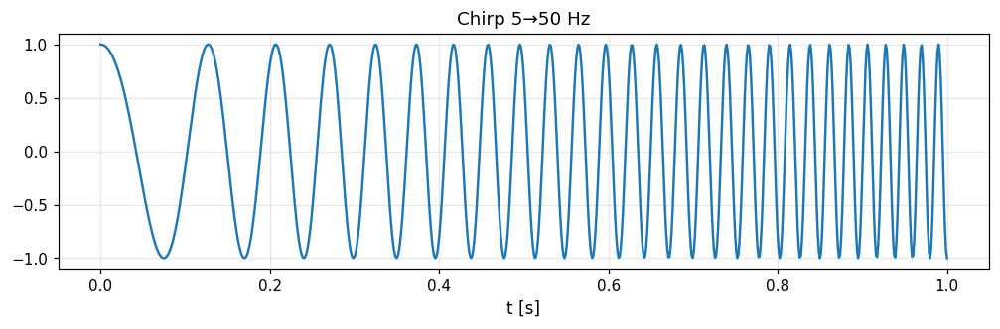

In [82]:
def chirp(t, f0, f1, T):
    # Chirp lineare: la frequenza istantanea passa da f0 a f1 in T secondi
    k = (f1 - f0)/T
    return np.cos(2*np.pi*(f0*t + 0.5*k*t**2))

t = np.linspace(0, 1, 800)
y = chirp(t, 5, 50, 1.0)
plt.figure(figsize=(11,2.8)); plt.plot(t, y); plt.title("Chirp 5→50 Hz")
plt.xlabel("t [s]"); plt.show()


## A.6 Plot con matplotlib in 5 minuti

* `plt.figure(figsize=(W, H))` crea una figura di dimensioni `(W, H)` pollici.
* `plt.plot(x, y)`, `plt.stem(x, y)`, `plt.scatter(x, y)`, `plt.imshow(M)`.
* `plt.title`, `plt.xlabel`, `plt.ylabel`, `plt.legend`, `plt.grid`.
* `plt.show()` mostra la figura.

Per più grafici nella stessa figura usiamo
`fig, axes = plt.subplots(rows, cols)` e poi `axes[i,j].plot(...)`.


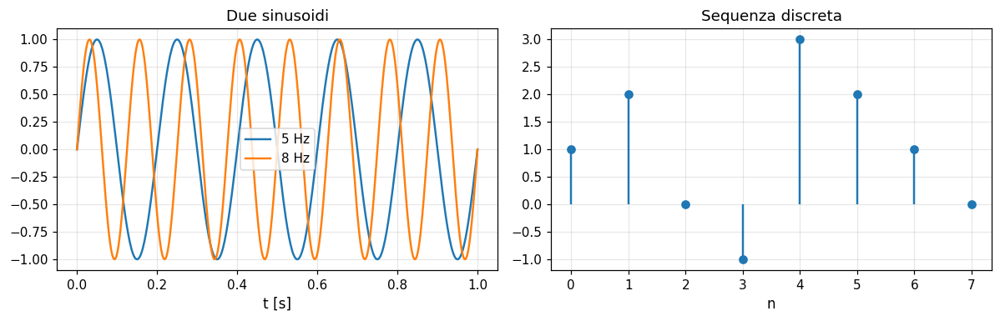

In [83]:
# Esempio canonico: due grafici affiancati, titoli, legenda, griglia
t = np.linspace(0, 1, 500)
fig, axes = plt.subplots(1, 2, figsize=(11, 3.6))
axes[0].plot(t, np.sin(2*np.pi*5*t),   label="5 Hz")
axes[0].plot(t, np.sin(2*np.pi*8*t),   label="8 Hz")
axes[0].set_title("Due sinusoidi"); axes[0].set_xlabel("t [s]"); axes[0].legend()

axes[1].stem(np.arange(8), np.array([1,2,0,-1,3,2,1,0]), basefmt=" ")
axes[1].set_title("Sequenza discreta"); axes[1].set_xlabel("n")
plt.tight_layout(); plt.show()


## A.7 Cose che bloccano i principianti

* **`np.array != list`**: gli array sono omogenei e supportano broadcasting;
  le liste no. `[1,2] + [3,4]` concatena, `np.array([1,2]) + np.array([3,4])`
  somma elemento per elemento.
* **`/` vs `//`**: `3/2 == 1.5`, `3//2 == 1`. Per indici usa `//`.
* **Slice end-exclusive**: `x[0:3]` prende `x[0], x[1], x[2]`, **non** `x[3]`.
* **`np.fft.fftfreq`**: ricorda che le frequenze restituite vanno da $0$ a
  $F_s/2$ e poi *negative* (da $-F_s/2$ a $-F_s/N$).
* **dtype complesso**: per DFT manuale assicurati che l'accumulatore sia
  `complex`, altrimenti perdi la parte immaginaria.


# Appendice B — DSP multirate: decimazione, interpolazione, polifase

Quando lavoriamo con segnali a frequenze di campionamento diverse (ECG a 250
Hz, EEG a 500 Hz, audio a 44.1 kHz), serve poter convertire la frequenza
senza introdurre aliasing. Tre operazioni base: **decimazione**,
**interpolazione**, **resampling**.

## B.1 Decimazione (downsampling) per fattore $M$

Da $x[n]$ a $F_s$ vogliamo ottenere $y[n]$ a $F_s/M$. Due passi:

1. **Filtro anti-aliasing** passabasso con cutoff $\le F_s/(2M)$.
2. **Downsampling**: prendi un campione ogni $M$.

In Python: `scipy.signal.decimate(x, M)` fa entrambe le operazioni in
sequenza (filtro IIR di ordine 8 per default).


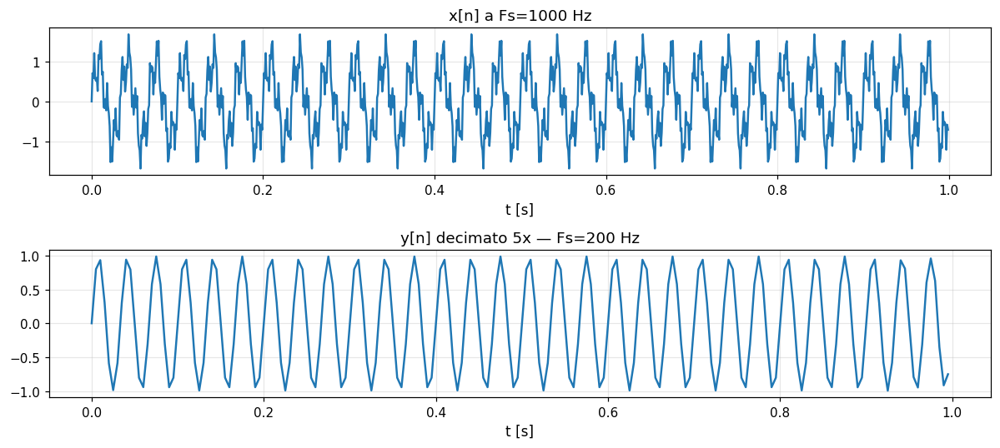

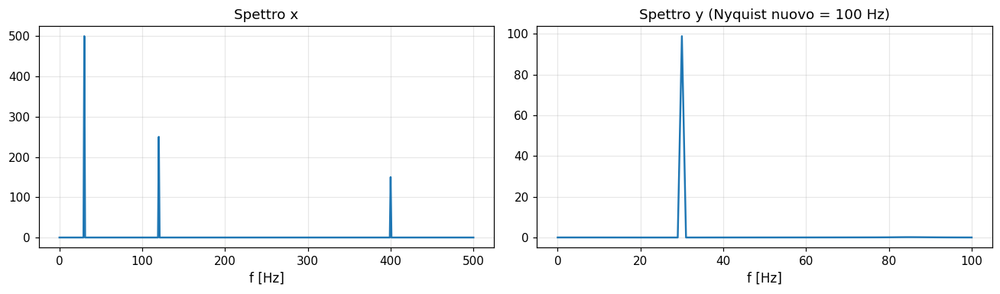

In [84]:
# Esempio: decimazione 5x di un segnale composto
fs = 1000.0; t = np.arange(0, 1, 1/fs)
x = np.sin(2*np.pi*30*t) + 0.5*np.sin(2*np.pi*120*t) + 0.3*np.sin(2*np.pi*400*t)
# Decimazione di un fattore 5: nuovo fs = 200 Hz, Nyquist = 100 Hz
y = signal.decimate(x, q=5, ftype="iir")
t_d = np.arange(len(y)) / (fs/5)

fig, axes = plt.subplots(2, 1, figsize=(11, 5))
axes[0].plot(t, x);   axes[0].set_title(f"x[n] a Fs={fs:.0f} Hz")
axes[1].plot(t_d, y); axes[1].set_title(f"y[n] decimato 5x — Fs={fs/5:.0f} Hz")
for ax in axes: ax.set_xlabel("t [s]")
plt.tight_layout(); plt.show()

# Spettri prima/dopo per visualizzare cosa abbiamo "tolto"
fig, axes = plt.subplots(1, 2, figsize=(12, 3.6))
f1 = np.fft.rfftfreq(len(x), 1/fs); X = np.fft.rfft(x)
axes[0].plot(f1, np.abs(X)); axes[0].set_title("Spettro x"); axes[0].set_xlabel("f [Hz]")
f2 = np.fft.rfftfreq(len(y), 1/(fs/5)); Y = np.fft.rfft(y)
axes[1].plot(f2, np.abs(Y)); axes[1].set_title(f"Spettro y (Nyquist nuovo = {fs/5/2:.0f} Hz)")
axes[1].set_xlabel("f [Hz]")
plt.tight_layout(); plt.show()


## B.2 Interpolazione (upsampling) per fattore $L$

Da $x[n]$ a $F_s$ a $y[n]$ a $L\cdot F_s$:

1. **Zero-insertion**: tra ogni coppia di campioni inserisci $L-1$ zeri.
2. **Filtro passabasso** con cutoff $\le F_s/2$ per "lisciare" le immagini
   spettrali introdotte.

Funzione comoda: `scipy.signal.resample_poly(x, up=L, down=1)`.


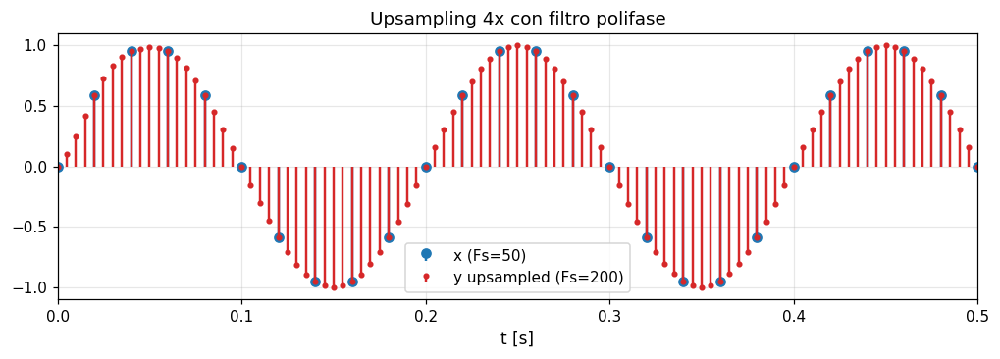

In [85]:
# Esempio: upsampling 4x di un sinusoide a 5 Hz
fs = 50.0; t = np.arange(0, 1, 1/fs)
x = np.sin(2*np.pi*5*t)
L = 4
y = signal.resample_poly(x, up=L, down=1)
t_u = np.arange(len(y)) / (fs*L)

fig, ax = plt.subplots(figsize=(11, 3.2))
ax.stem(t, x, linefmt="C0-", markerfmt="C0o", basefmt=" ", label=f"x (Fs={fs:.0f})")
ax.stem(t_u, y, linefmt="C3-", markerfmt="C3.", basefmt=" ", label=f"y upsampled (Fs={fs*L:.0f})")
ax.set_xlim(0, 0.5); ax.set_title("Upsampling 4x con filtro polifase")
ax.set_xlabel("t [s]"); ax.legend(); plt.show()


## B.3 Resampling razionale $L/M$

`scipy.signal.resample_poly(x, up=L, down=M)` esegue insieme upsampling per
$L$ e downsampling per $M$, usando un **filtro polifase**: una soluzione
efficiente che evita di calcolare i campioni "intermedi" che verrebbero poi
scartati. Utile per convertire 250 Hz ↔ 360 Hz (MIT-BIH ↔ standard), 44.1
kHz ↔ 48 kHz, ecc.


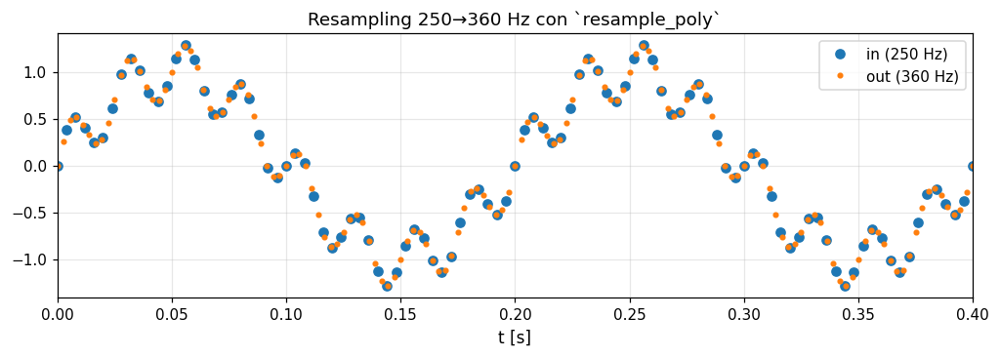

In [86]:
# Resampling 250 → 360 Hz (rapporto 36/25)
fs_in  = 250.0
fs_out = 360.0
t_in   = np.arange(0, 1, 1/fs_in)
x      = np.sin(2*np.pi*5*t_in) + 0.3*np.sin(2*np.pi*40*t_in)

L, M = 36, 25
y = signal.resample_poly(x, up=L, down=M)
t_out = np.arange(len(y)) / fs_out

fig, ax = plt.subplots(figsize=(11, 3.2))
ax.plot(t_in, x, "o", label=f"in ({fs_in:.0f} Hz)")
ax.plot(t_out, y, ".", label=f"out ({fs_out:.0f} Hz)")
ax.set_xlim(0, 0.4); ax.set_xlabel("t [s]"); ax.legend()
ax.set_title(f"Resampling {fs_in:.0f}→{fs_out:.0f} Hz con `resample_poly`")
plt.show()


# Appendice C — Trasformata di Hilbert e segnale analitico

## C.1 Definizione

La **trasformata di Hilbert** $\mathcal{H}\{x\}(t)$ di un segnale reale
$x(t)$ è
$$
\hat x(t) \;=\; \mathcal{H}\{x\}(t)
\;=\; \mathrm{p.v.} \int_{-\infty}^{+\infty}\frac{x(\tau)}{\pi(t-\tau)}\,d\tau,
$$
dove "p.v." è il valore principale di Cauchy. In frequenza:
$\widehat{\hat x}(j\Omega) = -j\,\mathrm{sgn}(\Omega)\,X(j\Omega)$.

In altre parole, Hilbert **sposta di $-\pi/2$ la fase** di ogni frequenza
positiva (e di $+\pi/2$ ogni frequenza negativa) **lasciando immutato il
modulo**.

## C.2 Segnale analitico

Il **segnale analitico** associato a $x(t)$ è il complesso
$$
x_a(t) \;=\; x(t) + j\,\hat x(t).
$$
Per costruzione, lo spettro di $x_a$ ha **componenti positive raddoppiate** e
**componenti negative nulle**: $X_a(j\Omega) = 2\,X(j\Omega)$ per $\Omega>0$,
$0$ altrove. Per una sinusoide reale $\cos(\Omega_0 t)$, $x_a = e^{j\Omega_0 t}$.

## C.3 Ampiezza e frequenza istantanee

* **Ampiezza istantanea**: $A(t) = |x_a(t)|$.
* **Fase istantanea**: $\varphi(t) = \arg x_a(t)$.
* **Frequenza istantanea**: $f_i(t) = \frac{1}{2\pi}\,\dfrac{d\varphi}{dt}$.

Sono potenti per descrivere segnali a banda stretta che cambiano in modo
non stazionario (frequenze cardiaca, respiratoria, ritmi EEG).


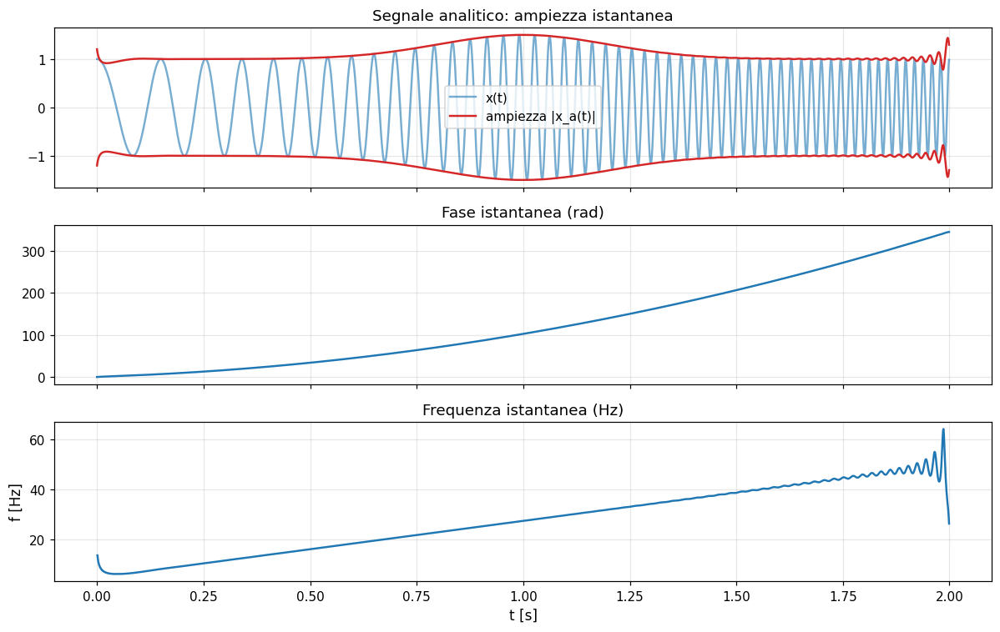

In [87]:
# Hilbert su un chirp: visualizzazione di ampiezza e frequenza istantanee
fs = 1000.0; t = np.arange(0, 2, 1/fs)
chirp_x = signal.chirp(t, f0=5, t1=t[-1], f1=50, method="linear")
envelope = 1 + 0.5*np.exp(-(t-1.0)**2/(2*0.2**2))   # modula ampiezza
x = envelope*chirp_x

x_a = signal.hilbert(x)
A   = np.abs(x_a)
phi = np.unwrap(np.angle(x_a))
f_i = (1/(2*np.pi))*np.diff(phi)*fs

fig, axes = plt.subplots(3, 1, figsize=(11, 7), sharex=True)
axes[0].plot(t, x, alpha=0.6, label="x(t)")
axes[0].plot(t, A,  label="ampiezza |x_a(t)|", color="C3")
axes[0].plot(t, -A, color="C3"); axes[0].legend(); axes[0].set_title("Segnale analitico: ampiezza istantanea")
axes[1].plot(t, phi); axes[1].set_title("Fase istantanea (rad)")
axes[2].plot(t[1:], f_i); axes[2].set_title("Frequenza istantanea (Hz)")
axes[2].set_xlabel("t [s]"); axes[2].set_ylabel("f [Hz]")
plt.tight_layout(); plt.show()


**Quando preferire Hilbert alla STFT/wavelet.**

* Quando il segnale è già **a banda stretta** (es. PPG dopo bandpass
  0.5-5 Hz) e vogliamo solo la **busta** o la **fase**.
* Per analisi di **HRV** sul segnale di pressione/PPG (busta), per stimare
  la **frequenza istantanea** di un ritmo dominante (alpha EEG, respiro).


# Appendice D — Heart Rate Variability (HRV) completa

Pipeline classica per analizzare la variabilità della frequenza cardiaca a
partire da un ECG sintetico (o reale, dopo il rilevamento dei picchi R).

## D.1 Tacogramma e ricampionamento

La sequenza $\{RR_k\}$ degli intervalli RR è una **serie non uniforme** nel
tempo (perché RR è una distanza variabile). Per applicare Welch o FFT serve
**ricampionarla uniformemente** (tipicamente a $F_s^* = 4$ Hz).


Battiti rilevati: 145, RR medio = 831.9 ms, FC ≈ 72.1 BPM


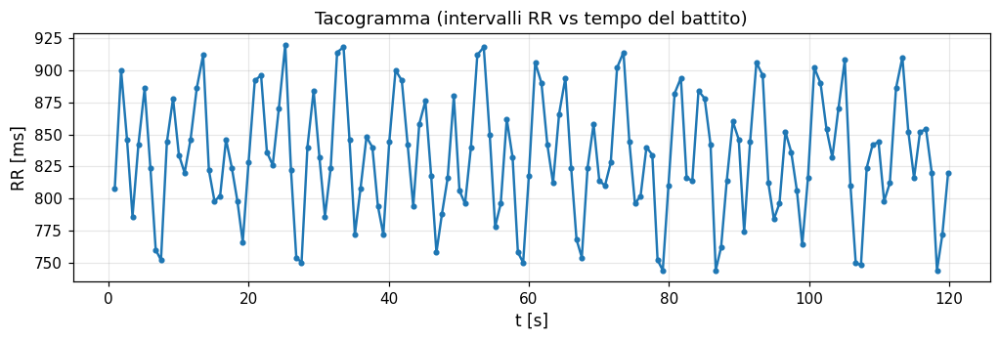

In [88]:
# 1) Generiamo ECG sintetico più lungo (60 s) e rileviamo R
def synth_ecg_long(duration=60.0, fs=500.0, hr_bpm=72.0, seed=42):
    rng = np.random.default_rng(seed)
    t = np.arange(0, duration, 1/fs)
    rr = 60.0/hr_bpm
    n_beats = int(np.ceil(duration/rr)) + 2
    # HRV "vera": modulazione respiratoria (0.25 Hz) + LF (0.1 Hz)
    rr_seq = rr*(1
                 + 0.06*np.sin(2*np.pi*0.25*np.arange(n_beats)*rr)  # HF
                 + 0.04*np.sin(2*np.pi*0.10*np.arange(n_beats)*rr)  # LF
                 + 0.02*rng.standard_normal(n_beats))
    beat_times = np.cumsum(rr_seq) - rr_seq[0]
    waves = [(-0.2,0.10,0.025),(-0.04,-0.10,0.010),
             (0.0,1.0,0.010),(0.04,-0.20,0.010),(0.30,0.30,0.040)]
    ecg = np.zeros_like(t)
    for tb in beat_times:
        for off, A, w in waves:
            ecg += A*np.exp(-((t-(tb+off))**2)/(2*w**2))
    return t, ecg, beat_times

fs = 500.0
t, ecg, beats_true = synth_ecg_long(duration=120.0, fs=fs)

# 2) Detect R con derivata-square-smoothing semplice
b, a = signal.butter(4, [5, 15], btype="band", fs=fs)
ecg_bp = signal.filtfilt(b, a, ecg)
deriv = np.diff(ecg_bp, prepend=ecg_bp[0])
sq    = deriv**2
win   = int(0.15*fs)
env   = np.convolve(sq, np.ones(win)/win, mode="same")
peaks, _ = signal.find_peaks(env, height=0.3*np.max(env), distance=int(0.3*fs))
r_times = t[peaks]
rr = np.diff(r_times)
print(f"Battiti rilevati: {len(peaks)}, RR medio = {rr.mean()*1000:.1f} ms, FC ≈ {60/rr.mean():.1f} BPM")

fig, ax = plt.subplots(figsize=(11, 3))
ax.plot(r_times[1:], rr*1000, "-o", ms=3)
ax.set_xlabel("t [s]"); ax.set_ylabel("RR [ms]")
ax.set_title("Tacogramma (intervalli RR vs tempo del battito)")
plt.show()


## D.2 Ricampionamento uniforme + PSD HRV

L'HRV si analizza nei dominî:

* **tempo**: indicatori RMSSD, SDNN, pNN50, ecc.
* **frequenza**: PSD del tacogramma ricampionato, con bande
  **VLF** ($\le 0.04$ Hz), **LF** ($0.04$–$0.15$ Hz), **HF** ($0.15$–$0.4$
  Hz).

Il rapporto **LF/HF** è un indice classico di bilancio simpatico/parasimpatico.


SDNN  = 46.8 ms
RMSSD = 51.0 ms
pNN50 = 41.3 %

Potenza VLF = 1.47  LF = 646.82  HF = 1174.36  ms²
LF/HF       = 0.55


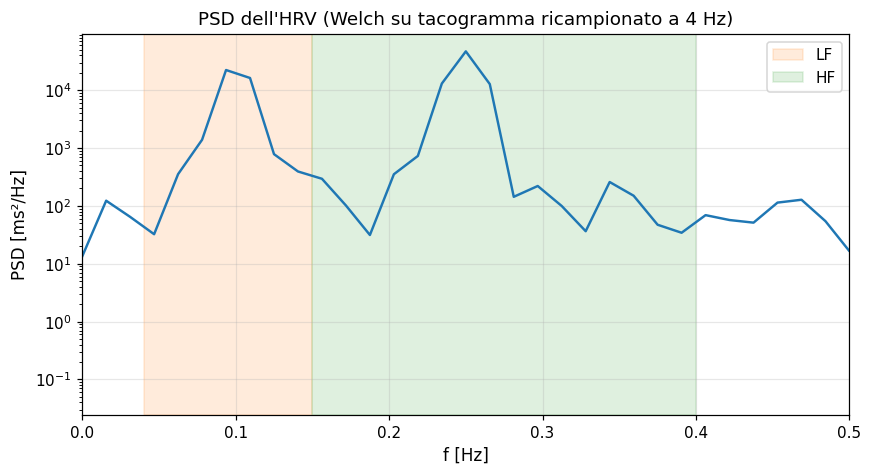

In [89]:
# Indicatori tempo
RR_ms = rr*1000
SDNN  = np.std(RR_ms)
RMSSD = np.sqrt(np.mean(np.diff(RR_ms)**2))
pNN50 = 100*np.mean(np.abs(np.diff(RR_ms)) > 50)
print(f"SDNN  = {SDNN:.1f} ms")
print(f"RMSSD = {RMSSD:.1f} ms")
print(f"pNN50 = {pNN50:.1f} %")

# Ricampionamento uniforme a 4 Hz
fs_hrv = 4.0
t_uniform = np.arange(r_times[1], r_times[-1], 1/fs_hrv)
RR_uniform = np.interp(t_uniform, r_times[1:], RR_ms)

f_hrv, P_hrv = signal.welch(RR_uniform - RR_uniform.mean(), fs=fs_hrv,
                             nperseg=min(256, len(RR_uniform)), window="hann")

def band_power(f, P, lo, hi):
    mask = (f >= lo) & (f <= hi)
    return np.trapezoid(P[mask], f[mask])

VLF = band_power(f_hrv, P_hrv, 0.0033, 0.04)
LF  = band_power(f_hrv, P_hrv, 0.04, 0.15)
HF  = band_power(f_hrv, P_hrv, 0.15, 0.40)
print(f"\nPotenza VLF = {VLF:.2f}  LF = {LF:.2f}  HF = {HF:.2f}  ms²")
print(f"LF/HF       = {LF/HF:.2f}")

fig, ax = plt.subplots()
ax.semilogy(f_hrv, P_hrv); ax.set_xlim(0, 0.5)
ax.axvspan(0.04, 0.15, alpha=0.15, color="C1", label="LF")
ax.axvspan(0.15, 0.40, alpha=0.15, color="C2", label="HF")
ax.set_xlabel("f [Hz]"); ax.set_ylabel("PSD [ms²/Hz]")
ax.set_title("PSD dell'HRV (Welch su tacogramma ricampionato a 4 Hz)")
ax.legend(); plt.show()


**Note pratiche.**

* La definizione delle bande VLF/LF/HF è standard ESC/AHA per registrazioni
  di **5 minuti** o più. Per analisi più brevi si usa solo LF/HF.
* Va sempre **rimossa la media** prima di Welch, e si usa una finestra
  (Hann) per ridurre il leakage.
* Il ricampionamento lineare è l'opzione più semplice; alternative più
  raffinate sono splines cubiche o ricampionamento via Lomb–Scargle (che
  evita l'interpolazione).


# Appendice E — Algebra lineare DSP applicata

Mettiamo insieme due cose che servono spesso ma vengono date per scontate:
la **regressione lineare** come problema di minimi quadrati (con matrice
piena), e una **galleria avanzata di finestre** con i loro indicatori
spettrali.

## E.1 Regressione lineare come minimi quadrati

Dato un insieme di osservazioni $(x_i, y_i)_{i=1}^N$ vogliamo
$\hat y_i = a x_i + b$ con $a, b$ tali da minimizzare $\sum_i (y_i - \hat y_i)^2$.
In forma matriciale, con
$$
A \;=\;
\begin{pmatrix} x_1 & 1 \\ x_2 & 1 \\ \vdots & \vdots \\ x_N & 1 \end{pmatrix},\qquad
\mathbf{\theta} = \begin{pmatrix} a \\ b \end{pmatrix},\qquad
\mathbf{y} = \begin{pmatrix} y_1 \\ \vdots \\ y_N \end{pmatrix},
$$
la soluzione ottima è
$$
\hat{\mathbf{\theta}} = (A^\top A)^{-1} A^\top \mathbf{y}.
$$
Sono le **equazioni normali**.

**Dim.** Dalla derivata di $\|A\theta - y\|^2$ rispetto a $\theta$:
$2A^\top(A\theta - y) = 0$, quindi $A^\top A\,\theta = A^\top y$. $\square$


a stimato = 1.664  (vero 1.7)
b stimato = -1.927  (vero -2.0)


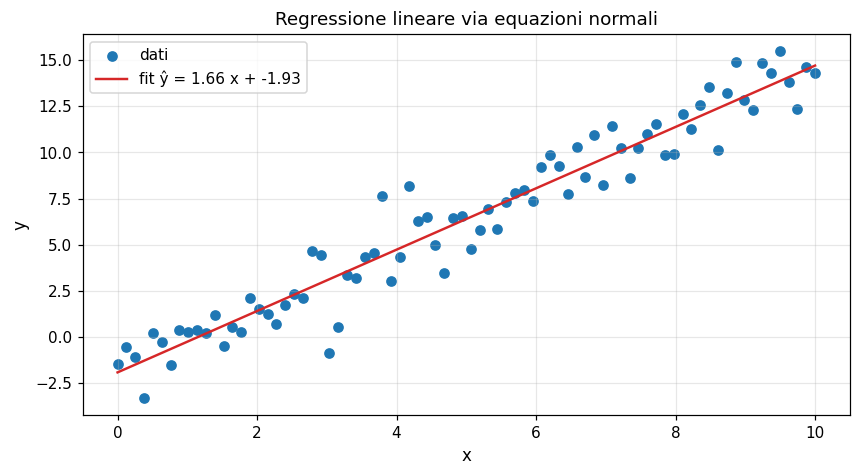

In [90]:
# Generiamo dati con rumore e stimiamo i parametri
rng = np.random.default_rng(1)
N = 80
x_data = np.linspace(0, 10, N)
a_true, b_true = 1.7, -2.0
y_data = a_true*x_data + b_true + 1.5*rng.standard_normal(N)

A = np.column_stack([x_data, np.ones(N)])
theta_hat = np.linalg.solve(A.T @ A, A.T @ y_data)
a_hat, b_hat = theta_hat
print(f"a stimato = {a_hat:.3f}  (vero {a_true})")
print(f"b stimato = {b_hat:.3f}  (vero {b_true})")

fig, ax = plt.subplots()
ax.scatter(x_data, y_data, label="dati")
ax.plot(x_data, A @ theta_hat, "C3", label=f"fit ŷ = {a_hat:.2f} x + {b_hat:.2f}")
ax.set_xlabel("x"); ax.set_ylabel("y")
ax.set_title("Regressione lineare via equazioni normali")
ax.legend(); plt.show()


## E.2 Galleria avanzata di finestre + indicatori spettrali

Ogni finestra è un compromesso fra:

* **larghezza del lobo principale** (worsens risoluzione in frequenza);
* **livello dei lobi laterali** (worsens dynamic range / leakage).

Calcoliamo entrambi numericamente per varie finestre.


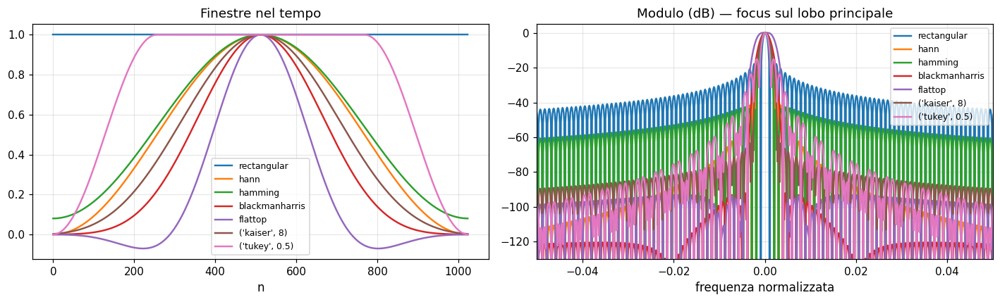


finestra                   BW -3 dB  max side-lobe [dB]
rectangular                  0.0007                -3.9
hann                         0.0012                -3.3
hamming                      0.0012                -4.0
blackmanharris               0.0017                -3.3
flattop                      0.0034                -3.1
('kaiser', 8)                0.0015                -3.7
('tukey', 0.5)               0.0010                -3.6


In [91]:
# Calcoliamo larghezza lobo principale (a -3 dB) e attenuazione max lobi laterali
N = 1024
win_names = ["rectangular", "hann", "hamming", "blackmanharris", "flattop", ("kaiser", 8), ("tukey", 0.5)]
def make_win(name, N):
    if isinstance(name, tuple):
        return signal.get_window(name, N), str(name)
    if name == "rectangular":
        return np.ones(N), "rectangular"
    return signal.get_window(name, N), name

fig, axes = plt.subplots(1, 2, figsize=(13, 4))
metrics = []
for spec in win_names:
    w, label = make_win(spec, N)
    Wf = np.fft.fftshift(np.fft.fft(w/np.sum(w), n=8*N))
    f  = np.linspace(-0.5, 0.5, 8*N)
    mag_dB = 20*np.log10(np.maximum(np.abs(Wf), 1e-12))
    # Larghezza a -3 dB:
    mid = len(mag_dB)//2
    above = np.where(mag_dB > mag_dB[mid] - 3)[0]
    bw = (above[-1] - above[0])/(8*N)
    # Max lobo laterale: escludiamo la regione del lobo principale
    sidemask = np.ones_like(mag_dB, dtype=bool)
    sidemask[above] = False
    max_side = np.max(mag_dB[sidemask])
    metrics.append((label, bw, max_side - mag_dB[mid]))
    axes[0].plot(w, label=label)
    axes[1].plot(f, mag_dB, label=label)

axes[0].set_title("Finestre nel tempo"); axes[0].set_xlabel("n"); axes[0].legend(fontsize=8)
axes[1].set_xlim(-0.05, 0.05); axes[1].set_ylim(-130, 5)
axes[1].set_title("Modulo (dB) — focus sul lobo principale")
axes[1].set_xlabel("frequenza normalizzata"); axes[1].legend(fontsize=8)
plt.tight_layout(); plt.show()

print("\n{:<20}{:>15}{:>20}".format("finestra", "BW -3 dB", "max side-lobe [dB]"))
for label, bw, sld in metrics:
    print(f"{label:<20}{bw:>15.4f}{sld:>20.1f}")


**Come leggere la tabella.**

* La **rectangular** ha la larghezza minima di lobo principale (massima
  risoluzione in frequenza) ma side-lobe altissimo ⇒ **leakage** importante.
* **Hann/Hamming** sono compromessi onesti, usati come default in molte
  analisi biomediche.
* **Blackman-Harris** e **flat-top** schiacciano i lobi laterali a costo di
  un lobo principale largo: la flat-top è ottimale per **misure di ampiezza**
  precise (calibrazione).
* **Kaiser** è parametrico: scegliendo $\beta$ regoli il compromesso.

## Esercizi appendici

1. Implementare a mano `np.dot` per due vettori di lunghezza 1000 e
   confrontare i tempi.
2. Decimare un EMG sintetico da 4 kHz a 1 kHz; visualizzare lo spettro
   pre/post e verificare l'assenza di aliasing.
3. Calcolare la frequenza istantanea di un PPG sintetico (Appendice C) e
   confrontarla con il rate cardiaco impostato.
4. Implementare l'HRV completo (Appendice D) usando una registrazione di 5
   minuti con `hr_bpm` variabile a $0.1$ Hz.
5. Confrontare la flat-top e la Hann nel misurare l'**ampiezza** di un tono
   puro che cade fra due bin DFT: la flat-top deve sbagliare meno.


# Esercizi finali integrati

Questi esercizi attraversano più capitoli e simulano uno scenario d'esame.

## Esercizio 1 — Convoluzione e analisi spettrale

Dato $h=[1, 2, 1]/4$ e $x[n]=\cos(2\pi 0.05 n)+\tfrac12\cos(2\pi 0.3 n)$ per
$n=0,\dots,127$:

1. calcola $y[n] = (x*h)[n]$;
2. valuta numericamente $H(e^{j\omega})$ e confrontalo con
   $|X[k]|, |Y[k]|$;
3. spiega perché la riga di $h$ scelta è un passabasso "lisciante".

## Esercizio 2 — Progettazione di filtro

Progetta un FIR passabanda 5-15 Hz a $F_s = 250$ Hz con metodo Kaiser,
attenuazione 40 dB, larghezza di transizione 3 Hz. Calcola:

* numero di taps;
* group delay;
* applicazione a un EEG sintetico con alpha 10 Hz più rumore 1/f.

## Esercizio 3 — Stima PSD

Per un AR(1) con $a=0.9$ e $\sigma_w^2 = 1$, $N=2000$:

1. stima la PSD con Welch (`nperseg=64, 256, 1024`);
2. stima la PSD con metodo AR(1) via Yule–Walker manuale;
3. confronta con la PSD teorica $\sigma^2/|1 - a e^{-j\omega}|^2$.

## Esercizio 4 — STFT e wavelet

Costruisci $x(t) = \sin(2\pi 5 t) + \mathbb{1}_{[1,2]}(t)\,\sin(2\pi 40 t)$ per
$t\in[0, 3]$ a $F_s=500$ Hz, e mostra:

1. la STFT con `nperseg = 64, 256`;
2. (se PyWavelets disponibile) lo scalogramma con `morl`;
3. discuti dove la wavelet è preferibile.

## Esercizio 5 — Pipeline ECG completa

Modifica la pipeline del Capitolo 9 per:

1. lavorare con $F_s = 250$ Hz invece di 500;
2. aggiungere un terzo battito ectopico ogni 8 RR;
3. stimare l'**HRV** in banda LF (0.04-0.15 Hz) e HF (0.15-0.4 Hz) sul
   tacogramma ricampionato a 4 Hz.


## Soluzioni guidate (snippet)


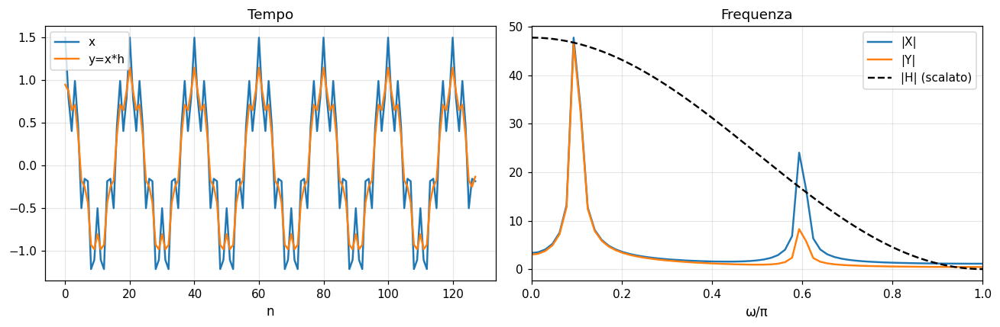

In [92]:
# Soluzione esercizio 1 — convoluzione e DFT
h = np.array([1, 2, 1])/4.0
N = 128; n = np.arange(N)
x = np.cos(2*np.pi*0.05*n) + 0.5*np.cos(2*np.pi*0.30*n)
y = np.convolve(x, h, mode="same")
X = np.fft.fft(x); Y = np.fft.fft(y); k = np.arange(N); omega = 2*np.pi*k/N
H = np.sum(h * np.exp(-1j*omega.reshape(-1,1)*np.arange(len(h))), axis=1)
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].plot(n, x, label="x"); axes[0].plot(n, y, label="y=x*h"); axes[0].legend()
axes[0].set_title("Tempo"); axes[0].set_xlabel("n")
axes[1].plot(omega/np.pi, np.abs(X), label="|X|")
axes[1].plot(omega/np.pi, np.abs(Y), label="|Y|")
axes[1].plot(omega/np.pi, np.abs(H)*np.max(np.abs(X)), "k--", label="|H| (scalato)")
axes[1].set_xlim(0, 1); axes[1].set_xlabel("ω/π"); axes[1].set_title("Frequenza"); axes[1].legend()
plt.tight_layout(); plt.show()


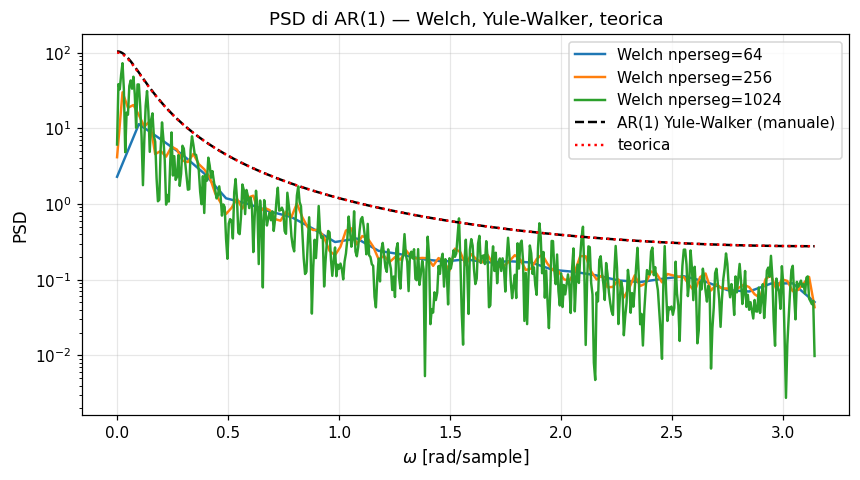

In [93]:
# Soluzione esercizio 3 — PSD AR via Welch e Yule–Walker
N = 2000; a = 0.9; sig2 = 1.0
rng = np.random.default_rng(0)
w = rng.standard_normal(N); x = signal.lfilter([1], [1, -a], w)
# Welch a vari nperseg
fig, ax = plt.subplots()
for np_ in [64, 256, 1024]:
    f_w, P_w = signal.welch(x, fs=2*np.pi, nperseg=np_, window="hann")
    ax.semilogy(f_w, P_w, label=f"Welch nperseg={np_}")
# Yule-Walker AR(1) manuale
lags = np.arange(0, 4)
r = np.array([np.sum(x[L:]*x[:N-L])/N for L in lags])
a1 = r[1]/r[0]; sig2_hat = r[0] - a1*r[1]
omega_grid = np.linspace(0, np.pi, 1024)
S_AR = sig2_hat/np.abs(1 - a1*np.exp(-1j*omega_grid))**2
ax.semilogy(omega_grid, S_AR, "k--", label="AR(1) Yule-Walker (manuale)")
# Teorica
S_th = sig2/np.abs(1 - a*np.exp(-1j*omega_grid))**2
ax.semilogy(omega_grid, S_th, "r:", label="teorica")
ax.set_xlabel(r"$\omega$ [rad/sample]"); ax.set_ylabel("PSD"); ax.legend()
ax.set_title("PSD di AR(1) — Welch, Yule-Walker, teorica")
plt.show()


# Report finale di revisione

**Capitoli aggiunti e/o ampliati rispetto alla versione v2**

* **Capitolo 0** completamente riorganizzato in 10 sezioni progressive (funzioni,
  limiti/derivate/integrali, serie e Taylor, algebra lineare, ortogonalità,
  numeri complessi, analisi complessa, residui, antitrasformata Z, Fourier come
  proiezione). Per ogni sezione: intuizione, definizione, esempio numerico,
  derivazione, codice Python (esplicito **e** ottimizzato), grafico, errori
  comuni, recap.
* **Capitolo 1** riscritto come panoramica dettagliata per **8 famiglie di
  segnali biomedici** (ECG, EEG, EMG, EOG, PPG, BP, respiro, neuronale) con
  origine fisiologica, banda, rumori, analisi tipiche e generatore sintetico in
  Python per ciascuno.
* **Capitolo 2** con dimostrazioni complete: decomposizione a impulsi, sistema
  LTI ↔ convoluzione, BIBO, causalità, autofunzioni. Convoluzione in **tre**
  implementazioni (cicli, Toeplitz, FFT).
* **Capitolo 3** dedicato alla conversione A/D con grafici di campionamento
  corretto, aliasing, spettri replicati, ricostruzione sinc, quantizzazione a
  3/5/8 bit con stima SQNR.
* **Capitolo 4** con DFT come cambio di base, matrice $W_4$ esplicita, DFT
  manuale/matriciale/FFT, Parseval e teorema della convoluzione **dimostrati**,
  leakage, zero-padding, confronto fra 5 finestre.
* **Capitolo 5** con quattro famiglie IIR confrontate sullo stesso grafico, FIR
  con finestratura e Kaiser, notch, filtraggio zero-phase, derivazione e
  significato della trasformazione bilineare, applicazione a ECG sintetico.
* **Capitolo 6** con definizioni di probabilità, distribuzioni comuni, gaussiana
  bivariata a tre coefficienti di correlazione, **Bayes dimostrato** con
  esempio clinico (PPV/NPV) e tabella di contingenza.
* **Capitolo 7** con realizzazioni multiple, media di ensemble vs media
  temporale, autocorrelazione biased/unbiased, Welch a vari `nperseg`,
  Yule–Walker manuale per AR(2), confronto con Welch, rumori bianco/rosa/
  browniano.
* **Capitolo 8** con STFT a finestra corta vs lunga, principio di indeterminazione
  tempo-frequenza, scalogramma wavelet con fallback se PyWavelets non è
  disponibile, EEG sintetico con desincronizzazione alpha.
* **Capitolo 9** è la pipeline ECG completa: generazione, rumori, filtraggio,
  PSD pre/post, spettrogramma, rilevamento R con derivata–squaring–smoothing,
  tacogramma, calcolo BPM.
* **Esercizi finali integrati**, con soluzioni guidate, che attraversano tutti
  i capitoli.

**Formule corrette e ripulite**

* Tutte le formule sono state riscritte in LaTeX compatibile con MathJax di
  Jupyter ($...$ inline, $$...$$ display, `\begin{aligned}` solo dove necessario),
  con parentesi bilanciate, `\left/\right` accoppiati, underscore e apici
  corretti.
* Notazione unificata in tutto il notebook (vedi tabella iniziale).

**Grafici migliorati / aggiunti**

Più di 30 figure dedicate, ciascuna con titolo, etichette degli assi, unità di
misura, legenda e griglia. Sono presenti:

* funzione continua vs sequenza campionata, tangente / area, Taylor di sin,
  proiezione vettoriale, rotazione complessa, cos come somma di esponenziali;
* basi ortonormali e Gram-matrix;
* impulso/gradino/esponenziale/sinusoidi periodiche e non;
* convoluzione passo-passo, matrice Toeplitz;
* sampling corretto vs aliasing, spettro replicato, ricostruzione sinc;
* quantizzazione a vari bit + SQNR;
* matrice DFT esplicita, leakage, zero-padding, 5 finestre;
* IIR famiglie confrontate, FIR Hamming/Kaiser, notch + bandpass;
* filtfilt vs lfilter;
* PDF/CDF Normali, scatter bivariati a $\rho$ diversi, curva PPV;
* realizzazioni multiple di AR(1), autocorrelazione biased/unbiased,
  periodogramma vs Welch, PSD AR via Yule–Walker, rumori bianco/rosa/browniano;
* STFT a finestra corta/lunga, scalogramma wavelet o fallback;
* pipeline ECG: pulito, rumoroso, ogni rumore separato, post-filtraggio,
  PSD pre/post, spettrogramma, picchi R, tacogramma.

**Librerie usate**

* `numpy`, `matplotlib`, `scipy.signal`, `scipy.fft`, `scipy.linalg`,
  `scipy.stats`.
* `pywt` (**opzionale**: la sezione wavelet usa un fallback con STFT se manca).

**Dipendenze opzionali**

* `PyWavelets` (`pip install PyWavelets`) per il vero scalogramma CWT.

**Limiti residui**

* Il segnale ECG/EEG/EMG generato è **sintetico** e didattico; non sostituisce
  dataset clinici reali (PhysioNet/MIT-BIH per ECG, BCI Competition per EEG,
  ecc.).
* L'algoritmo di rilevamento R è una versione minimale di Pan–Tompkins; per
  applicazioni cliniche serve un detector più robusto (soglie adattive,
  finestre di ricerca, controllo qualità).
* La derivazione del principio di indeterminazione tempo-frequenza è
  presentata in forma intuitiva; la dimostrazione completa via Cauchy–Schwarz
  è citata ma non esplicitamente scritta.

**Come continuare lo studio**

* *Oppenheim & Schafer*, *Discrete-Time Signal Processing*.
* *Proakis & Manolakis*, *Digital Signal Processing*.
* *Rangayyan*, *Biomedical Signal Analysis*.
* *Sornmo & Laguna*, *Bioelectrical Signal Processing*.
* *Kay*, *Modern Spectral Estimation*.
* *Mallat*, *A Wavelet Tour of Signal Processing*.
